# Importing modules and setting

In [1]:
import pandas as pd
import random
import math
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder

In [2]:
def seed_everything(seed):
    random.seed(seed) #파이썬 자체 모듈 random 모듈의 시드 고정
    os.environ['PYTHONHASHSEED'] = str(seed) 
    np.random.seed(seed)
    
seed_everything(37)

In [3]:
# 한글 폰트 설정
import matplotlib.pyplot as plt
import platform

path = "c:/Windows/Fonts/malgun.ttf"
from matplotlib import font_manager, rc

if platform.system() == 'Darwin':
    plt.rcParams["font.family"] = 'AppleGothic'

elif platform.system() == 'Windows':
    font_name = font_manager.FontProperties(fname=path).get_name()
    plt.rcParams["font.family"] = font_name
elif platform.system() == 'Linux':
    plt.rcParams['font.family'] = 'NanumGothic'


plt.rcParams['axes.unicode_minus'] = False

# Importing data

In [4]:
train = pd.read_csv('./data/train.csv')
test = pd.read_csv('./data/test.csv')

# EDA

## 데이터 확인

In [5]:
train.head()

,PRODUCT_ID,Y_Class,Y_Quality,TIMESTAMP,LINE,PRODUCT_CODE,X_1,X_2,X_3,X_4,...,X_2866,X_2867,X_2868,X_2869,X_2870,X_2871,X_2872,X_2873,X_2874,X_2875
0,TRAIN_000,1,0.533433,2022-06-13 5:14,T050304,A_31,NaN,NaN,NaN,NaN,...,39.34,40.89,32.56,34.09,77.77,NaN,NaN,NaN,NaN,NaN
1,TRAIN_001,2,0.541819,2022-06-13 5:22,T050307,A_31,NaN,NaN,NaN,NaN,...,38.89,42.82,43.92,35.34,72.55,NaN,NaN,NaN,NaN,NaN
2,TRAIN_002,1,0.531267,2022-06-13 5:30,T050304,A_31,NaN,NaN,NaN,NaN,...,39.19,36.65,42.47,36.53,78.35,NaN,NaN,NaN,NaN,NaN
3,TRAIN_003,2,0.537325,2022-06-13 5:39,T050307,A_31,NaN,NaN,NaN,NaN,...,37.74,39.17,52.17,30.58,71.78,NaN,NaN,NaN,NaN,NaN
4,TRAIN_004,1,0.531590,2022-06-13 5:47,T050304,A_31,NaN,NaN,NaN,NaN,...,38.70,41.89,46.93,33.09,76.97,NaN,NaN,NaN,NaN,NaN


In [6]:
test.head()

,PRODUCT_ID,TIMESTAMP,LINE,PRODUCT_CODE,X_1,X_2,X_3,X_4,X_5,X_6,...,X_2866,X_2867,X_2868,X_2869,X_2870,X_2871,X_2872,X_2873,X_2874,X_2875
0,TEST_000,2022-09-09 2:01,T100306,T_31,2.0,94.0,0.0,45.0,10.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,TEST_001,2022-09-09 2:09,T100304,T_31,2.0,93.0,0.0,45.0,11.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,TEST_002,2022-09-09 8:42,T100304,T_31,2.0,95.0,0.0,45.0,11.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,TEST_003,2022-09-09 10:56,T010305,A_31,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,TEST_004,2022-09-09 11:04,T010306,A_31,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
train.describe()

,Y_Class,Y_Quality,X_1,X_2,X_3,X_4,X_5,X_6,X_7,X_8,...,X_2866,X_2867,X_2868,X_2869,X_2870,X_2871,X_2872,X_2873,X_2874,X_2875
count,598.000000,598.000000,349.000000,349.000000,349.0,349.0,349.000000,349.0,349.000000,349.000000,...,100.000000,100.00000,100.000000,100.000000,100.00000,99.0,0.0,0.0,0.0,0.0
mean,1.025084,0.530896,2.409742,95.123209,0.0,45.0,10.392550,0.0,48.802292,10.048711,...,50.807300,53.60770,49.606200,51.659800,66.64970,1.0,NaN,NaN,NaN,NaN
std,0.565069,0.007401,5.895256,4.107640,0.0,0.0,0.489019,0.0,4.373824,0.215571,...,7.011828,8.13899,7.158917,8.913065,4.52781,0.0,NaN,NaN,NaN,NaN
min,0.000000,0.500856,1.000000,87.000000,0.0,45.0,10.000000,0.0,45.000000,10.000000,...,32.120000,31.70000,32.560000,30.490000,61.67000,1.0,NaN,NaN,NaN,NaN
25%,1.000000,0.527535,2.000000,93.000000,0.0,45.0,10.000000,0.0,45.000000,10.000000,...,49.485000,52.20000,42.160000,49.915000,63.64500,1.0,NaN,NaN,NaN,NaN
50%,1.000000,0.530436,2.000000,95.000000,0.0,45.0,10.000000,0.0,45.000000,10.000000,...,53.425000,55.92500,51.460000,56.175000,65.14000,1.0,NaN,NaN,NaN,NaN
75%,1.000000,0.533433,2.000000,98.000000,0.0,45.0,11.000000,0.0,51.000000,10.000000,...,55.287500,58.97500,55.030000,57.175000,67.11500,1.0,NaN,NaN,NaN,NaN
max,2.000000,0.578841,103.000000,102.000000,0.0,45.0,11.000000,0.0,62.000000,11.000000,...,60.240000,68.66000,60.410000,59.930000,79.75000,1.0,NaN,NaN,NaN,NaN


In [8]:
train.describe(include = 'object')

,PRODUCT_ID,TIMESTAMP,LINE,PRODUCT_CODE
count,598,598,598,598
unique,598,598,6,3
top,TRAIN_000,2022-06-13 5:14,T100304,T_31
freq,1,1,175,343


## 결측치 및 데이터 타입 확인

In [9]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 598 entries, 0 to 597
Columns: 2881 entries, PRODUCT_ID to X_2875
dtypes: float64(2876), int64(1), object(4)
memory usage: 13.1+ MB


### 컬럼이 너무 많기 때문에 info함수로 전체 결측치 분포를 파악할 수 없었다. 데이터 타입은 대부분이 float64로 수치형이며, Y_Class가 int형, 나머지 PRODUCT_ID, TIMESTAMP, LINE, PRODUCT_CODE등이 object형으로 나타나 있다.

### 아래는 결측치를 파악하기 위해 데이터를 시각화 한 bar plot이다.

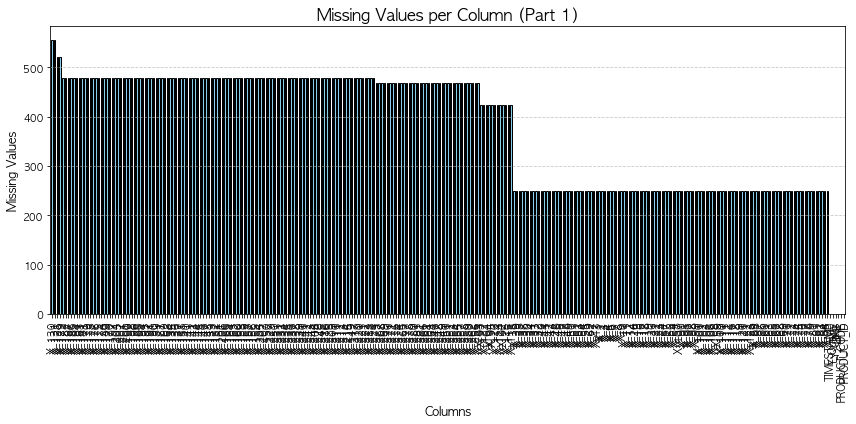

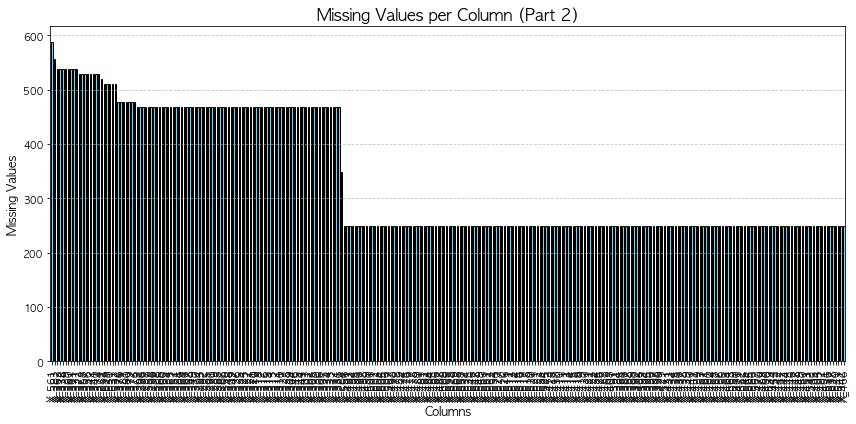

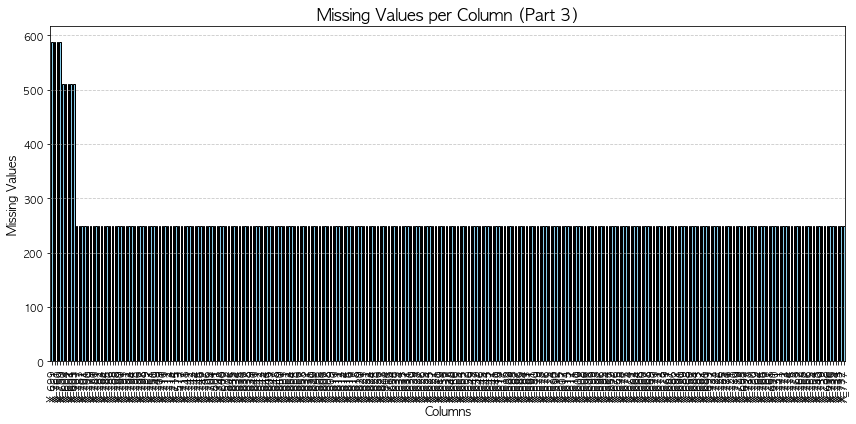

In [10]:
missing_values_per_column = train.isnull().sum()

# 결측치가 있는 컬럼만 필터링
#missing_values_per_column = missing_values_per_column[missing_values_per_column > 0]

# 컬럼이 너무 많아서 컬럼 10등분 분할
columns_split = np.array_split(missing_values_per_column.index, 10)

for i, column_group in enumerate(columns_split):
    if i >= 3 :
        break
    plt.figure(figsize=(12, 6))
    missing_values_per_column[column_group].sort_values(ascending=False).plot(
        kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Missing Values per Column (Part {i+1})', fontsize=16)
    plt.xlabel('Columns', fontsize=12)
    plt.ylabel('Missing Values', fontsize=12)
    plt.xticks(rotation=90)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()


### 결측치가 공정 과정에서의 실수나 변수에 의한게 아니라 규칙적으로, 기록되지 않고 있다고 판단할 수 있었다.

 (만약 공정과정에서의 실수나 변수에 의해서 기록되지 않은 결측치라면, 결측치에서 컬럼 별 결측치가 값은 값들이 나오기 어려울 것이라 판단했기 때문이다. 즉, 위와 같은 그래프처럼 일자로 bar plot이 그려지지 않을 것이라 생각한다.)

### 따라서 어떠한 규칙이 있는지 더 파악하기 위해 TIMESTAMP나 PRODUCT_CODE, LINE등의 컬럼을 이용해 데이터를 나눠보고 데이터를 다시 시각화 해 보았다.

1. TIMESTAMP로 데이터 나누기

In [11]:
train['TIMESTAMP'] = pd.to_datetime(train['TIMESTAMP'], format='%Y-%m-%d %H:%M', errors='coerce')

min_timestamp = train['TIMESTAMP'].min()
max_timestamp = train['TIMESTAMP'].max()

print("최소 TIMESTAMP:", min_timestamp)
print("최대 TIMESTAMP:", max_timestamp)

최소 TIMESTAMP: 2022-06-13 05:14:00
최대 TIMESTAMP: 2022-09-08 22:47:00


월별 데이터 나누기

In [12]:
# 새로운 컬럼 'Month' 추가
train['Month'] = train['TIMESTAMP'].dt.month

grouped_data = train.groupby('Month')

june_data = grouped_data.get_group(6) 
july_data = grouped_data.get_group(7) 
august_data = grouped_data.get_group(8) 
september_data = grouped_data.get_group(9)

6월

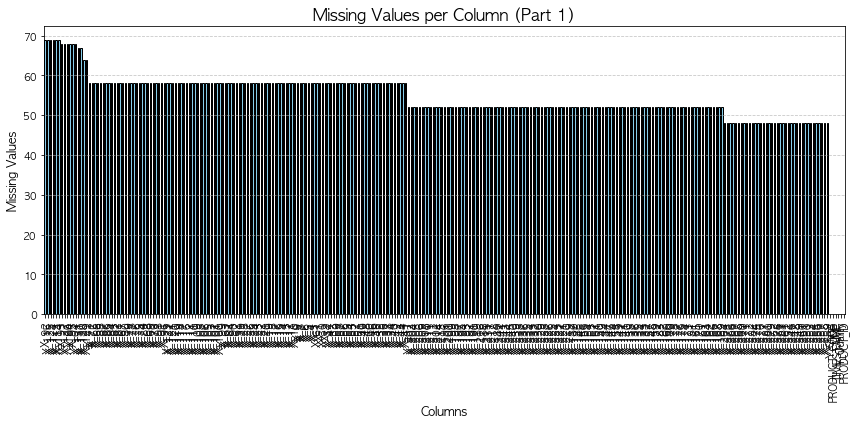

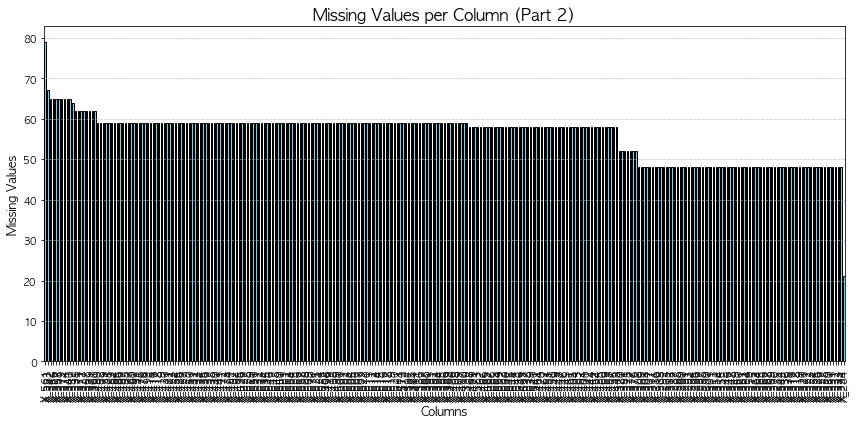

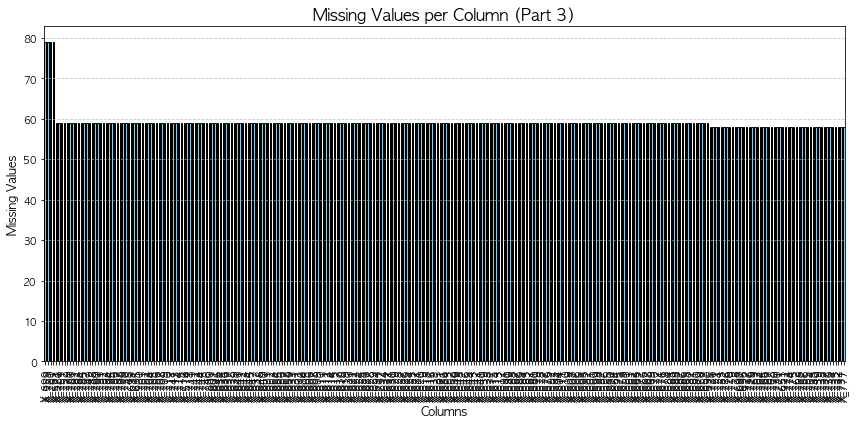

In [13]:
missing_values_per_column = june_data.isnull().sum()

# 컬럼이 너무 많아서 컬럼 10등분 분할
columns_split = np.array_split(missing_values_per_column.index, 10)

for i, column_group in enumerate(columns_split):
    if i >= 3:
        break
    plt.figure(figsize=(12, 6))
    missing_values_per_column[column_group].sort_values(ascending=False).plot(
        kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Missing Values per Column (Part {i+1})', fontsize=16)
    plt.xlabel('Columns', fontsize=12)
    plt.ylabel('Missing Values', fontsize=12)
    plt.xticks(rotation=90)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

7월, 8월, 9월 생략

시간별 데이터 나누기

In [14]:
# 새로운 컬럼 'Hour' 추가
train['Hour'] = train['TIMESTAMP'].dt.hour

grouped_data2 = train.groupby('Hour')

zero_data = grouped_data2.get_group(0) 
six_data = grouped_data2.get_group(6) 
twelve_data = grouped_data2.get_group(12) 
eighteen_data = grouped_data2.get_group(18)

0시

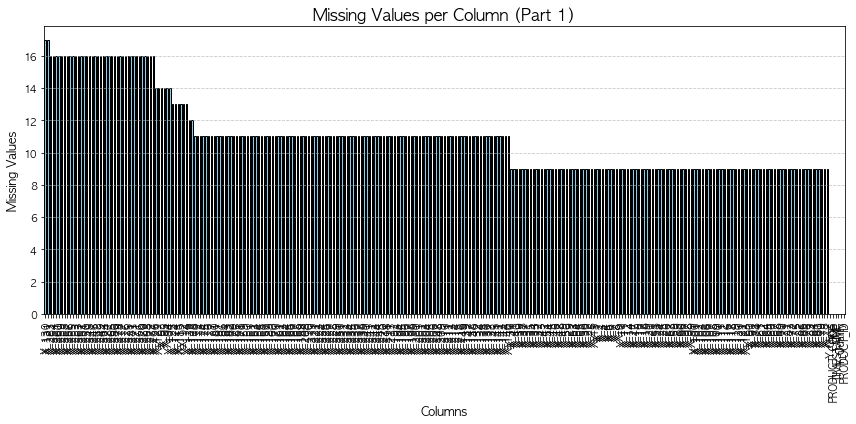

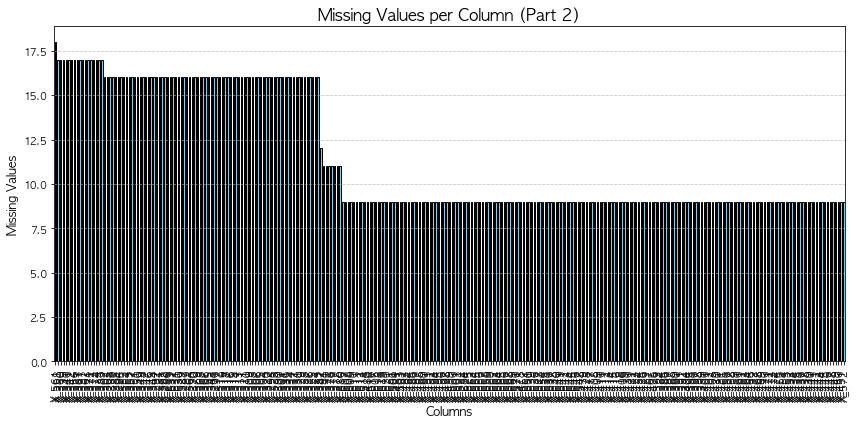

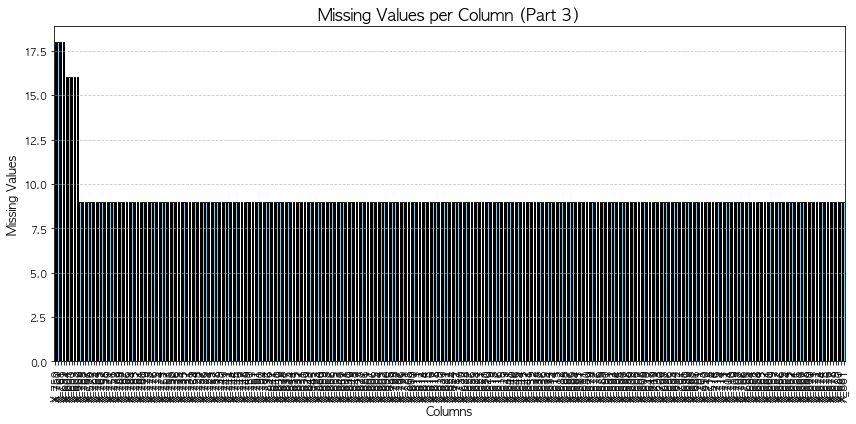

In [15]:
missing_values_per_column = zero_data.isnull().sum()

# 컬럼이 너무 많아서 컬럼 10등분 분할
columns_split = np.array_split(missing_values_per_column.index, 10)

for i, column_group in enumerate(columns_split):
    if i >= 3:
        break
    plt.figure(figsize=(12, 6))
    missing_values_per_column[column_group].sort_values(ascending=False).plot(
        kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Missing Values per Column (Part {i+1})', fontsize=16)
    plt.xlabel('Columns', fontsize=12)
    plt.ylabel('Missing Values', fontsize=12)
    plt.xticks(rotation=90)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

나머지 시간도 생략 (1시~23시)

### 결론 : 월별 혹은 시간별로 나눈 데이터에서는 특별한 특징을 찾지 못함. 

### 2. PRODUCT_CODE로 데이터 나누기

In [16]:
a_data = train[train.PRODUCT_CODE=='A_31']
t_data = train[train.PRODUCT_CODE=='T_31']
o_data = train[train.PRODUCT_CODE=='O_31']

A_31 제품

In [ ]:
missing_values_per_column = a_data.isnull().sum()

# 컬럼이 너무 많아서 컬럼 10등분 분할
columns_split = np.array_split(missing_values_per_column.index, 10)

for i, column_group in enumerate(columns_split):
    if i >= 3:
        break
    plt.figure(figsize=(12, 6))
    missing_values_per_column[column_group].sort_values(ascending=False).plot(
        kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Missing Values per Column (Part {i+1})', fontsize=16)
    plt.xlabel('Columns', fontsize=12)
    plt.ylabel('Missing Values', fontsize=12)
    plt.xticks(rotation=90)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

### 제품 코드별로 데이터로 나누니 결측치가 하나도 없는 컬럼들이 다수 존재하는 것을 발견했고, 공정 과정에서 제품별로 기록되는 컬럼이 다른 게 아닐까 생각했습니다. 

T_31 제품

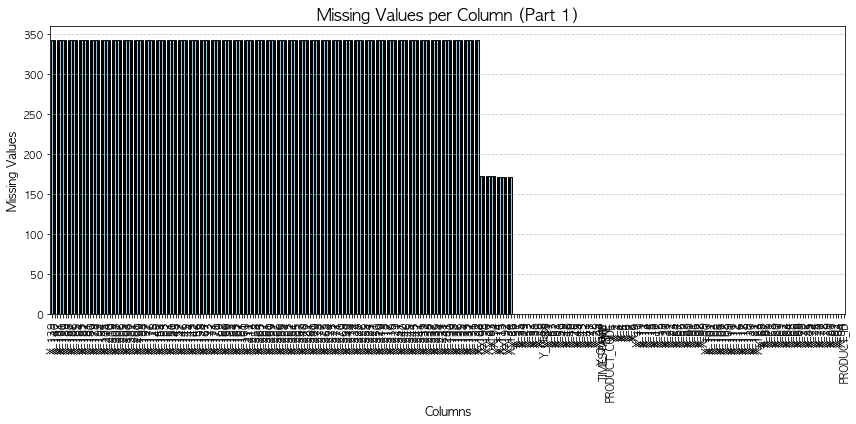

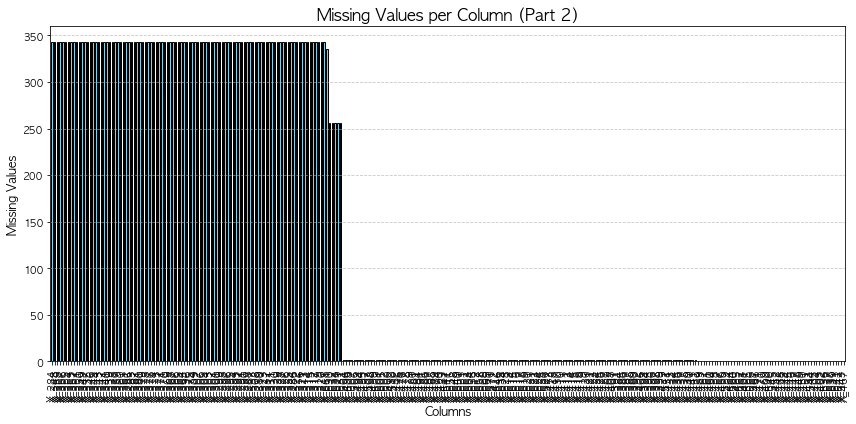

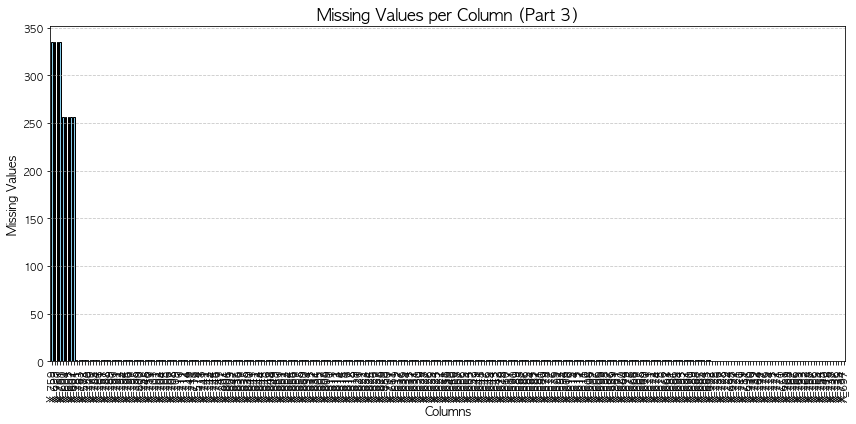

In [17]:
missing_values_per_column = t_data.isnull().sum()

# 컬럼이 너무 많아서 컬럼 10등분 분할
columns_split = np.array_split(missing_values_per_column.index, 10)

for i, column_group in enumerate(columns_split):
    if i >= 3:
        break
    plt.figure(figsize=(12, 6))
    missing_values_per_column[column_group].sort_values(ascending=False).plot(
        kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Missing Values per Column (Part {i+1})', fontsize=16)
    plt.xlabel('Columns', fontsize=12)
    plt.ylabel('Missing Values', fontsize=12)
    plt.xticks(rotation=90)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

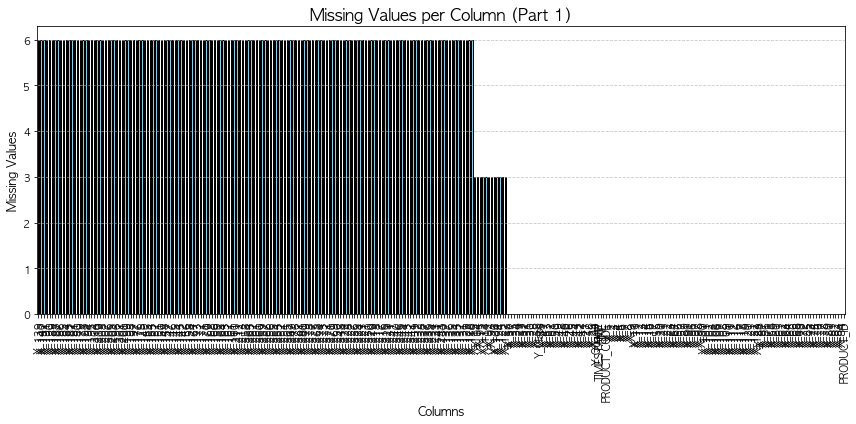

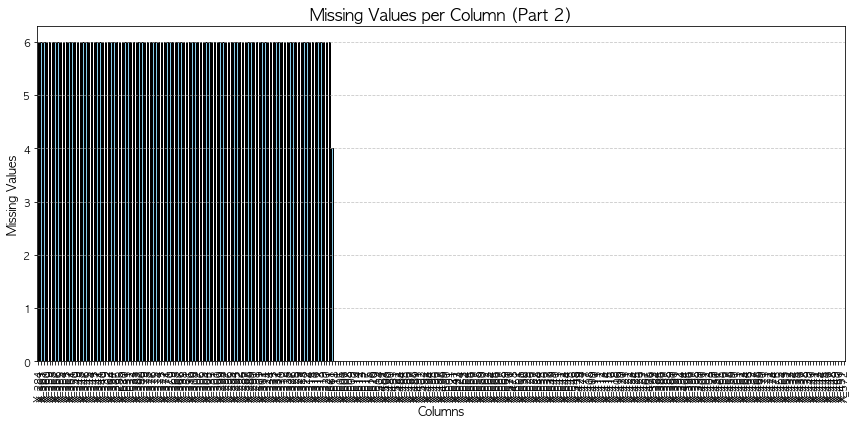

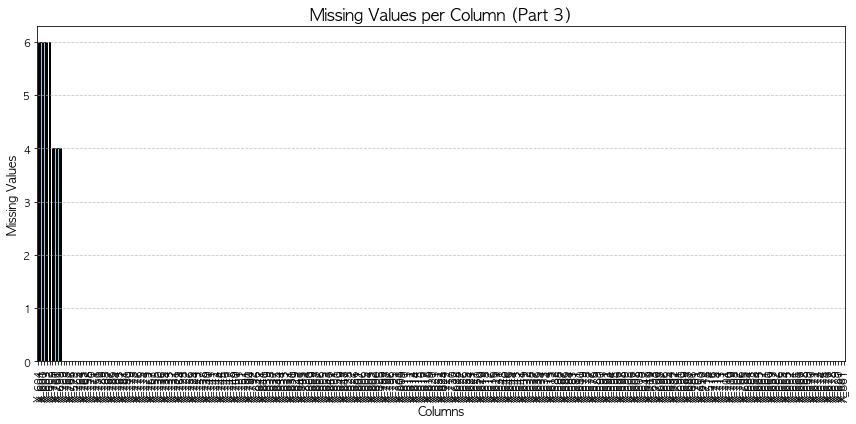

In [18]:
missing_values_per_column = o_data.isnull().sum()

# 컬럼이 너무 많아서 컬럼 10등분 분할
columns_split = np.array_split(missing_values_per_column.index, 10)

for i, column_group in enumerate(columns_split):
    if i >= 3:
        break
    plt.figure(figsize=(12, 6))
    missing_values_per_column[column_group].sort_values(ascending=False).plot(
        kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Missing Values per Column (Part {i+1})', fontsize=16)
    plt.xlabel('Columns', fontsize=12)
    plt.ylabel('Missing Values', fontsize=12)
    plt.xticks(rotation=90)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

In [19]:
train.PRODUCT_CODE.value_counts()

T_31    343
A_31    249
O_31      6
Name: PRODUCT_CODE, dtype: int64

### 3. LINE별로 데이터 나누기

In [20]:
train.LINE.unique()

array(['T050304', 'T050307', 'T100304', 'T100306', 'T010306', 'T010305'],
      dtype=object)

In [21]:
a_data.LINE.unique()

array(['T050304', 'T050307', 'T010306', 'T010305'], dtype=object)

In [22]:
t_data.LINE.unique()

array(['T100304', 'T100306'], dtype=object)

In [23]:
o_data.LINE.unique()

array(['T100304', 'T100306'], dtype=object)

### A_31 제품의 경우 4가지의 라인을 이용하지만, T_31 제품과 O_31 제품은 같은 2개의 라인을 이용한다는 것을 발견했습니다.

## 결론 : 기본적으로 데이터 샘플 수에 비해 컬럼이 너무 많기 때문에 과적합 가능성이 높아 컬럼을 제거해야 하는 상황에서, 제품별로 기록되는 컬럼이 상이하고 각 제품마다 중요한 컬럼이 다를 수 있기에, 제품별로 데이터를 나누어 모델을 각각 학습시키기로 결정했습니다. 

### 하지만 O_31 제품의 경우, 샘플이 6개이기 때문에 따로 학습하기엔 과적합 가능성이 높고, T_31 제품과 동일한 라인을 사용하기 때문에 O_31 제품과 T_31 제품은 같이 학습시키는 게 맞다고 판단했습니다.

In [24]:
a_df = train[train.PRODUCT_CODE=='A_31']
to_df = train[(train.PRODUCT_CODE=='T_31')|(train.PRODUCT_CODE=='O_31')]

### A_31 제품과 나머지 두 제품은 아예 다른 제품으로 추론해 볼 수 있고, T_31 제품과 O_31 제품은 기본적으로 같은 제품이지만, 버전이 다른 제품이라고 상상하며 의사결정을 했습니다.

In [25]:
a_df = a_df.drop(columns = ['Month', 'Hour'], axis = 1) #새롭게 만든 컬럼으로 더이상 필요없기에 삭제
to_df = to_df.drop(columns = ['Month', 'Hour'], axis = 1)

## 종속 변수 분포 확인

0은 적정 기준 미달(부적합), 1은 적합, 2는 적정 기준 초과(부적합)

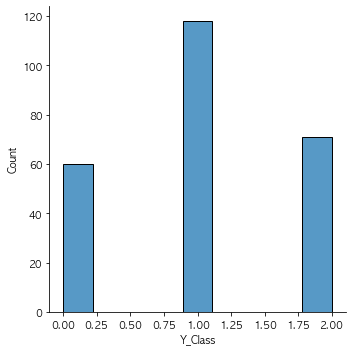

In [26]:
sns.displot(a_df['Y_Class'])

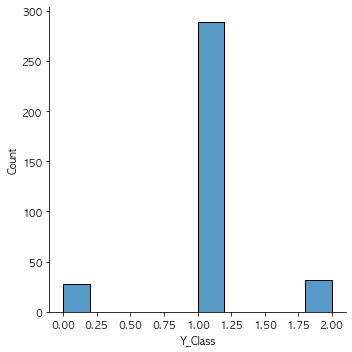

In [27]:
sns.displot(to_df['Y_Class'])

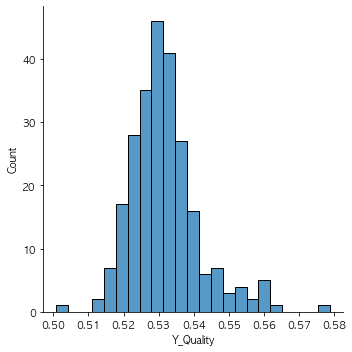

In [28]:
sns.displot(a_df['Y_Quality'])

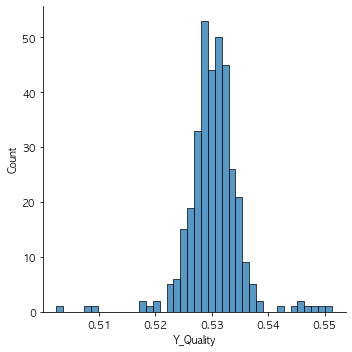

In [29]:
sns.displot(to_df['Y_Quality'])

In [30]:
train['Y_Quality'].min(), train['Y_Quality'].max()

(0.500855556, 0.57884127)

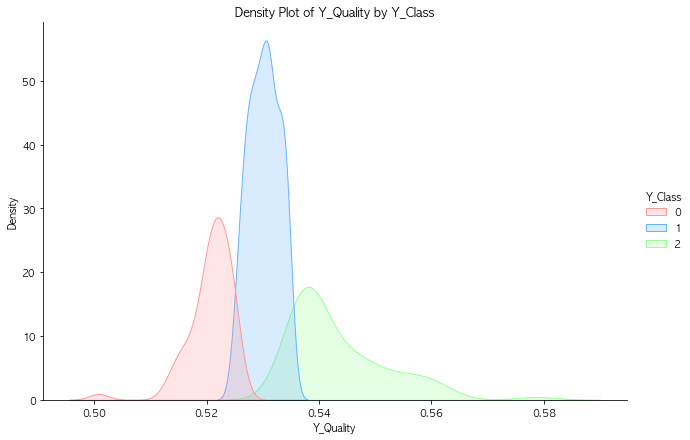

In [31]:
sns.displot(
    data=a_df,
    x='Y_Quality',
    hue='Y_Class',
    kind='kde',
    fill=True,
    palette=['#ff9999', '#66b3ff', '#99ff99'],
    height=6,
    aspect=1.5
)

plt.title('Density Plot of Y_Quality by Y_Class')
plt.xlabel('Y_Quality')
plt.ylabel('Density')
plt.show()

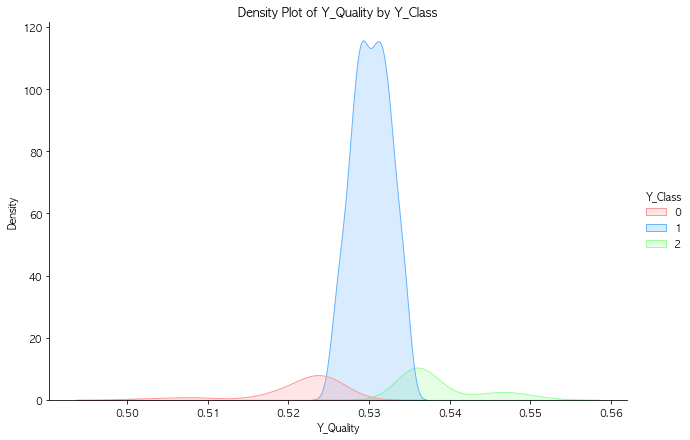

In [32]:
sns.displot(
    data=to_df,
    x='Y_Quality',
    hue='Y_Class',
    kind='kde',
    fill=True,
    palette=['#ff9999', '#66b3ff', '#99ff99'],
    height=6,
    aspect=1.5
)

plt.title('Density Plot of Y_Quality by Y_Class')
plt.xlabel('Y_Quality')
plt.ylabel('Density')
plt.show()

### Y_Quality는 대략 0.500에서 0.578의 범위에 분포하며, Y_Class 값(0, 1, 2)에 따라 색상으로 구분해 본 결과, Y_Class가 0과 1인 데이터뿐만 아니라 1과 2인 데이터도 경계가 명확하지 않고 상당 부분 겹쳐져 있다. 전체적으로 Y_Class 값 간의 분포가 서로 겹쳐 있어 구분이 어려운 경향을 보인다.

### 스마트 팩토리 공정 데이터의 특성상, 여러 컬럼들이 제품의 퀄리티에 수치적으로 영향을 미치지만, 특정 컬럼 한두 개의 값만 부적합해도 해당 제품이 하자로 판정될 수 있다. 이러한 특성이 데이터 분포에서 Y_Class 간 경계가 명확하지 않은 경향으로 나타나는 원인일 수 있다고 생각했다.

## 범주형 데이터 확인

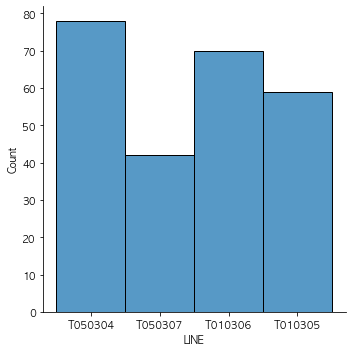

In [33]:
sns.displot(a_df['LINE'])

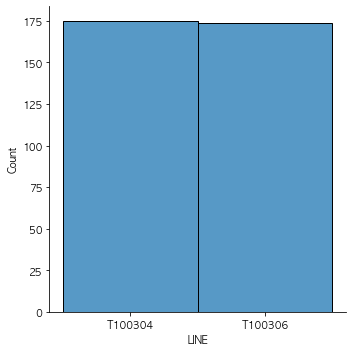

In [34]:
sns.displot(to_df['LINE'])

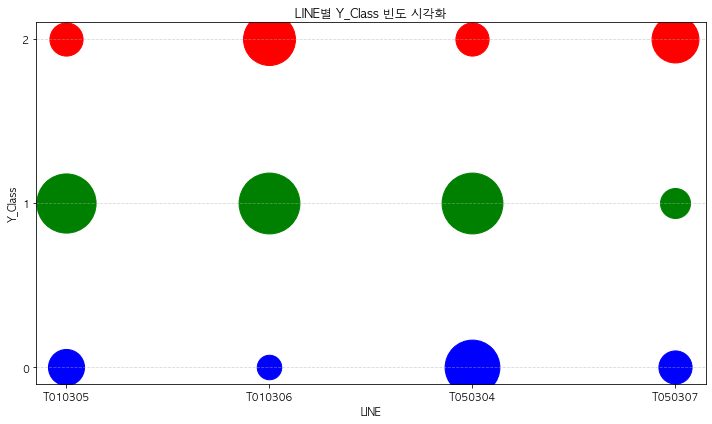

In [35]:
count_df = a_df.groupby(['LINE', 'Y_Class']).size().reset_index(name='count')

plt.figure(figsize=(10, 6))

# LINE 별로 데이터 분리 후 점 찍기
lines = count_df['LINE'].unique()
y_classes = count_df['Y_Class'].unique()
colors = ['blue', 'green', 'red']

for i, line in enumerate(lines):
    subset = count_df[count_df['LINE'] == line]
    for j, y_class in enumerate(y_classes):
        value = subset[subset['Y_Class'] == y_class]['count']
        if not value.empty:
            plt.scatter(
                [i], [y_class],  # LINE 값 별 X 위치와 Y_Class 값
                s=value * 100,  # 점의 크기를 빈도수에 비례
                color=colors[j],
                label=f'Y_Class {y_class}' if i == 0 else ""
            )

plt.xticks(range(len(lines)), lines)
plt.yticks(y_classes)
plt.xlabel('LINE')
plt.ylabel('Y_Class')
plt.title('LINE별 Y_Class 빈도 시각화')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

### LINE별 Y_Class 빈도를 시각화해 각 라인에 특별한 문제는 없는지 찾아보았다.

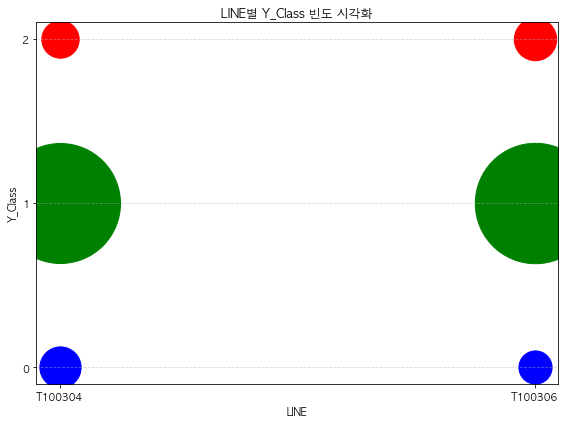

In [36]:
count_df = to_df.groupby(['LINE', 'Y_Class']).size().reset_index(name='count')

plt.figure(figsize=(8, 6))

# LINE 별로 데이터 분리 후 점 찍기
lines = count_df['LINE'].unique()
y_classes = count_df['Y_Class'].unique()
colors = ['blue', 'green', 'red']

for i, line in enumerate(lines):
    subset = count_df[count_df['LINE'] == line]
    for j, y_class in enumerate(y_classes):
        value = subset[subset['Y_Class'] == y_class]['count']
        if not value.empty:
            plt.scatter(
                [i], [y_class],  # LINE 값 별 X 위치와 Y_Class 값
                s=value * 100,  # 점의 크기를 빈도수에 비례
                color=colors[j],
                label=f'Y_Class {y_class}' if i == 0 else ""
            )

plt.xticks(range(len(lines)), lines)
plt.yticks(y_classes)
plt.xlabel('LINE')
plt.ylabel('Y_Class')
plt.title('LINE별 Y_Class 빈도 시각화')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

### A_31 데이터 시각화 그래프에서 T050307 line의 경우, Y_Class가 1인 빈도가 눈에 띄게 적은 것으로 보아 문제가 있을 수 있다고 생각했다. -> LINE 데이터 중요

## 전체 데이터 분포 확인

### 전체 데이터 분포를 확인하며서 각 컬럼과 종속 변수와의 관계도 같이 보기 위해 0, 1, 2 값에 따라 다른 색깔로 histogram을 그려보았다.

A_31 제품

In [37]:
a_df_ = a_df.drop(columns = ['PRODUCT_ID', 'TIMESTAMP', 'PRODUCT_CODE', 'Y_Quality'], axis = 1)
a_df_nullx = a_df_.dropna(axis = 1, how = 'all')

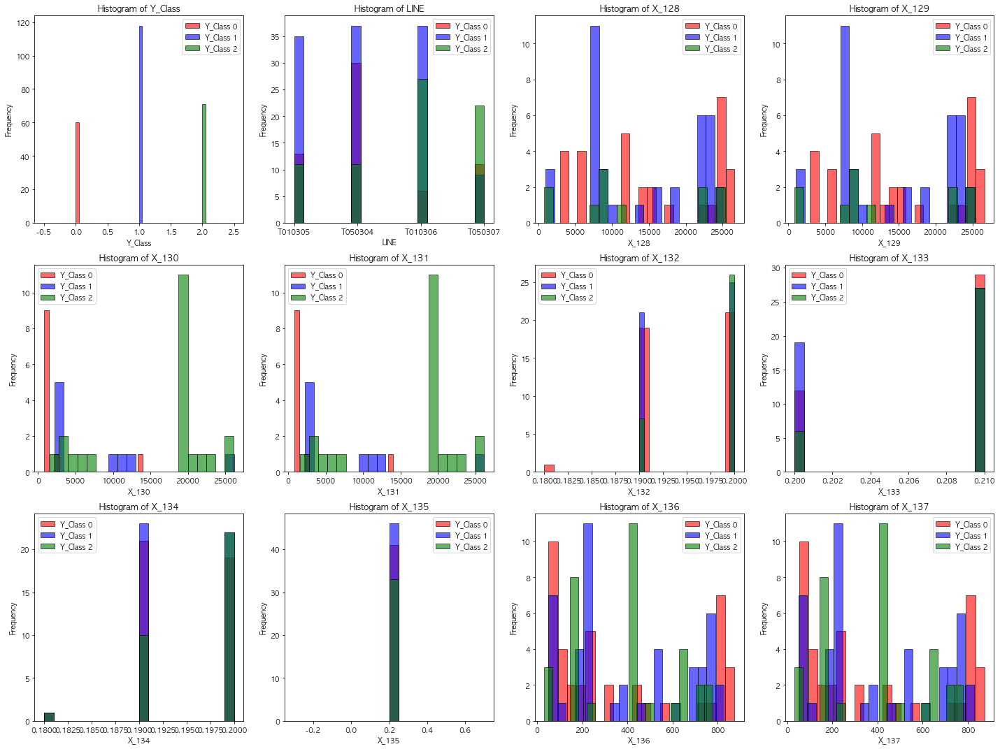

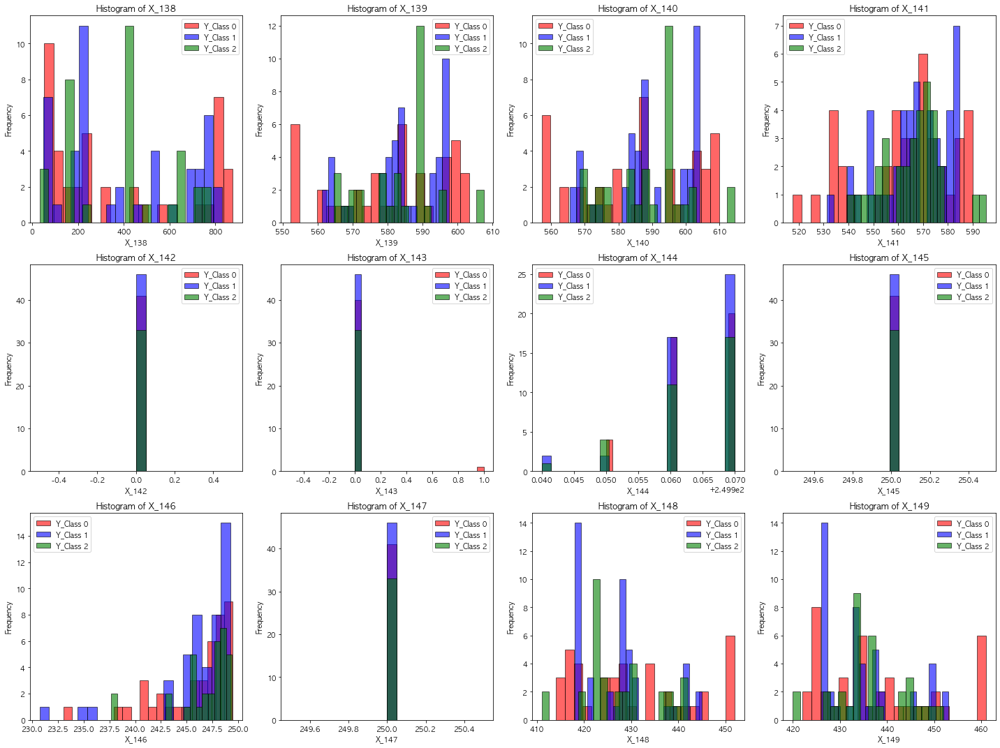

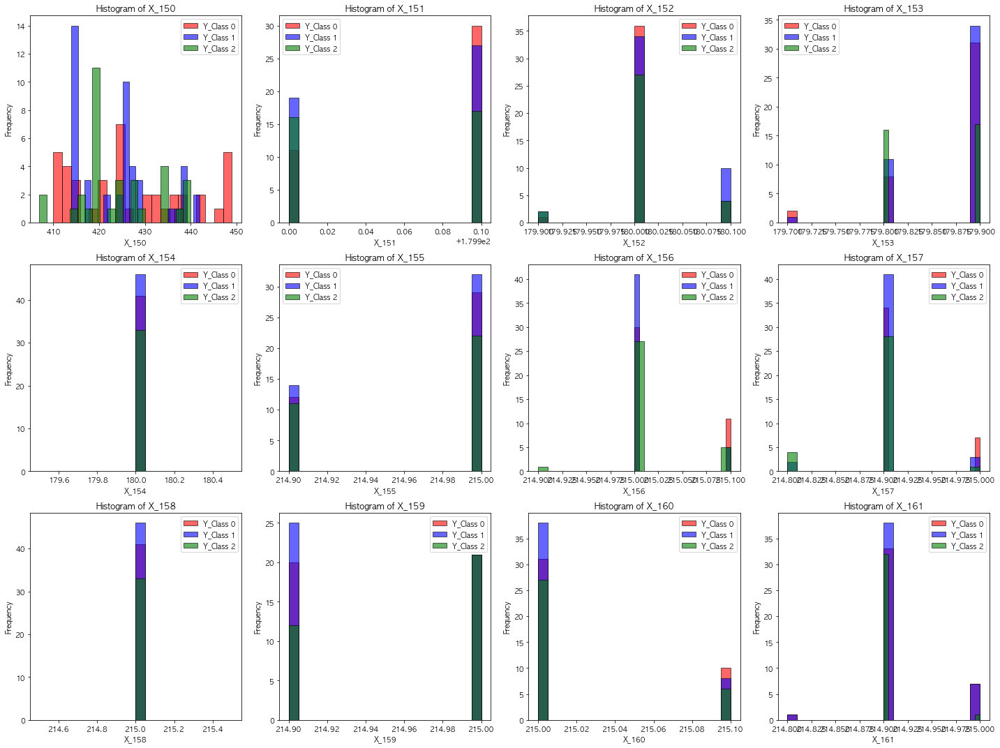

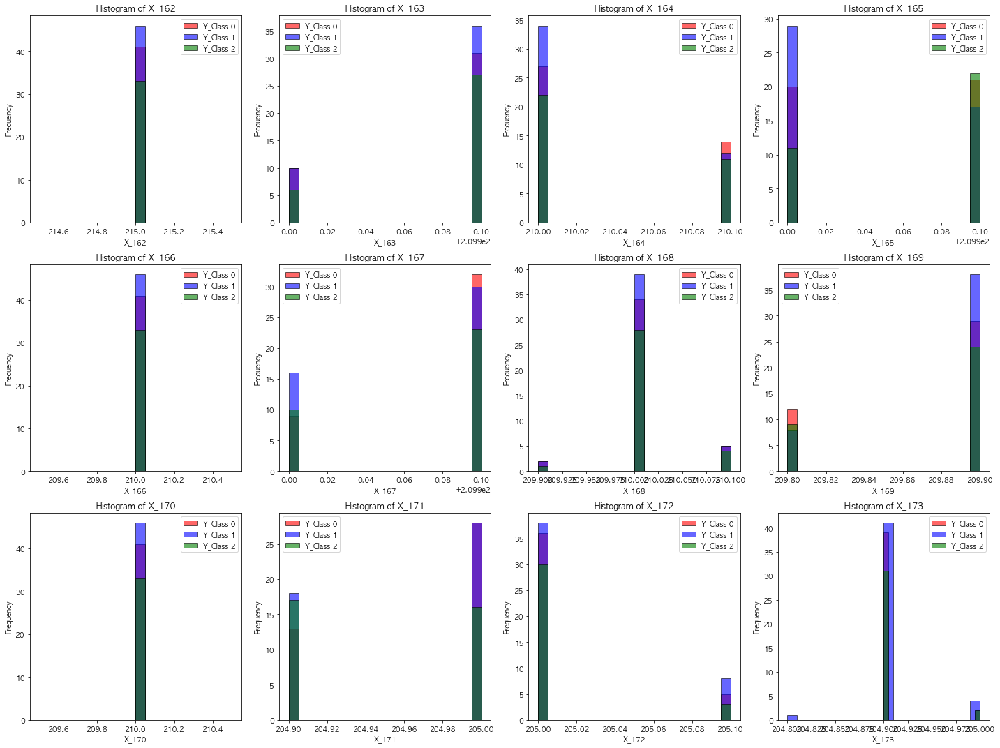

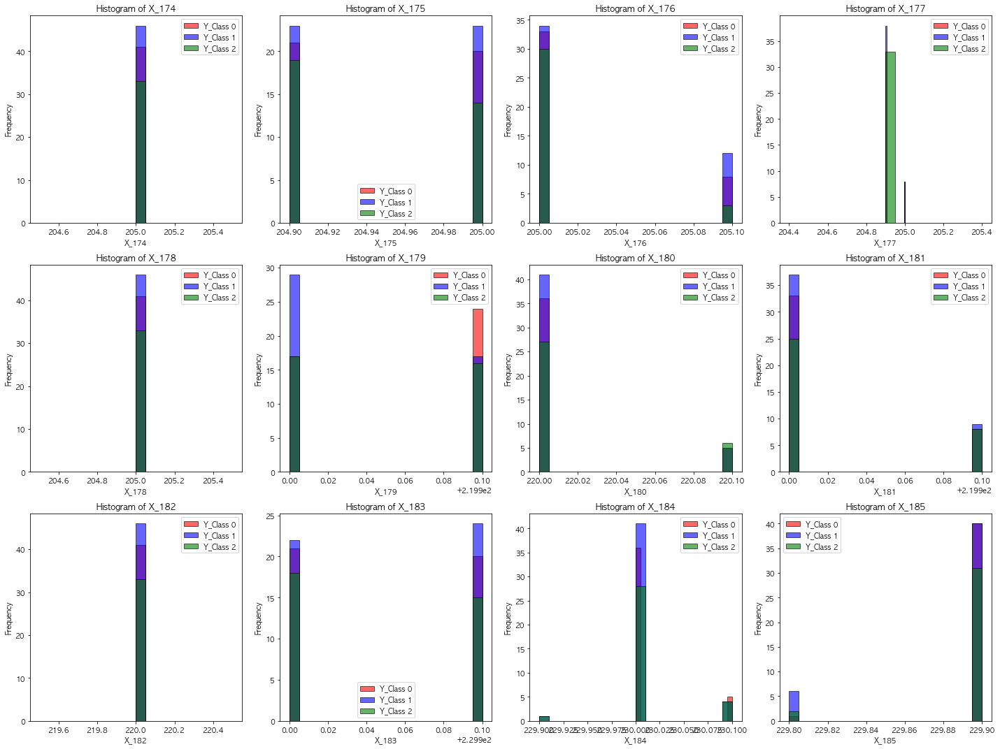

In [38]:
# 12개씩 그리기
columns_per_page = 12
total_columns = len(a_df_nullx.columns)
total_pages = math.ceil(total_columns / columns_per_page)

colors = {0: 'red', 1: 'blue', 2: 'green'}

#for page in range(total_pages): #임의로 for문이 5번만 돌도록 조정
for page in range(5):
    start_idx = page * columns_per_page
    end_idx = start_idx + columns_per_page
    columns_to_plot = a_df_nullx.columns[start_idx:end_idx]
    
    # 서브플롯
    fig, axs = plt.subplots(3, 4, figsize=(20, 15))
    axs = axs.flatten()
    
    for ax, column in zip(axs, columns_to_plot):
        # Y_Class 별로 히스토그램 생성
        for y_class, color in colors.items():
            subset = a_df_nullx[a_df_nullx['Y_Class'] == y_class]
            ax.hist(subset[column].dropna(), bins=20, color=color, edgecolor='black', alpha=0.6, label=f'Y_Class {y_class}')
        
        ax.set_title(f'Histogram of {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequency')
        ax.legend()
    
    for ax in axs[len(columns_to_plot):]:
        ax.axis('off')
        
    plt.tight_layout()
    plt.show()

- 한 번 더 라인 T050307에서 유독 적합의 비율이 낮은 것을 볼 수 있다.
- 라인 T050304에서 유독 적정 기준보다 미달인 부적합의 비율이 높다.
- X_128이나 X_129의 경우 값의 분포가 비슷하고, 부적합이나 적합의 경계가 전혀 없다.
- X_130이나 X_131의 경우도 값의 분포가 비슷하고, 부적합이나 적합의 경계가 전혀 없다. 이렇게 거의 같은 분포의 컬럼이 2개씩 있다는 것은 한 컬럼이 다른 한 컬럼에 큰 영향을 미치는 상황이라 예상해보았다. (이러한 컬럼 쌍이 많다면 상관관계가 높은 컬럼들이 많을 것이다.)
- 위와 같이 부적합과 적합의 경계가 없는 이런 값의 분포가 나타나는 이유는 해당 컬럼들로 인해 적합/부적합 판정이 나는 것이 아니기 때문이라고 생각했다. (위의 값들이 모두 적정값들일 수 있다.)

### 위와 같은 비슷한 분포의 컬럼들은 상관관계 분석을 통해 제거하거나 PCA 과정에서 축소될 것이다.

T_31/O_31 제품

In [39]:
to_df_ = to_df.drop(columns = ['PRODUCT_ID', 'TIMESTAMP', 'PRODUCT_CODE', 'Y_Quality'], axis = 1)
to_df_nullx = to_df_.dropna(axis = 1, how = 'all')

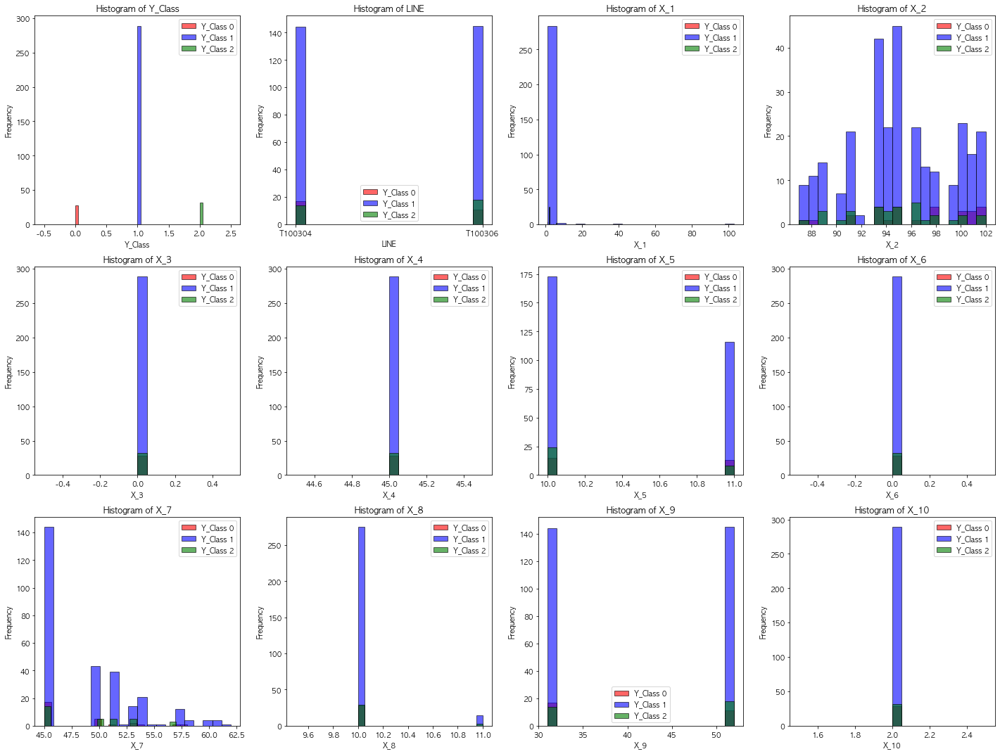

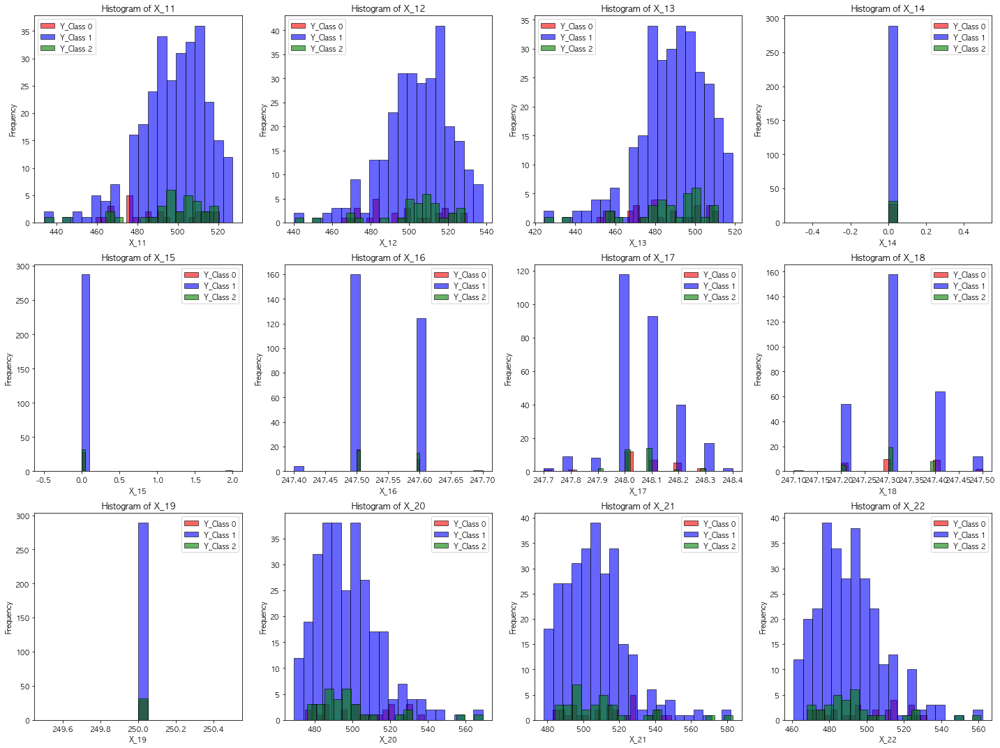

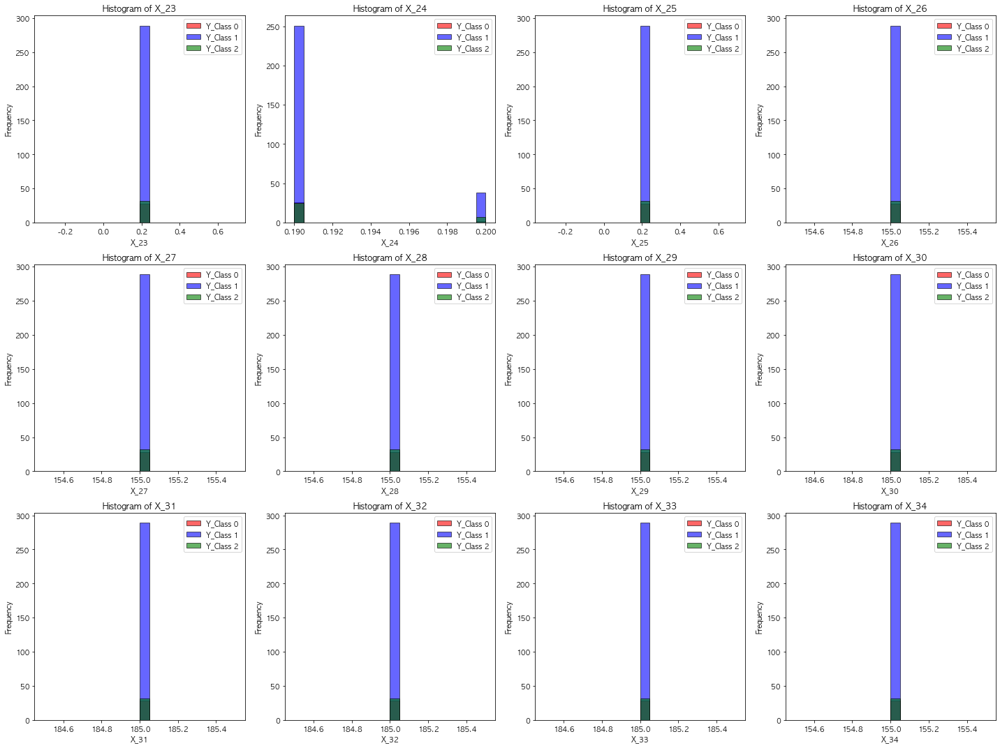

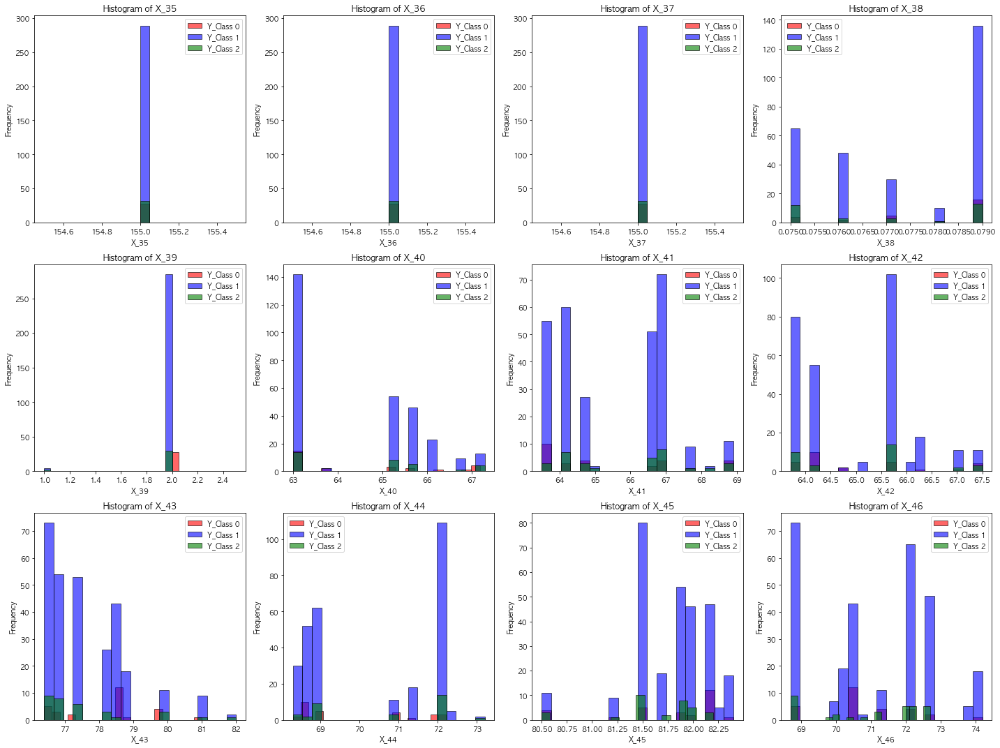

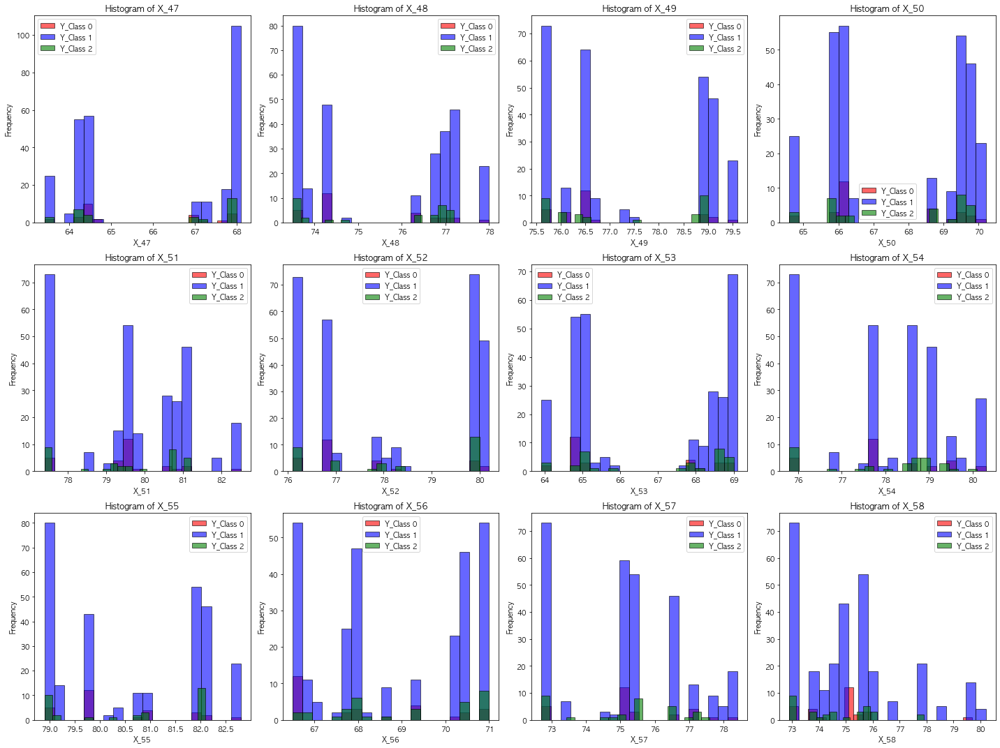

In [40]:
# 12개씩 그리기
columns_per_page = 12
total_columns = len(to_df_nullx.columns)
total_pages = math.ceil(total_columns / columns_per_page)

colors = {0: 'red', 1: 'blue', 2: 'green'}

#for page in range(total_pages): #임의로 for문이 5번만 돌도록 조정
for page in range(5):
    start_idx = page * columns_per_page
    end_idx = start_idx + columns_per_page
    columns_to_plot = to_df_nullx.columns[start_idx:end_idx]
    
    # 서브플롯
    fig, axs = plt.subplots(3, 4, figsize=(20, 15))
    axs = axs.flatten()
    
    for ax, column in zip(axs, columns_to_plot):
        # Y_Class 별로 히스토그램 생성
        for y_class, color in colors.items():
            subset = to_df_nullx[to_df_nullx['Y_Class'] == y_class]
            ax.hist(subset[column].dropna(), bins=20, color=color, edgecolor='black', alpha=0.6, label=f'Y_Class {y_class}')
        
        ax.set_title(f'Histogram of {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequency')
        ax.legend()
    
    for ax in axs[len(columns_to_plot):]:
        ax.axis('off')
        
    plt.tight_layout()
    plt.show()

### T_31/O_31 제품의 경우 확연히 적합의 비율이 더 높은 것이 보이기 때문에 클래스 불균형을 잘 해결해야 과적합도 막을 수 있을 것이다.

## 이상치 확인

A_31 제품

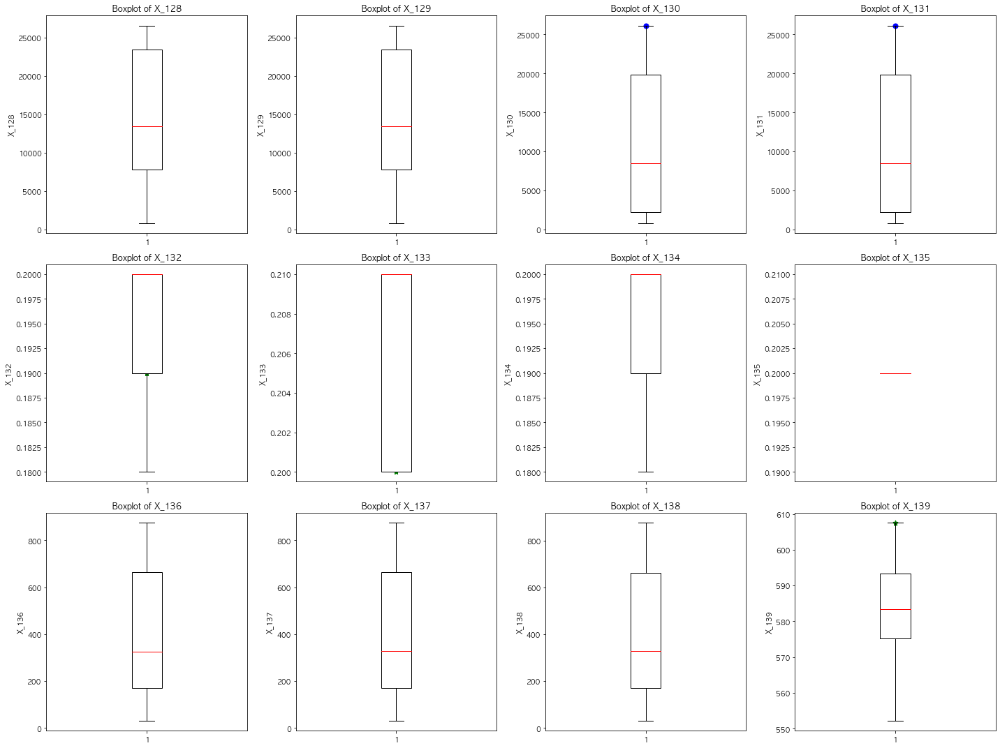

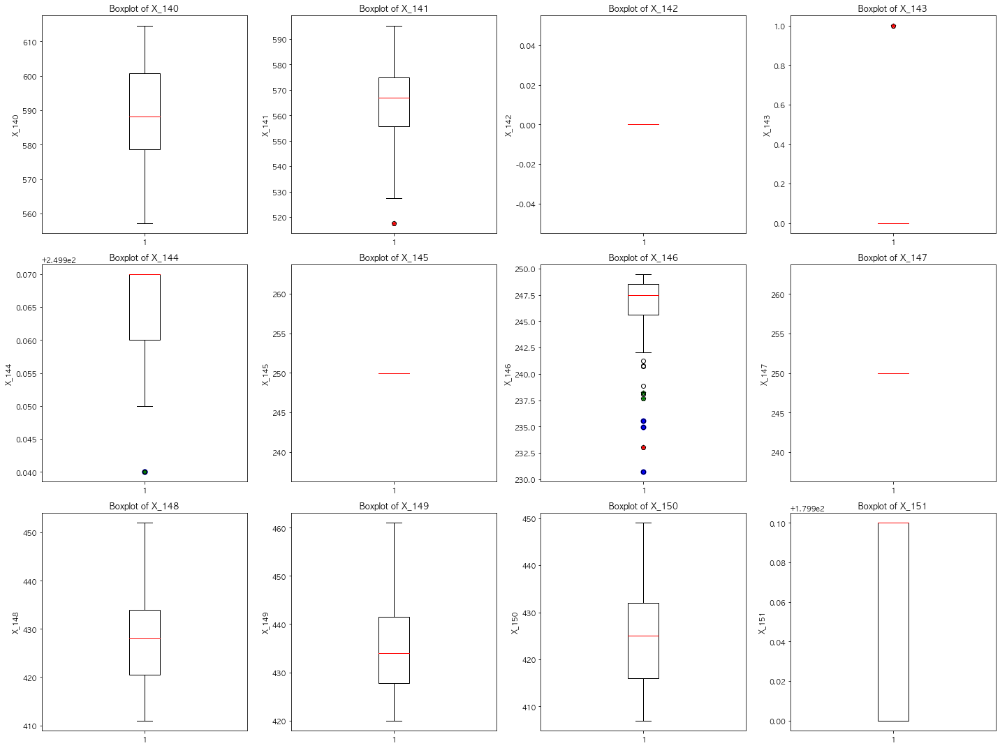

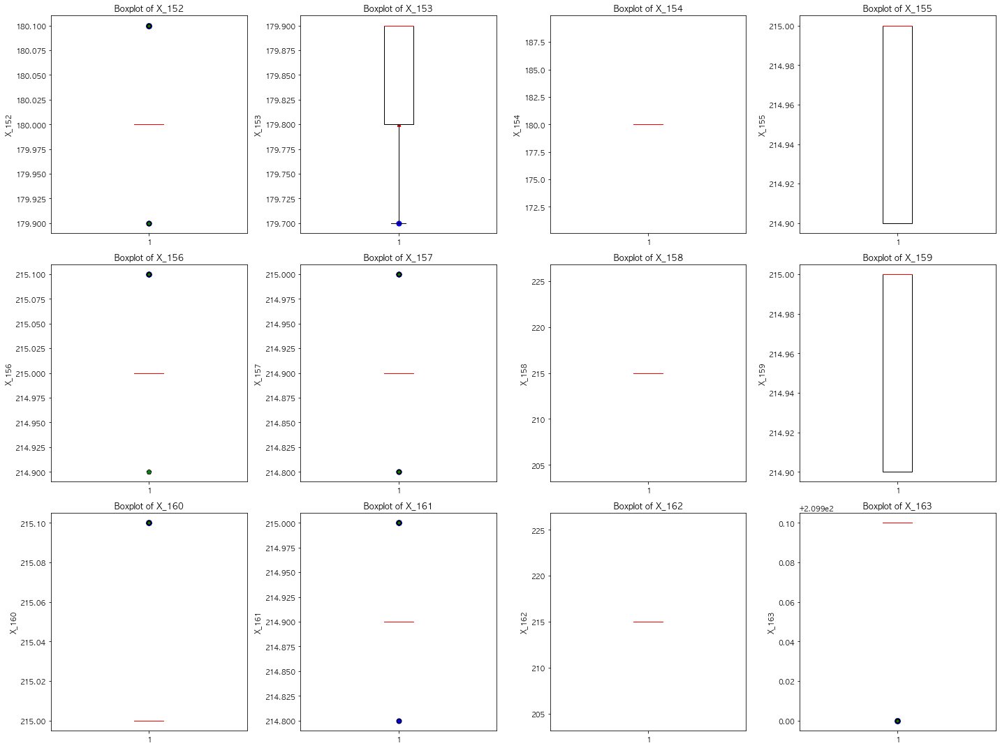

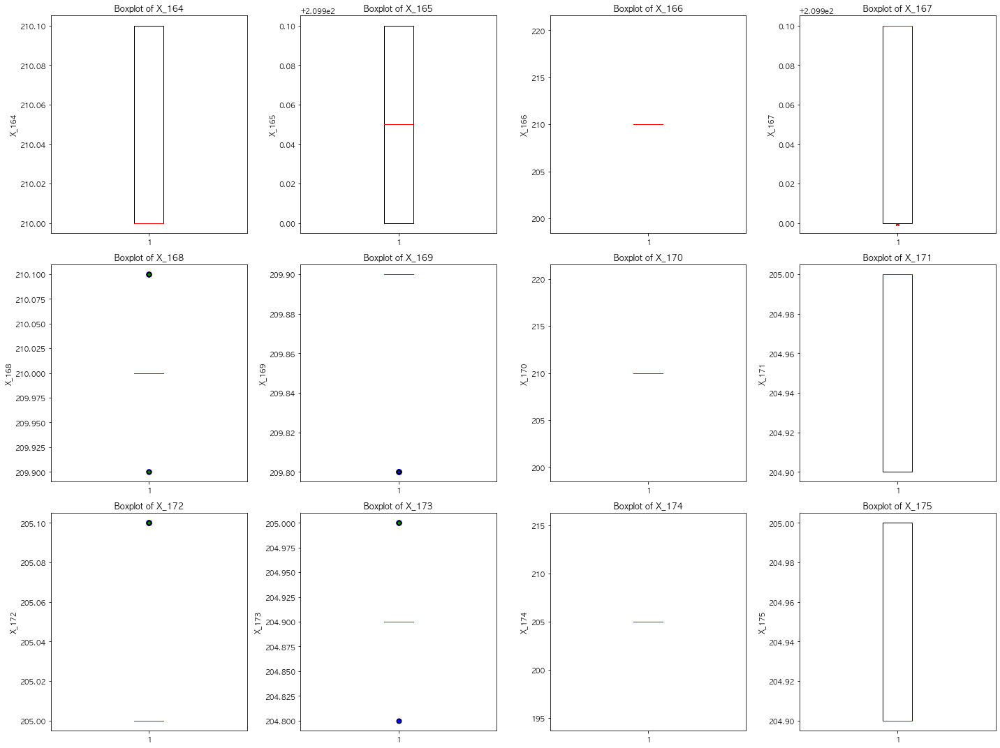

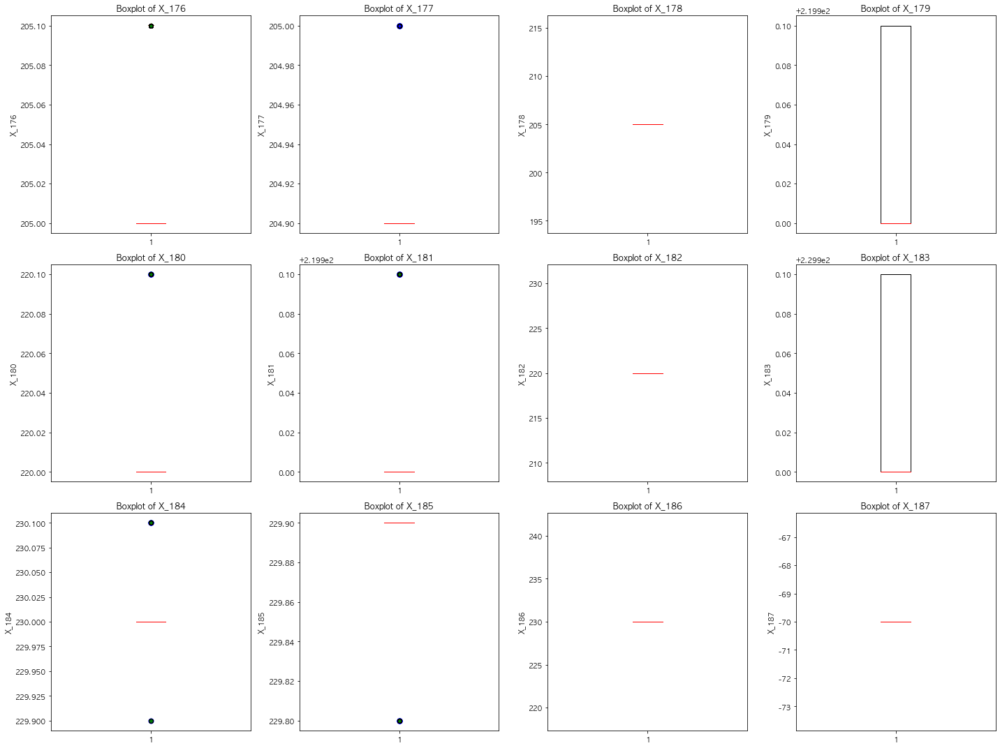

In [41]:
except_target = a_df_nullx.drop(['Y_Class'], axis=1)
numeric_columns = except_target.select_dtypes(include=['number'])  # 숫자형 데이터만 선택

columns_per_page = 12
total_columns = len(numeric_columns.columns)
total_pages = math.ceil(total_columns / columns_per_page)

marker_styles = {0: '*', 1: 'o', 2: '*'}
colors = {0: 'red', 1: 'blue', 2: 'green'}

#for page in range(total_pages):
for page in range(5):
    start_idx = page * columns_per_page
    end_idx = start_idx + columns_per_page
    columns_to_plot = numeric_columns.columns[start_idx:end_idx]
    
    # 서브플롯
    fig, axs = plt.subplots(3, 4, figsize=(20, 15))  # 3행 4열 레이아웃
    axs = axs.flatten()
    
    for ax, column in zip(axs, columns_to_plot):
        # 박스플롯 생성 (수염 및 박스만 표시)
        ax.boxplot(
            a_df_nullx[column].dropna().values,
            patch_artist=True,
            boxprops=dict(color='black', facecolor='white'),
            medianprops=dict(color='red'),
            whiskerprops=dict(color='black'),
            capprops=dict(color='black'),
        )
        
        # Y_Class별로 이상치 데이터 계산 및 표시
        for y_class in colors.keys():
            # 이상치 계산
            y_class_data = a_df_nullx[a_df_nullx['Y_Class'] == y_class][column].dropna()
            q1 = y_class_data.quantile(0.25)
            q3 = y_class_data.quantile(0.75)
            iqr = q3 - q1
            lower_bound = q1 - 1.5 * iqr
            upper_bound = q3 + 1.5 * iqr
            outliers = y_class_data[(y_class_data < lower_bound) | (y_class_data > upper_bound)]
            
            # 이상치 개별 표시
            ax.scatter(
                [1] * len(outliers),  # x 좌표 설정 (1번 박스 위치에 표시)
                outliers,            # y 좌표: 이상치 값
                marker=marker_styles[y_class],  # 마커 모양
                color=colors[y_class],          # 마커 색상
                s=50,                           # 마커 크기
                label=f"Y_Class {y_class}"      # 범례
            )
        
        ax.set_title(f'Boxplot of {column}')
        ax.set_ylabel(column)
    
    # 남은 빈 플롯 숨기기
    for ax in axs[len(columns_to_plot):]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

T_31/O_31 제품

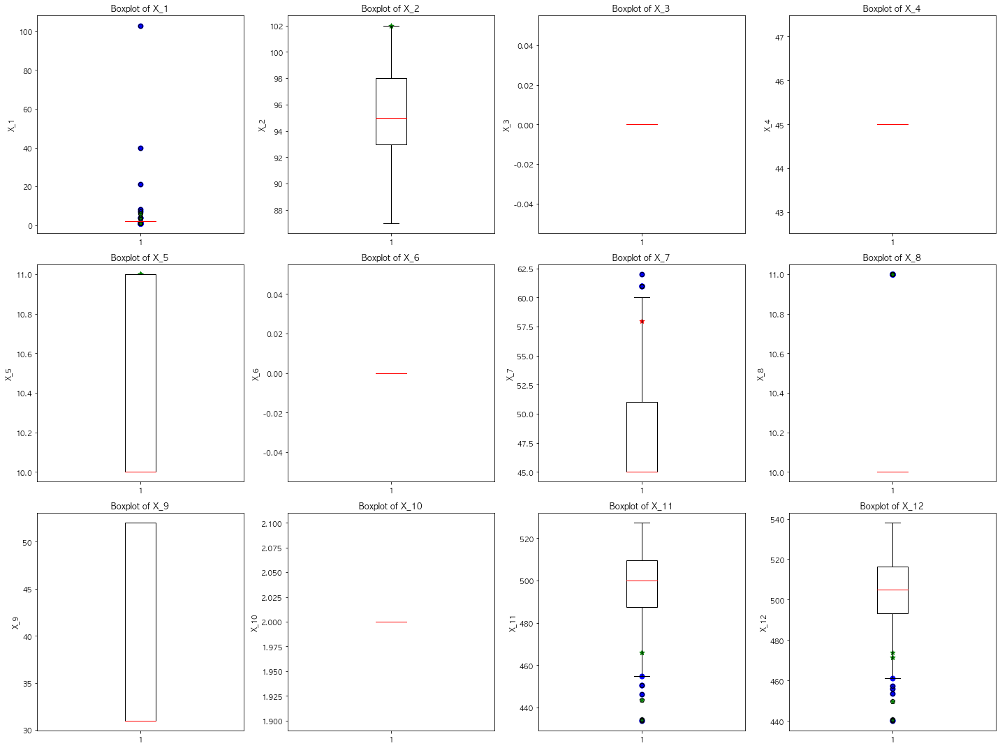

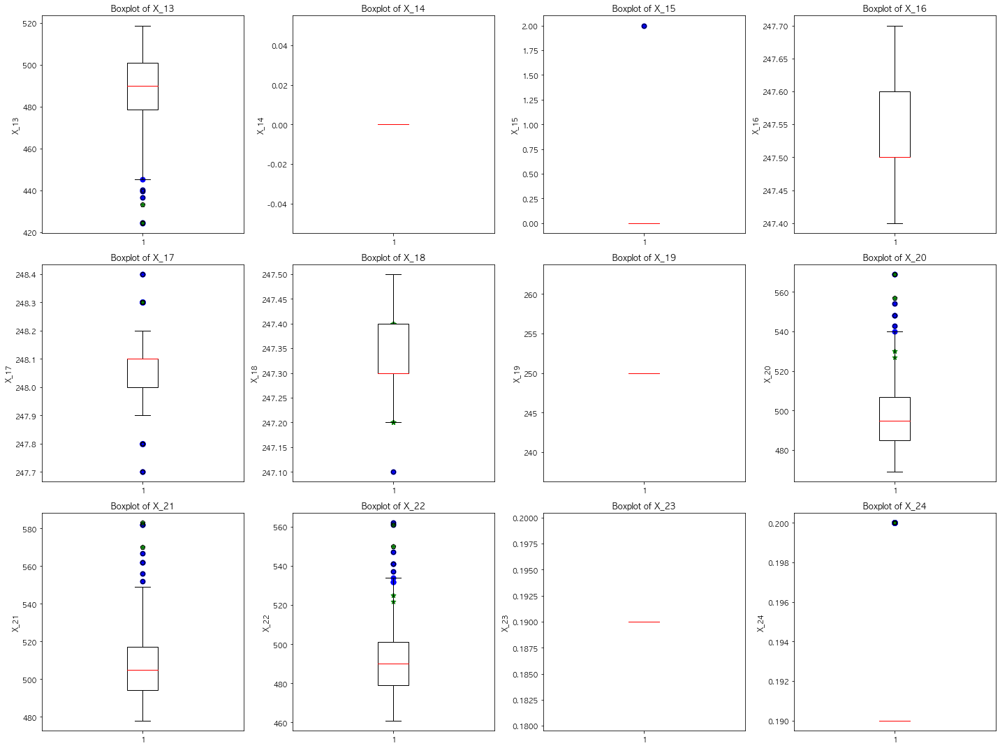

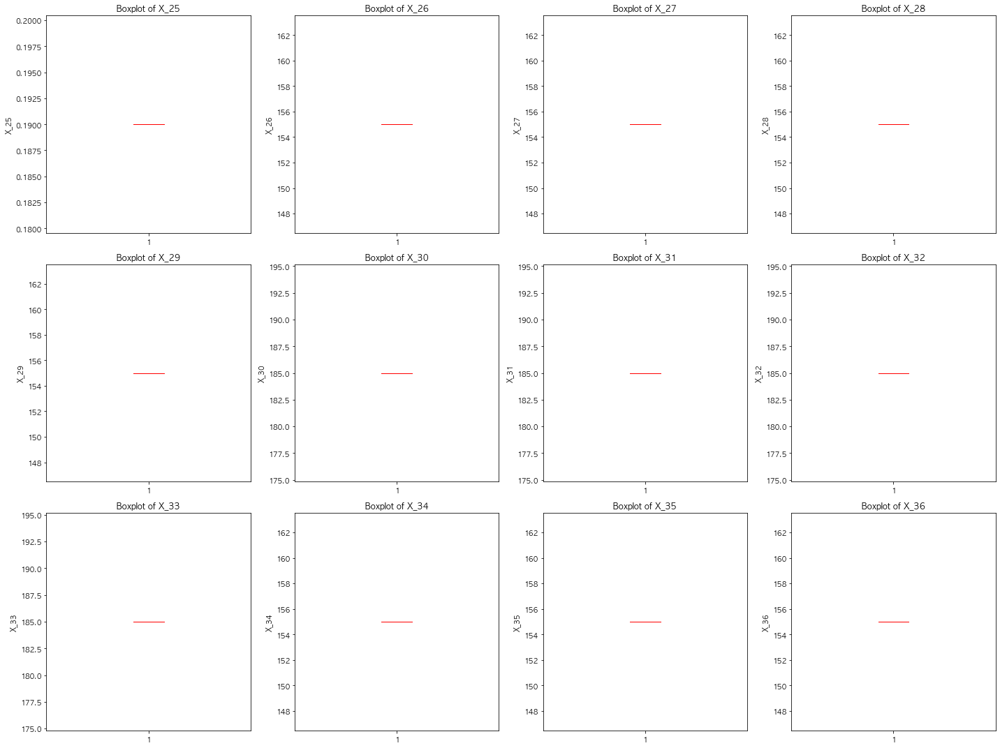

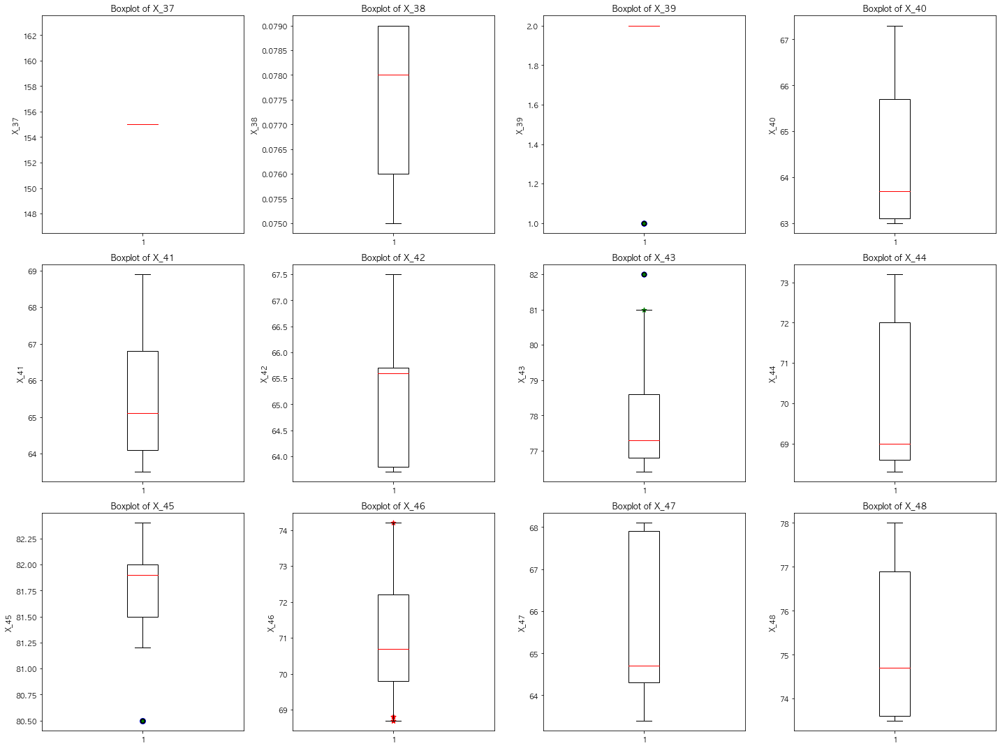

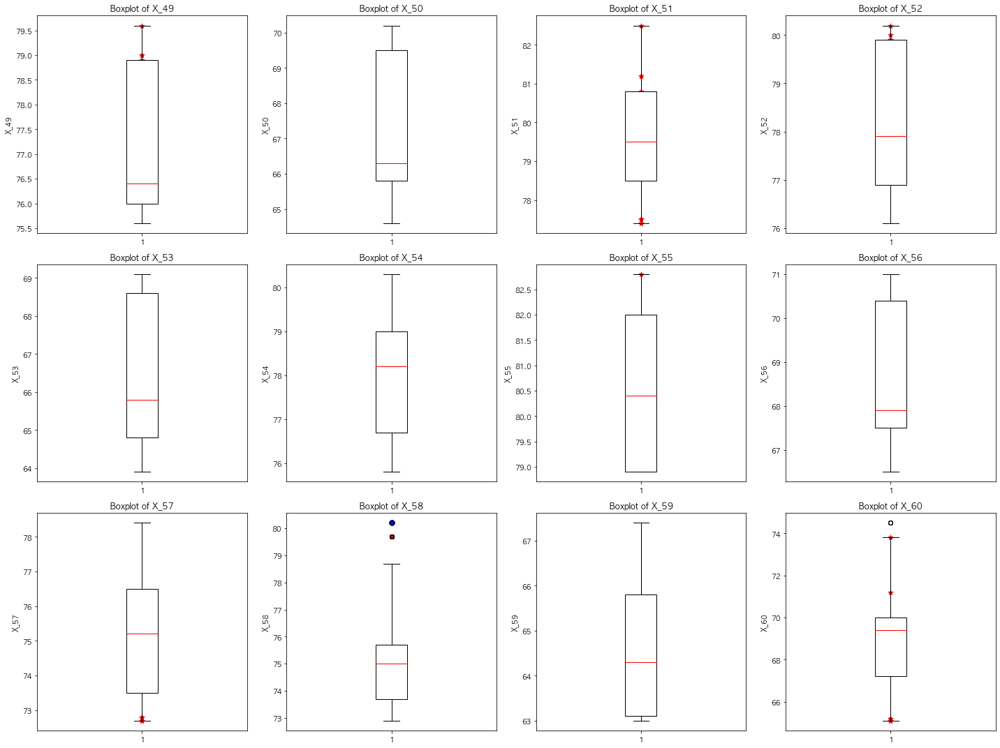

In [42]:
except_target = to_df_nullx.drop(['Y_Class'], axis=1)
numeric_columns = except_target.select_dtypes(include=['number'])  # 숫자형 데이터만 선택

columns_per_page = 12
total_columns = len(numeric_columns.columns)
total_pages = math.ceil(total_columns / columns_per_page)

marker_styles = {0: '*', 1: 'o', 2: '*'}
colors = {0: 'red', 1: 'blue', 2: 'green'}

#for page in range(total_pages):
for page in range(5):
    start_idx = page * columns_per_page
    end_idx = start_idx + columns_per_page
    columns_to_plot = numeric_columns.columns[start_idx:end_idx]
    
    # 서브플롯
    fig, axs = plt.subplots(3, 4, figsize=(20, 15))  # 3행 4열 레이아웃
    axs = axs.flatten()
    
    for ax, column in zip(axs, columns_to_plot):
        # 박스플롯 생성 (수염 및 박스만 표시)
        ax.boxplot(
            to_df_nullx[column].dropna().values,
            patch_artist=True,
            boxprops=dict(color='black', facecolor='white'),
            medianprops=dict(color='red'),
            whiskerprops=dict(color='black'),
            capprops=dict(color='black'),
        )
        
        # Y_Class별로 이상치 데이터 계산 및 표시
        for y_class in colors.keys():
            # 이상치 계산
            y_class_data = to_df_nullx[to_df_nullx['Y_Class'] == y_class][column].dropna()
            q1 = y_class_data.quantile(0.25)
            q3 = y_class_data.quantile(0.75)
            iqr = q3 - q1
            lower_bound = q1 - 1.5 * iqr
            upper_bound = q3 + 1.5 * iqr
            outliers = y_class_data[(y_class_data < lower_bound) | (y_class_data > upper_bound)]
            
            # 이상치 개별 표시
            ax.scatter(
                [1] * len(outliers),  # x 좌표 설정 (1번 박스 위치에 표시)
                outliers,            # y 좌표: 이상치 값
                marker=marker_styles[y_class],  # 마커 모양
                color=colors[y_class],          # 마커 색상
                s=50,                           # 마커 크기
                label=f"Y_Class {y_class}"      # 범례
            )
        
        ax.set_title(f'Boxplot of {column}')
        ax.set_ylabel(column)
    
    # 남은 빈 플롯 숨기기
    for ax in axs[len(columns_to_plot):]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

In [43]:
# 이상치 비율 계산 함수
def calculate_outlier_ratios(df):
    outlier_ratios = []

    for column in df.select_dtypes(include=np.number).columns:
        # Q1, Q3, IQR
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        
        # 이상치 경계
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = ((df[column] < lower_bound) | (df[column] > upper_bound))
        outlier_ratio = outliers.sum() / len(df)

        outlier_ratios.append({
            "Column": column,
            "Outlier_Ratio": outlier_ratio
        })

    outlier_ratios_df = pd.DataFrame(outlier_ratios)
    return outlier_ratios_df

In [44]:
a_df.head()

,PRODUCT_ID,Y_Class,Y_Quality,TIMESTAMP,LINE,PRODUCT_CODE,X_1,X_2,X_3,X_4,...,X_2866,X_2867,X_2868,X_2869,X_2870,X_2871,X_2872,X_2873,X_2874,X_2875
0,TRAIN_000,1,0.533433,2022-06-13 05:14:00,T050304,A_31,NaN,NaN,NaN,NaN,...,39.34,40.89,32.56,34.09,77.77,NaN,NaN,NaN,NaN,NaN
1,TRAIN_001,2,0.541819,2022-06-13 05:22:00,T050307,A_31,NaN,NaN,NaN,NaN,...,38.89,42.82,43.92,35.34,72.55,NaN,NaN,NaN,NaN,NaN
2,TRAIN_002,1,0.531267,2022-06-13 05:30:00,T050304,A_31,NaN,NaN,NaN,NaN,...,39.19,36.65,42.47,36.53,78.35,NaN,NaN,NaN,NaN,NaN
3,TRAIN_003,2,0.537325,2022-06-13 05:39:00,T050307,A_31,NaN,NaN,NaN,NaN,...,37.74,39.17,52.17,30.58,71.78,NaN,NaN,NaN,NaN,NaN
4,TRAIN_004,1,0.531590,2022-06-13 05:47:00,T050304,A_31,NaN,NaN,NaN,NaN,...,38.70,41.89,46.93,33.09,76.97,NaN,NaN,NaN,NaN,NaN


In [45]:
outlier_ratios_df = calculate_outlier_ratios(a_df)

In [46]:
outlier_ratios_df[outlier_ratios_df.Outlier_Ratio>0.1]

,Column,Outlier_Ratio
164,X_163,0.104418
170,X_169,0.116466
182,X_181,0.100402
237,X_236,0.116466
239,X_238,0.120482
...,...,...
2741,X_2740,0.112450
2749,X_2748,0.112450
2758,X_2757,0.120482
2768,X_2767,0.104418


In [47]:
outlier_ratios_df[outlier_ratios_df.Outlier_Ratio==0.0]

,Column,Outlier_Ratio
0,Y_Class,0.0
2,X_1,0.0
3,X_2,0.0
4,X_3,0.0
5,X_4,0.0
...,...,...
2872,X_2871,0.0
2873,X_2872,0.0
2874,X_2873,0.0
2875,X_2874,0.0


### 이상치 비율이 0%인 컬럼이 전체 컬럼 중 2304개로, 약 80퍼센트의 컬럼이 이상치가 없다. 데이터는 이상치가 많이 없는 편이므로 PCA 적용 전 Standard Scaler를 사용하기로 결정합니다.

## 상관관계 분석

### 데이터에서 모든 값이 null값인 컬럼은 이전에 데이터 분포 확인할 때 제거했고, 고유값이 하나인 단일값 컬럼을 삭제합니다. 상관관계 분석을 위해서는 결측치가 없어야 하기 때문에 knn알고리즘으로 결측치 처리 후 상관계수를 계산하지만, knn알고리즘이 실제 데이터 분포를 왜곡했을 수 있기 때문에 데이터에서 결측치가 전혀 없는 특성만 따로 상관관계 분석을 해보고 평균값이나 중앙값으로 결측치를 처리한 데이터로 상관관계 분석을 해보려 합니다.

In [48]:
a_df_nullX = a_df_nullx.drop(columns = ['Y_Class', 'LINE'], axis = 1)

In [49]:
# 고유값이 1개인 컬럼 삭제
a_df_uniqueX = a_df_nullX.loc[:, a_df_nullx.nunique() > 1]
a_df_uniqueX.head # (249, 1865)

<bound method NDFrame.head of        X_128    X_129    X_130    X_131  X_132  X_133  X_134  X_136  X_137  \
0     7813.0   7813.0      NaN      NaN   0.19   0.20   0.19  228.0  228.0   
1        NaN      NaN  19854.0  19854.0   0.20   0.21   0.20  413.0  414.0   
2     7815.0   7815.0      NaN      NaN   0.19   0.20   0.19  228.0  228.0   
3        NaN      NaN  19856.0  19856.0   0.20   0.21   0.20  414.0  414.0   
4     7817.0   7817.0      NaN      NaN   0.19   0.20   0.18  228.0  228.0   
..       ...      ...      ...      ...    ...    ...    ...    ...    ...   
583  11920.0  11920.0      NaN      NaN   0.19   0.20   0.19  230.0  230.0   
584      NaN      NaN      NaN      NaN    NaN    NaN    NaN    NaN    NaN   
585      NaN      NaN      NaN      NaN    NaN    NaN    NaN    NaN    NaN   
594  14810.0  14810.0      NaN      NaN   0.19   0.20   0.19  304.0  304.0   
595  14813.0  14813.0      NaN      NaN   0.19   0.20   0.19  304.0  304.0   

     X_138  ...      X_2861  X_28

In [50]:
to_df_nullx = to_df_nullx.drop(columns = ['Y_Class', 'LINE'], axis = 1)

In [51]:
to_df_uniqueX = to_df_nullx.loc[:, to_df_nullx.nunique() > 1]
to_df_uniqueX.head() #(349, 551)

,X_1,X_2,X_5,X_7,X_8,X_9,X_11,X_12,X_13,X_15,...,X_924,X_925,X_926,X_927,X_928,X_929,X_930,X_931,X_932,X_933
22,2.0,102.0,11.0,45.0,10.0,31.0,514.4,522.1,505.8,0.0,...,172.5,162.8,157.235484,150.9,326.0,309.290909,290.0,13.7,13.443333,13.2
23,2.0,102.0,11.0,45.0,10.0,31.0,514.6,522.6,506.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25,2.0,97.0,11.0,45.0,10.0,31.0,517.4,526.0,508.9,0.0,...,177.8,157.1,154.074194,150.9,327.0,310.854546,298.0,13.7,13.454839,13.2
26,2.0,95.0,10.0,54.0,10.0,52.0,477.4,482.4,470.2,0.0,...,166.9,158.5,151.096774,146.5,327.0,313.618182,299.0,13.7,13.461290,13.3
29,2.0,100.0,11.0,45.0,10.0,31.0,516.5,526.0,507.5,0.0,...,177.9,161.3,156.038710,149.1,327.0,312.109091,298.0,13.7,13.422581,13.2


In [52]:
a_df_uniqueX.to_csv('./data/a_df_uniqueX.csv', index = False)
to_df_uniqueX.to_csv('./data/to_df_uniqueX.csv', index = False)

### 다양한 k값을 가지고 민감도 분석

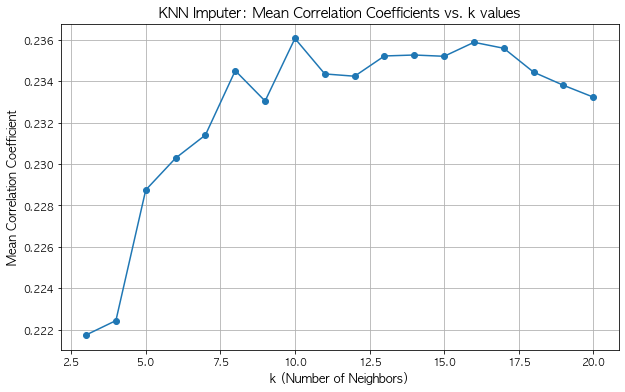

In [53]:
from sklearn.impute import KNNImputer

k_values = [i for i in range(3, 21)]

correlation_results = {}

for k in k_values:
    imputer = KNNImputer(n_neighbors=k)
    a_df_imputed = pd.DataFrame(imputer.fit_transform(a_df_uniqueX), columns=a_df_uniqueX.columns)

    corr_matrix = a_df_imputed.corr(method='pearson')
    mean_corr = corr_matrix.abs().mean().mean()  # 절대값 평균 상관계수 저장
    correlation_results[k] = mean_corr

plt.figure(figsize=(10, 6))
plt.plot(list(correlation_results.keys()), list(correlation_results.values()), marker='o')
plt.title("KNN Imputer: Mean Correlation Coefficients vs. k values", fontsize=14)
plt.xlabel("k (Number of Neighbors)", fontsize=12)
plt.ylabel("Mean Correlation Coefficient", fontsize=12)
plt.grid(True)
plt.show()

### k=10에서 가장 높은 평균 상관계수를 보이기 때문에 데이터 패턴의 관계를 가장 잘 유지하고 있으며 k=16에 비해 평활화로 인해 데이터 패턴이 단순화되지 않았고, 변수 간의 미세한 관계를 더 잘 반영하고 있습니다.

A_31 데이터 knn알고리즘으로 결측치 처리 (k = 10)

In [54]:
from sklearn.impute import KNNImputer

print(a_df_uniqueX.shape)

numeric_cols = a_df_uniqueX.select_dtypes(include=['number']).columns
categorical_cols = a_df_uniqueX.select_dtypes(exclude=['number']).columns
numeric_data = a_df_uniqueX[numeric_cols]
categorical_data = a_df_uniqueX[categorical_cols]

imputer = KNNImputer(n_neighbors=10)
numeric_imputed = imputer.fit_transform(numeric_data)

numeric_imputed_df = pd.DataFrame(numeric_imputed, columns=numeric_cols, index=numeric_data.index)
a_df_imputed = pd.concat([numeric_imputed_df, categorical_data], axis=1)
a_df_imputed = a_df_imputed[a_df_uniqueX.columns] #컬럼 순서 조정

print(a_df_imputed.shape)
a_df_imputed

(249, 1865)
(249, 1865)


,X_128,X_129,X_130,X_131,X_132,X_133,X_134,X_136,X_137,X_138,...,X_2861,X_2862,X_2863,X_2864,X_2865,X_2866,X_2867,X_2868,X_2869,X_2870
0,7813.0,7813.0,18000.6,18000.6,0.190,0.200,0.190,228.0,228.0,225.0,...,197.286667,189.0,383.0,368.296296,353.0,39.340,40.890,32.560,34.090,77.770
1,9944.6,9944.6,19854.0,19854.0,0.200,0.210,0.200,413.0,414.0,414.0,...,193.296552,185.6,383.0,367.735849,353.0,38.890,42.820,43.920,35.340,72.550
2,7815.0,7815.0,18000.6,18000.6,0.190,0.200,0.190,228.0,228.0,225.0,...,179.820690,165.5,383.0,367.320755,353.0,39.190,36.650,42.470,36.530,78.350
3,9944.6,9944.6,19856.0,19856.0,0.200,0.210,0.200,414.0,414.0,414.0,...,181.920690,165.8,384.0,369.188679,353.0,37.740,39.170,52.170,30.580,71.780
4,7817.0,7817.0,19840.5,19840.5,0.190,0.200,0.180,228.0,228.0,225.0,...,196.393333,182.6,383.0,367.351852,352.0,38.700,41.890,46.930,33.090,76.970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
583,11920.0,11920.0,2673.0,2673.0,0.190,0.200,0.190,230.0,230.0,230.0,...,191.993103,181.6,394.0,371.943396,353.0,51.710,59.640,54.610,57.050,63.180
584,12792.4,13510.7,2816.3,2816.3,0.192,0.206,0.192,100.6,101.0,101.0,...,195.682143,184.9,466.0,448.634615,432.0,52.930,55.443,52.339,54.812,63.552
585,14050.8,14769.1,2816.3,2816.3,0.192,0.206,0.192,122.5,122.9,122.9,...,187.396552,176.7,472.0,450.339623,432.0,53.079,55.551,51.839,54.520,63.098
594,14810.0,14810.0,5196.0,5196.0,0.190,0.200,0.190,304.0,304.0,304.0,...,180.810345,168.7,384.0,369.811321,353.0,49.470,53.070,50.890,55.100,66.490


In [55]:
outlier_ratios_df_tduX = calculate_outlier_ratios(to_df_uniqueX)
outlier_ratios_df_tduX[outlier_ratios_df_tduX.Outlier_Ratio==0]

,Column,Outlier_Ratio
1,X_2,0.0
2,X_5,0.0
5,X_9,0.0
10,X_16,0.0
17,X_38,0.0
...,...,...
520,X_901,0.0
545,X_928,0.0
546,X_929,0.0
547,X_930,0.0


### T_31/O_31 데이터 knn알고리즘으로 결측치 처리

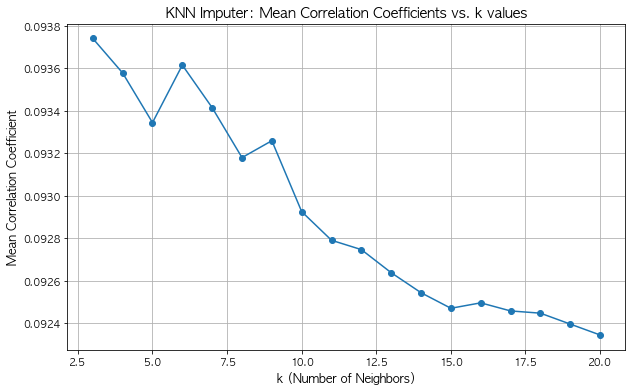

In [56]:
from sklearn.impute import KNNImputer

k_values = [i for i in range(3, 21)]

correlation_results = {}

for k in k_values:
    imputer = KNNImputer(n_neighbors=k)
    to_df_imputed = pd.DataFrame(imputer.fit_transform(to_df_uniqueX), columns=to_df_uniqueX.columns)

    corr_matrix = to_df_imputed.corr(method='pearson')
    mean_corr = corr_matrix.abs().mean().mean()  # 절대값 평균 상관계수 저장
    correlation_results[k] = mean_corr

plt.figure(figsize=(10, 6))
plt.plot(list(correlation_results.keys()), list(correlation_results.values()), marker='o')
plt.title("KNN Imputer: Mean Correlation Coefficients vs. k values", fontsize=14)
plt.xlabel("k (Number of Neighbors)", fontsize=12)
plt.ylabel("Mean Correlation Coefficient", fontsize=12)
plt.grid(True)
plt.show()

### k = 3에서 가장 높은 평균 상관계수를 보이고 있지만, k값이 작아질수록 이상치의 영향을 많이 받기 때문에 안정성을 고려하여 두번째로 평균 상관계수가 높은 k=9로 진행했습니다.

In [57]:
from sklearn.impute import KNNImputer

print(to_df_uniqueX.shape)

numeric_cols = to_df_uniqueX.select_dtypes(include=['number']).columns
categorical_cols = to_df_uniqueX.select_dtypes(exclude=['number']).columns
numeric_data = to_df_uniqueX[numeric_cols]
categorical_data = to_df_uniqueX[categorical_cols]

imputer = KNNImputer(n_neighbors=9)
numeric_imputed = imputer.fit_transform(numeric_data)

numeric_imputed_df = pd.DataFrame(numeric_imputed, columns=numeric_cols, index=numeric_data.index)
to_df_imputed = pd.concat([numeric_imputed_df, categorical_data], axis=1)
to_df_imputed = to_df_imputed[to_df_uniqueX.columns] #컬럼 순서 조정

print(to_df_imputed.shape)
to_df_imputed

(349, 551)
(349, 551)


,X_1,X_2,X_5,X_7,X_8,X_9,X_11,X_12,X_13,X_15,...,X_924,X_925,X_926,X_927,X_928,X_929,X_930,X_931,X_932,X_933
22,2.0,102.0,11.0,45.0,10.0,31.0,514.4,522.1,505.8,0.0,...,172.500000,162.800000,157.235484,150.9,326.000000,309.290909,290.000000,13.700000,13.443333,13.200000
23,2.0,102.0,11.0,45.0,10.0,31.0,514.6,522.6,506.0,0.0,...,177.355556,162.288889,156.090323,148.5,326.666667,309.286869,293.555556,13.688889,13.462282,13.255556
25,2.0,97.0,11.0,45.0,10.0,31.0,517.4,526.0,508.9,0.0,...,177.800000,157.100000,154.074194,150.9,327.000000,310.854546,298.000000,13.700000,13.454839,13.200000
26,2.0,95.0,10.0,54.0,10.0,52.0,477.4,482.4,470.2,0.0,...,166.900000,158.500000,151.096774,146.5,327.000000,313.618182,299.000000,13.700000,13.461290,13.300000
29,2.0,100.0,11.0,45.0,10.0,31.0,516.5,526.0,507.5,0.0,...,177.900000,161.300000,156.038710,149.1,327.000000,312.109091,298.000000,13.700000,13.422581,13.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
591,1.0,87.0,10.0,50.0,10.0,52.0,465.9,470.5,456.8,0.0,...,177.000000,159.600000,154.777419,147.7,326.000000,313.472727,298.000000,13.600000,13.400000,13.200000
592,2.0,98.0,10.0,45.0,10.0,31.0,505.5,510.6,498.8,0.0,...,171.500000,156.600000,152.535484,147.6,326.000000,312.472727,298.000000,13.600000,13.361290,13.200000
593,2.0,95.0,10.0,50.0,10.0,52.0,468.9,473.9,459.2,0.0,...,172.800000,161.200000,155.438710,149.0,327.000000,313.363636,298.000000,13.600000,13.351613,13.200000
596,40.0,94.0,11.0,45.0,10.0,31.0,505.8,510.9,497.1,0.0,...,189.200000,179.500000,173.190323,168.6,321.000000,303.036364,289.000000,13.600000,13.406667,13.200000


knn알고리즘으로 결측치 처리시 상수컬럼은 생기지 않았습니다.

In [58]:
a_df_imputed.to_csv('./data/a_imputed_k10.csv', index = False)
to_df_imputed.to_csv('./data/to_imputed_k9.csv', index = False)

### 평균값으로도 결측치를 처리합니다.

In [59]:
a_df_imputed_mean = a_df_uniqueX.fillna(a_df_uniqueX.mean())
to_df_imputed_mean = to_df_uniqueX.fillna(to_df_uniqueX.mean())

### 중앙값으로도 결측치를 처리합니다.

In [60]:
a_df_imputed_medi = a_df_uniqueX.fillna(a_df_uniqueX.median())
to_df_imputed_medi = to_df_uniqueX.fillna(to_df_uniqueX.median())

## 평균값 결측치 처리 데이터로 상관관계 분석

### 평균값 결측치 처리 데이터로 상관관계 분석

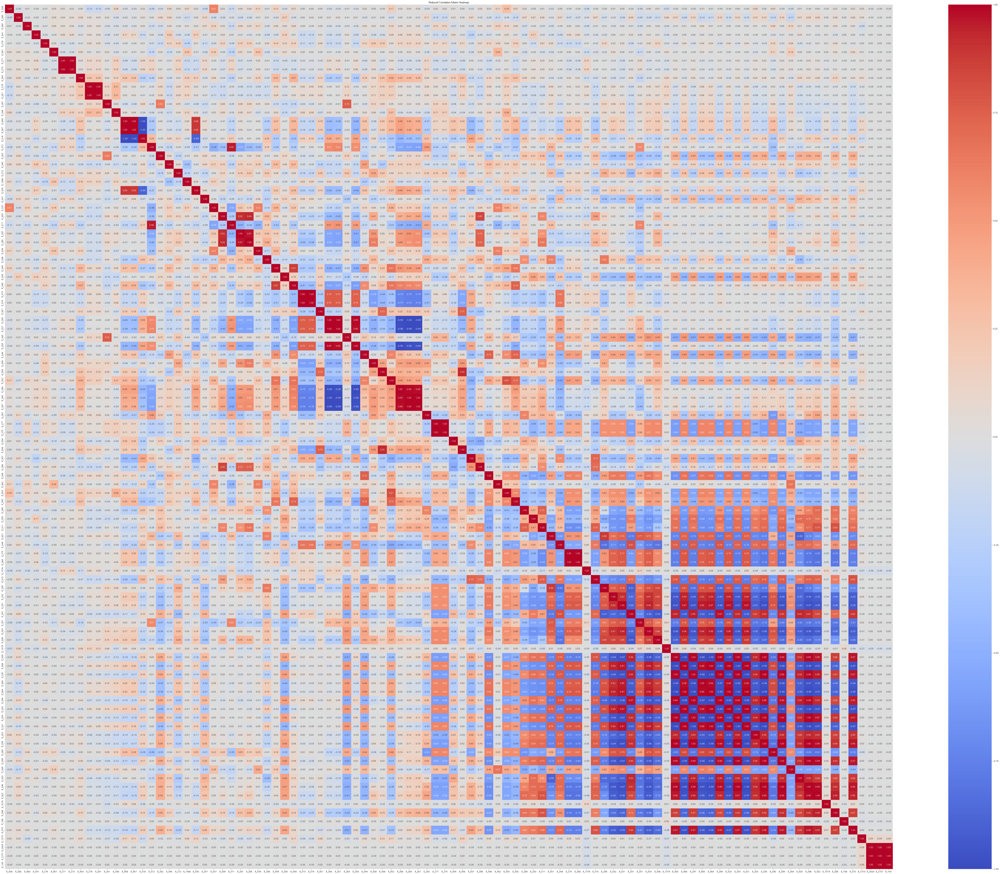

In [61]:
# 평균값 결측치 데이터 : 상관계수가 낮은 상위 50개 컬럼만 선택
correlation_matrix = a_df_imputed_mean.corr()
high_corr_cols = correlation_matrix.abs().mean().sort_values(ascending=True).head(100).index
reduced_corr_matrix = correlation_matrix.loc[high_corr_cols, high_corr_cols]

# 히트맵 생성
plt.figure(figsize=(100, 80))
sns.heatmap(reduced_corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, center = 0)
plt.title("Reduced Correlation Matrix Heatmap")
plt.savefig("./correlation_matrix_heatmap/reduced_correlation_matrix_heatmap_mean_asc100.png", dpi=300, bbox_inches='tight')
plt.show()

### 평균값 대체 -> 일부 변수 간 상관계수가 높은 부분이 뭉쳐 있고, 전체적으로 데이터가 평활화된 느낌입니다.

### 중앙값 결측치 처리 데이터로 상관관계 분석

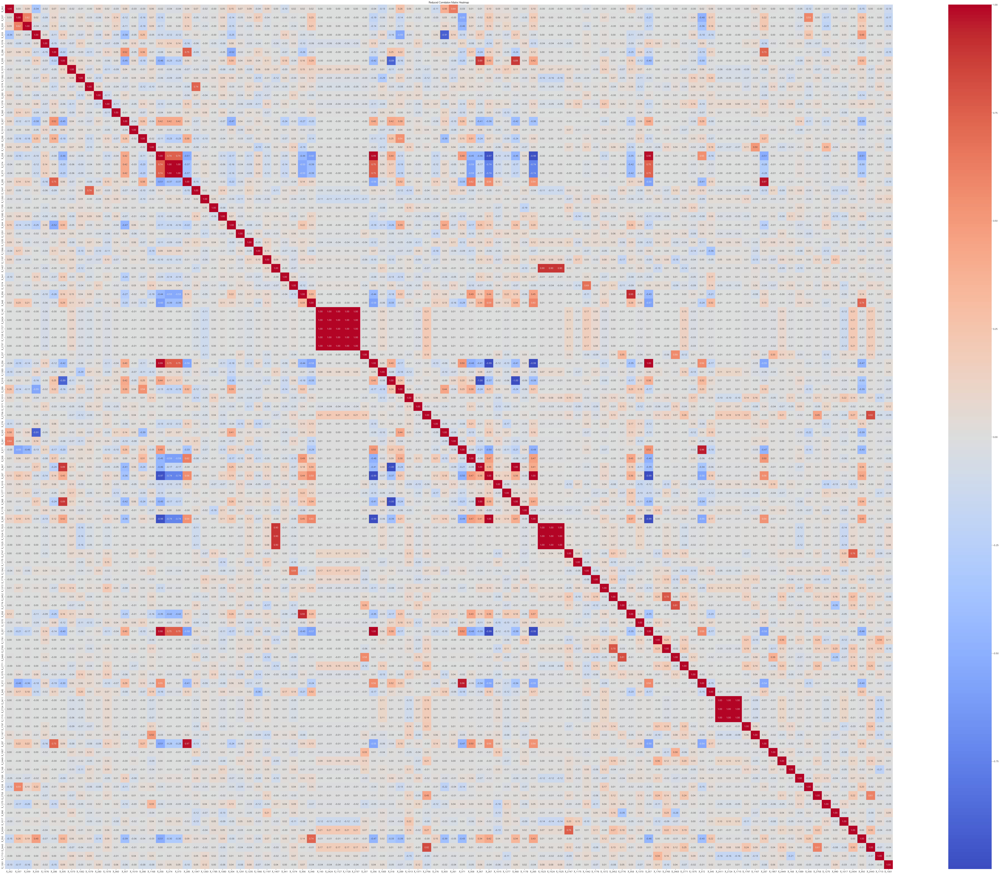

In [62]:
# 중앙값 결측치 데이터 : 상관계수가 낮은 상위 50개 컬럼만 선택
correlation_matrix = a_df_imputed_medi.corr()
high_corr_cols = correlation_matrix.abs().mean().sort_values(ascending=True).head(100).index
reduced_corr_matrix = correlation_matrix.loc[high_corr_cols, high_corr_cols]

# 히트맵 생성
plt.figure(figsize=(100, 80))
sns.heatmap(reduced_corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, center = 0)
plt.title("Reduced Correlation Matrix Heatmap")
plt.savefig("./correlation_matrix_heatmap/reduced_correlation_matrix_heatmap_median_asc100.png", dpi=300, bbox_inches='tight')
plt.show()

### 평균값 보간보다 더 평활화된 경향이 있습니다. 이는 이상치에는 민감하지 않지만, 결측치가 많은 데이터이기에 데이터가 더 단순화된 느낌입니다.

### knn 결측치 처리 데이터로 상관관계 분석

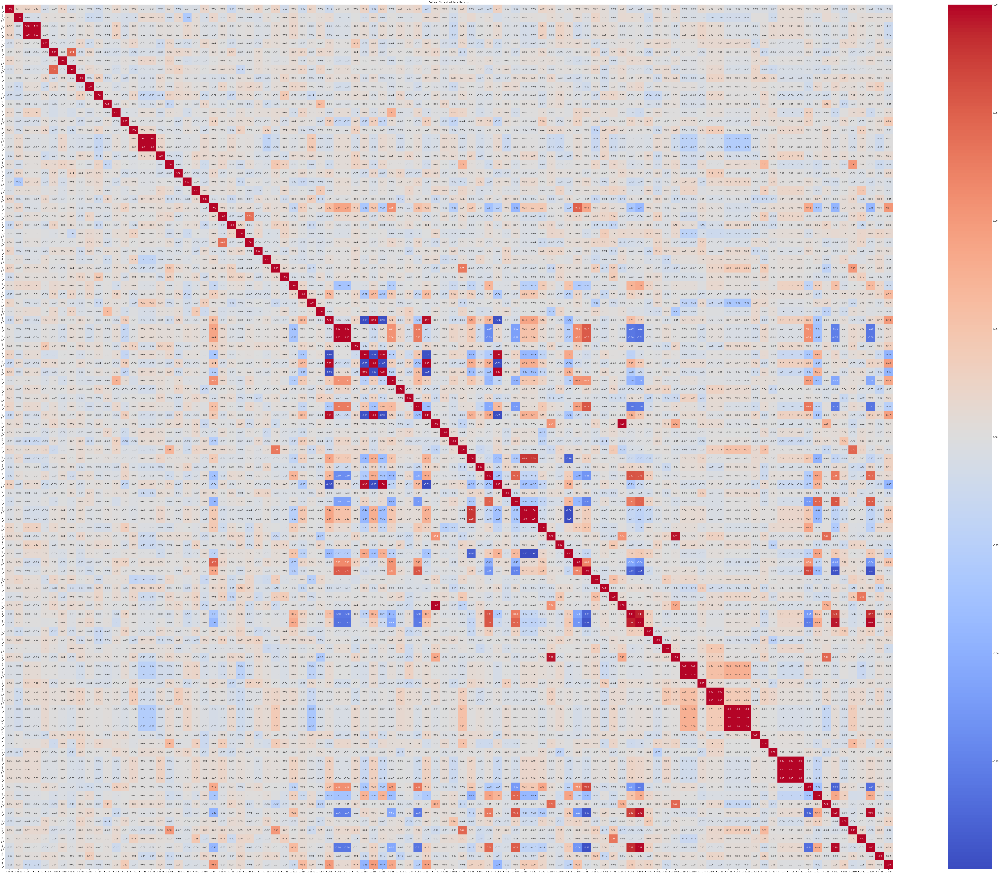

In [63]:
# KNN 결측치 데이터 : 상관계수가 낮은 상위 50개 컬럼만 선택
correlation_matrix = a_df_imputed.corr()
high_corr_cols = correlation_matrix.abs().mean().sort_values(ascending=True).head(100).index
reduced_corr_matrix = correlation_matrix.loc[high_corr_cols, high_corr_cols]

# 히트맵 생성
plt.figure(figsize=(100, 80))
sns.heatmap(reduced_corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, center = 0)
plt.title("Reduced Correlation Matrix Heatmap")
plt.savefig("./correlation_matrix_heatmap/reduced_correlation_matrix_heatmap_k10_asc100.png", dpi=300, bbox_inches='tight')
plt.show()

### 그에 반해 KNN 보간은 데이터 패턴과 관계를 더 잘 유지하고 있습니다.

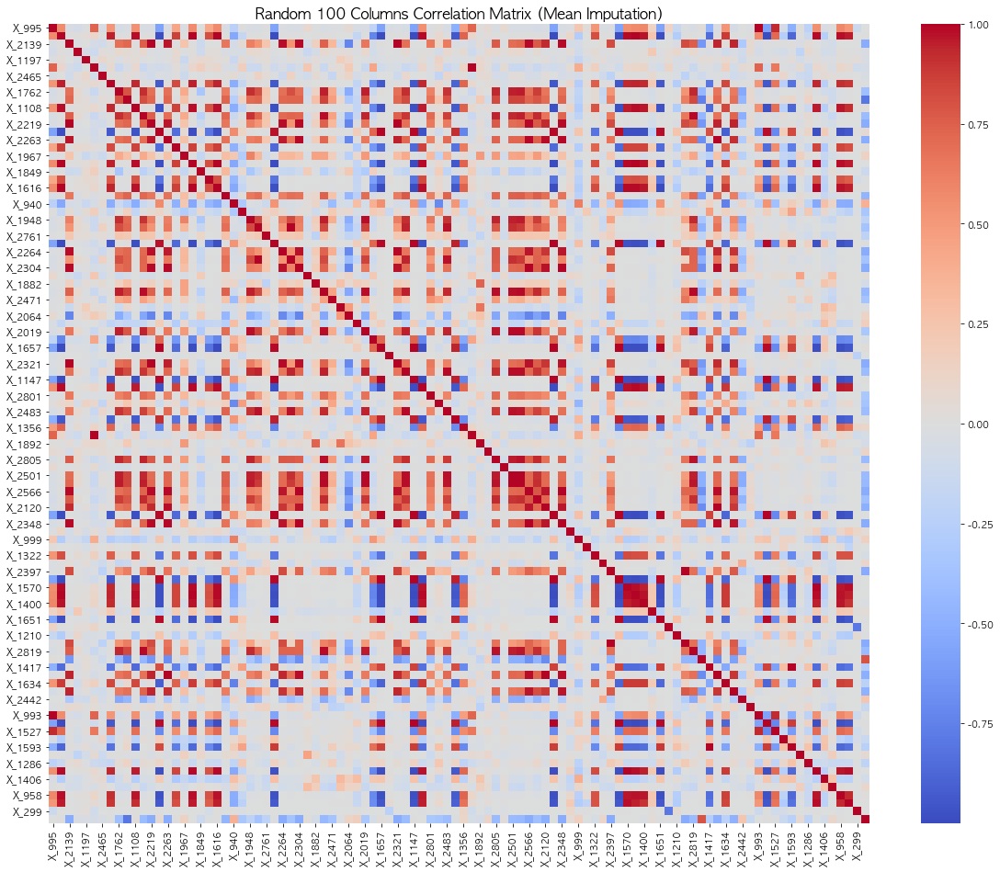

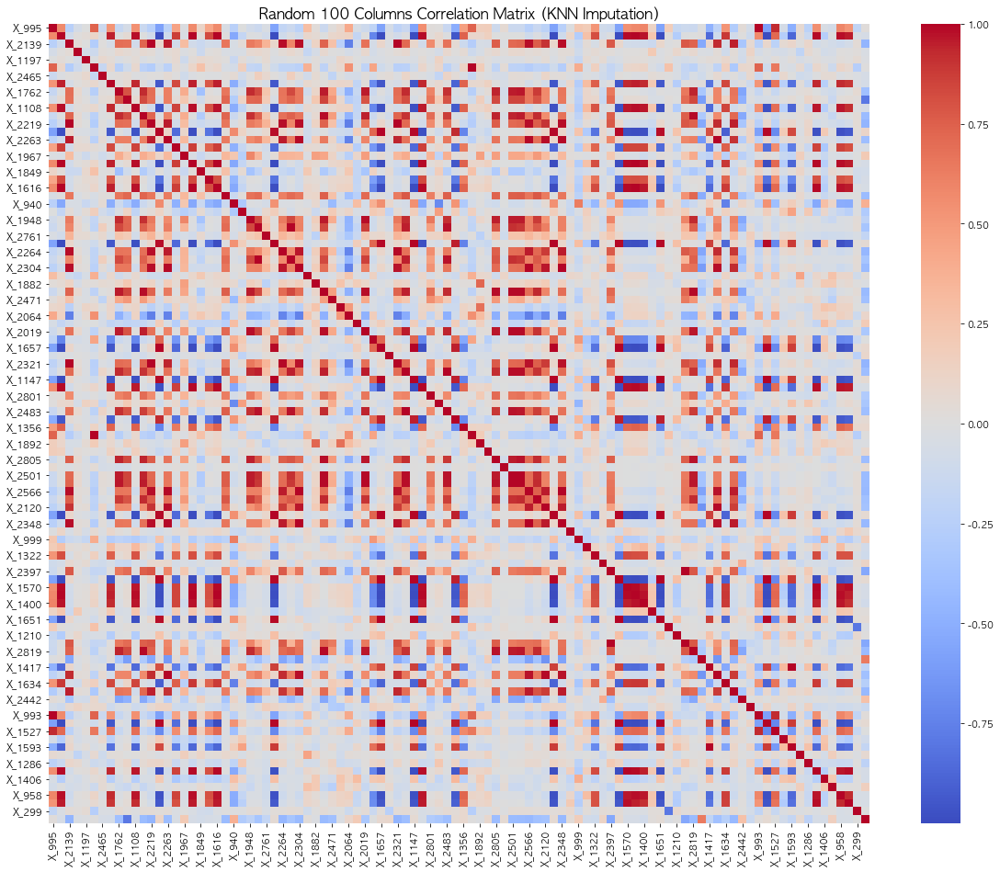

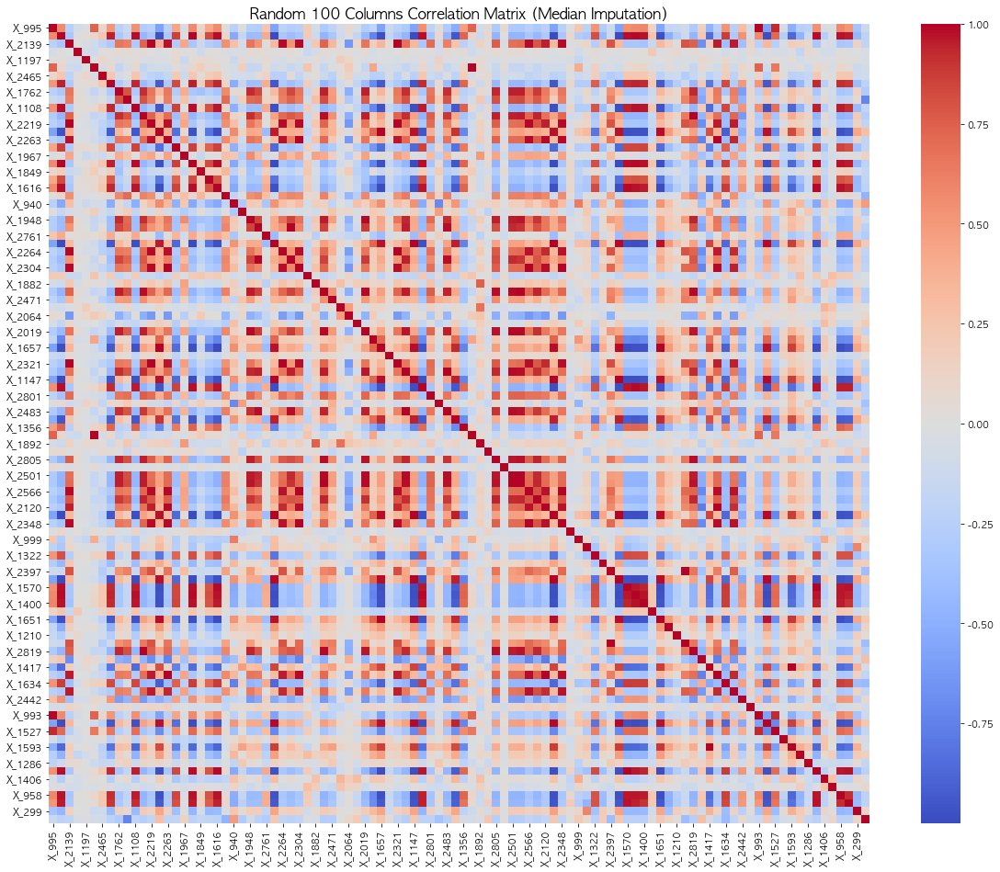

In [64]:
# 랜덤으로 100개 컬럼 선택
np.random.seed(42)  # 동일한 결과를 얻기 위해 시드 설정
data_columns = a_df_imputed_mean.columns
random_cols = np.random.choice(data_columns, size=100, replace=False)

mean_reduced_corr_matrix = a_df_imputed_mean[random_cols].corr()
knn_reduced_corr_matrix = a_df_imputed[random_cols].corr()
median_reduced_corr_matrix = a_df_imputed_medi[random_cols].corr()


def plot_heatmap(corr_matrix, title, filename):
    plt.figure(figsize=(20, 16))
    sns.heatmap(corr_matrix, annot=False, fmt=".2f", cmap="coolwarm", cbar=True, center=0)
    plt.title(title, fontsize=16)
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

plot_heatmap(
    mean_reduced_corr_matrix,
    "Random 100 Columns Correlation Matrix (Mean Imputation)",
    "./correlation_matrix_heatmap/random_correlation_matrix_mean_c.png"
)

plot_heatmap(
    knn_reduced_corr_matrix,
    "Random 100 Columns Correlation Matrix (KNN Imputation)",
    "./correlation_matrix_heatmap/random_correlation_matrix_knn_c.png"
)

plot_heatmap(
    median_reduced_corr_matrix,
    "Random 100 Columns Correlation Matrix (Median Imputation)",
    "./correlation_matrix_heatmap/random_correlation_matrix_median_c.png"
)


### 하지만 위에서는 같은 컬럼들을 가지고 분석한 것이 아니기 때문에 랜덤으로 100개의 컬럼을 선택해, 3가지 보간법 모두 같은 컬럼들만 가지고 상관관계를 히트맵으로 그려본 결과, KNN 보간법에서 히트맵의 색상 분포가 상대적으로 다양하고, 상관계수가 높은 컬럼들이 많이 나타나고 있는 것을 알 수 있습니다.

### T_31과 O_31 데이터에 대해서도 상관관계 히트맵을 시각화 해보았습니다.

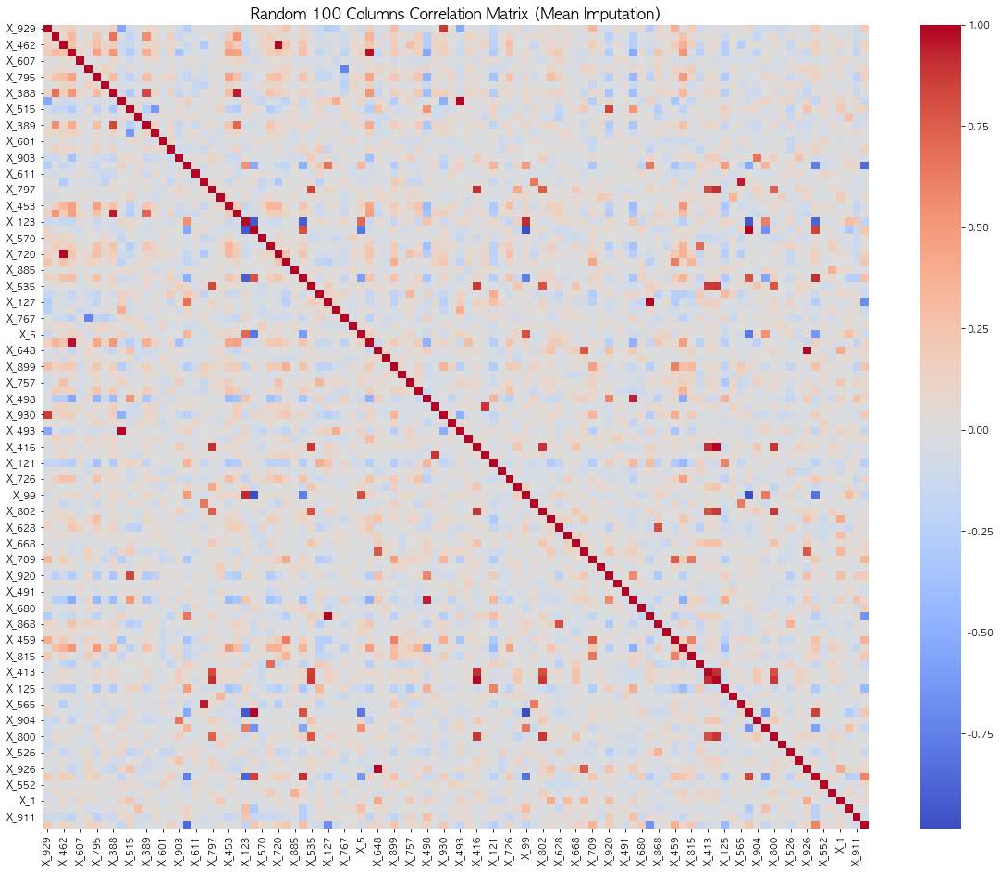

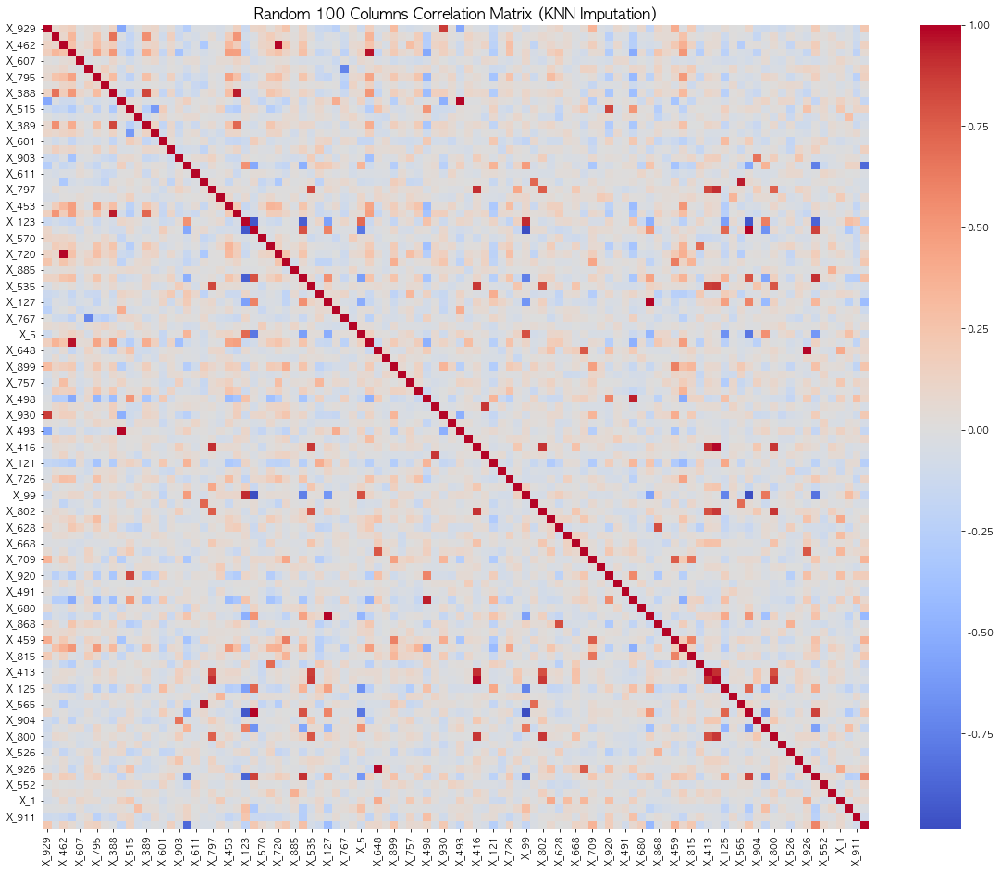

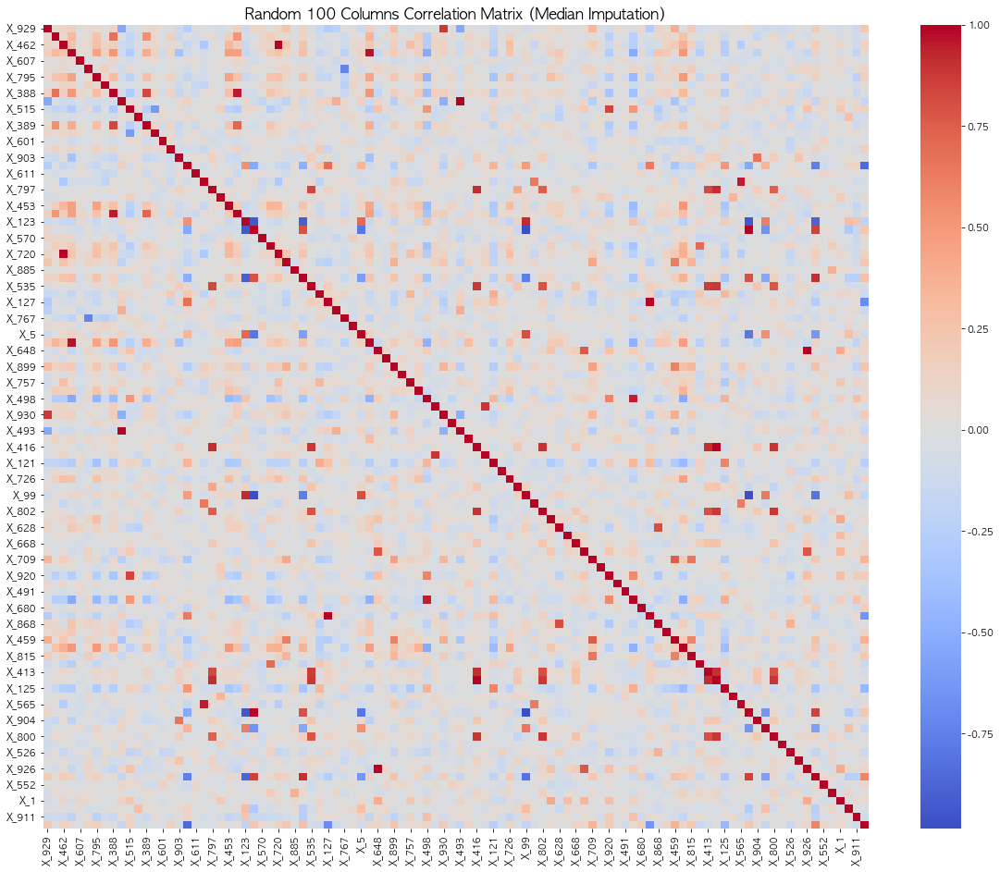

In [65]:
np.random.seed(42)
data_columns = to_df_imputed_mean.columns
random_cols = np.random.choice(data_columns, size=100, replace=False)

mean_reduced_corr_matrix = to_df_imputed_mean[random_cols].corr()
knn_reduced_corr_matrix = to_df_imputed[random_cols].corr()
median_reduced_corr_matrix = to_df_imputed_medi[random_cols].corr()


def plot_heatmap(corr_matrix, title, filename):
    plt.figure(figsize=(20, 16))
    sns.heatmap(corr_matrix, annot=False, fmt=".2f", cmap="coolwarm", cbar=True, center=0)
    plt.title(title, fontsize=16)
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

plot_heatmap(
    mean_reduced_corr_matrix,
    "Random 100 Columns Correlation Matrix (Mean Imputation)",
    "./correlation_matrix_heatmap/random_correlation_matrix_mean_c_TO.png"
)

plot_heatmap(
    knn_reduced_corr_matrix,
    "Random 100 Columns Correlation Matrix (KNN Imputation)",
    "./correlation_matrix_heatmap/random_correlation_matrix_knn_c_TO.png"
)

plot_heatmap(
    median_reduced_corr_matrix,
    "Random 100 Columns Correlation Matrix (Median Imputation)",
    "./correlation_matrix_heatmap/random_correlation_matrix_median_c_TO.png"
)

### T_31, O_31 데이터도 마찬가지로 KNN 보간법이 데이터의 상관관계를 상대적으로 더 잘 나타내고 있습니다.

### 따라서 KNN으로 결측치를 처리하는 방식이 타당하다 생각해 KNN으로 처리한 데이터를 바탕으로 상관관계 분석을 하고 상관계수가 높은 컬럼은 제거해 모델에 돌리거나, PCA로 차원을 축소합니다.

## 데이터의 선형, 비선형 관계 파악 및 분산 분석

### PCA를 적용시키기 전에 PCA가 모델 성능에 긍정적인 영향을 줄 수 있을지를 알아보고, PCA를 적용시킨다면 몇 개의 주성분으로 축소시킬지 결정하기 위해 분석 진행했습니다. 

### 데이터의 선형 관계 비선형 관계 알아보기

상관계수의 절대값을 0~1 사이에서 10개의 구간으로 나누어 빈도를 나타낸 히스토그램

In [66]:
train_a = train[train.PRODUCT_CODE=='A_31']
train_to = train[(train.PRODUCT_CODE=='T_31')|(train.PRODUCT_CODE=='O_31')]

In [67]:
a_concatLINE = pd.concat([train_a.LINE, a_df_imputed], axis = 1)
a_concatLINE

,LINE,X_128,X_129,X_130,X_131,X_132,X_133,X_134,X_136,X_137,...,X_2861,X_2862,X_2863,X_2864,X_2865,X_2866,X_2867,X_2868,X_2869,X_2870
0,T050304,7813.0,7813.0,18000.6,18000.6,0.190,0.200,0.190,228.0,228.0,...,197.286667,189.0,383.0,368.296296,353.0,39.340,40.890,32.560,34.090,77.770
1,T050307,9944.6,9944.6,19854.0,19854.0,0.200,0.210,0.200,413.0,414.0,...,193.296552,185.6,383.0,367.735849,353.0,38.890,42.820,43.920,35.340,72.550
2,T050304,7815.0,7815.0,18000.6,18000.6,0.190,0.200,0.190,228.0,228.0,...,179.820690,165.5,383.0,367.320755,353.0,39.190,36.650,42.470,36.530,78.350
3,T050307,9944.6,9944.6,19856.0,19856.0,0.200,0.210,0.200,414.0,414.0,...,181.920690,165.8,384.0,369.188679,353.0,37.740,39.170,52.170,30.580,71.780
4,T050304,7817.0,7817.0,19840.5,19840.5,0.190,0.200,0.180,228.0,228.0,...,196.393333,182.6,383.0,367.351852,352.0,38.700,41.890,46.930,33.090,76.970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
583,T050304,11920.0,11920.0,2673.0,2673.0,0.190,0.200,0.190,230.0,230.0,...,191.993103,181.6,394.0,371.943396,353.0,51.710,59.640,54.610,57.050,63.180
584,T010305,12792.4,13510.7,2816.3,2816.3,0.192,0.206,0.192,100.6,101.0,...,195.682143,184.9,466.0,448.634615,432.0,52.930,55.443,52.339,54.812,63.552
585,T010306,14050.8,14769.1,2816.3,2816.3,0.192,0.206,0.192,122.5,122.9,...,187.396552,176.7,472.0,450.339623,432.0,53.079,55.551,51.839,54.520,63.098
594,T050304,14810.0,14810.0,5196.0,5196.0,0.190,0.200,0.190,304.0,304.0,...,180.810345,168.7,384.0,369.811321,353.0,49.470,53.070,50.890,55.100,66.490


In [68]:
# Label Encoding
label_encoder = LabelEncoder()
a_concatLINE['LINE'] = label_encoder.fit_transform(a_concatLINE['LINE'])
a_concatLINE

,LINE,X_128,X_129,X_130,X_131,X_132,X_133,X_134,X_136,X_137,...,X_2861,X_2862,X_2863,X_2864,X_2865,X_2866,X_2867,X_2868,X_2869,X_2870
0,2,7813.0,7813.0,18000.6,18000.6,0.190,0.200,0.190,228.0,228.0,...,197.286667,189.0,383.0,368.296296,353.0,39.340,40.890,32.560,34.090,77.770
1,3,9944.6,9944.6,19854.0,19854.0,0.200,0.210,0.200,413.0,414.0,...,193.296552,185.6,383.0,367.735849,353.0,38.890,42.820,43.920,35.340,72.550
2,2,7815.0,7815.0,18000.6,18000.6,0.190,0.200,0.190,228.0,228.0,...,179.820690,165.5,383.0,367.320755,353.0,39.190,36.650,42.470,36.530,78.350
3,3,9944.6,9944.6,19856.0,19856.0,0.200,0.210,0.200,414.0,414.0,...,181.920690,165.8,384.0,369.188679,353.0,37.740,39.170,52.170,30.580,71.780
4,2,7817.0,7817.0,19840.5,19840.5,0.190,0.200,0.180,228.0,228.0,...,196.393333,182.6,383.0,367.351852,352.0,38.700,41.890,46.930,33.090,76.970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
583,2,11920.0,11920.0,2673.0,2673.0,0.190,0.200,0.190,230.0,230.0,...,191.993103,181.6,394.0,371.943396,353.0,51.710,59.640,54.610,57.050,63.180
584,0,12792.4,13510.7,2816.3,2816.3,0.192,0.206,0.192,100.6,101.0,...,195.682143,184.9,466.0,448.634615,432.0,52.930,55.443,52.339,54.812,63.552
585,1,14050.8,14769.1,2816.3,2816.3,0.192,0.206,0.192,122.5,122.9,...,187.396552,176.7,472.0,450.339623,432.0,53.079,55.551,51.839,54.520,63.098
594,2,14810.0,14810.0,5196.0,5196.0,0.190,0.200,0.190,304.0,304.0,...,180.810345,168.7,384.0,369.811321,353.0,49.470,53.070,50.890,55.100,66.490


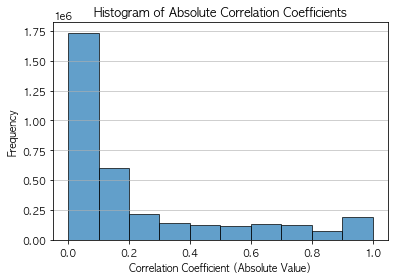

In [69]:
import matplotlib.pyplot as plt
import numpy as np

correlation_matrix = a_df_imputed.corr()

absolute_correlations = correlation_matrix.abs().values.flatten()

absolute_correlations = absolute_correlations[absolute_correlations < 1.0]

bins = np.linspace(0, 1, 11)

plt.hist(absolute_correlations, bins=bins, edgecolor='k', alpha=0.7)
plt.title("Histogram of Absolute Correlation Coefficients")
plt.xlabel("Correlation Coefficient (Absolute Value)")
plt.ylabel("Frequency")
plt.grid(axis='y', alpha=0.75)
output_path = "./data/2_pca/correlation_coefficients_histogram_A.png"
plt.savefig(output_path, dpi=300, bbox_inches='tight') 
plt.show()

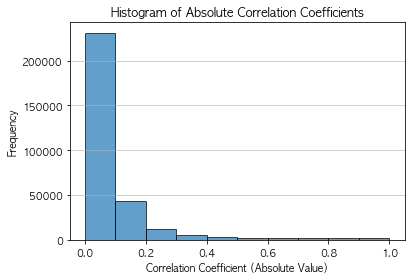

In [70]:
import matplotlib.pyplot as plt
import numpy as np

correlation_matrix = to_df_imputed.corr()

absolute_correlations = correlation_matrix.abs().values.flatten()

absolute_correlations = absolute_correlations[absolute_correlations < 1.0]

bins = np.linspace(0, 1, 11)

plt.hist(absolute_correlations, bins=bins, edgecolor='k', alpha=0.7)
plt.title("Histogram of Absolute Correlation Coefficients")
plt.xlabel("Correlation Coefficient (Absolute Value)")
plt.ylabel("Frequency")
plt.grid(axis='y', alpha=0.75)
output_path = "./data/2_pca/correlation_coefficients_histogram_TO.png"
plt.savefig(output_path, dpi=300, bbox_inches='tight') 
plt.show()

### 두 데이터 모두 0에 가까운 컬럼들이 월등히 많아서 데이터가 선형관계라고 보기는 어렵고 PCA를 했을 경우 모델 성능에 좋을지 알아보기 위해 데이터의 분산을 분석했습니다.

## 데이터의 분산 분석

Principal Component 1: Explained Variance = 0.284, Cumulative Variance = 0.28
Principal Component 2: Explained Variance = 0.215, Cumulative Variance = 0.50
Principal Component 3: Explained Variance = 0.061, Cumulative Variance = 0.56
Principal Component 4: Explained Variance = 0.048, Cumulative Variance = 0.61
Principal Component 5: Explained Variance = 0.031, Cumulative Variance = 0.64
Principal Component 6: Explained Variance = 0.028, Cumulative Variance = 0.67
Principal Component 7: Explained Variance = 0.021, Cumulative Variance = 0.69
Principal Component 8: Explained Variance = 0.020, Cumulative Variance = 0.71
Principal Component 9: Explained Variance = 0.016, Cumulative Variance = 0.72
Principal Component 10: Explained Variance = 0.014, Cumulative Variance = 0.74
Principal Component 11: Explained Variance = 0.011, Cumulative Variance = 0.75
Principal Component 12: Explained Variance = 0.010, Cumulative Variance = 0.76
Principal Component 13: Explained Variance = 0.009, Cumulativ

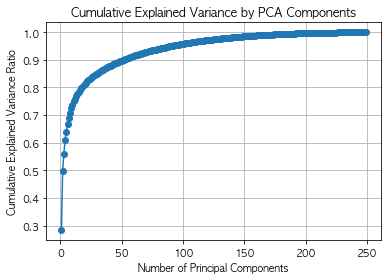

In [71]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(a_concatLINE)

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# 주성분 분산 비율 출력
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = explained_variance_ratio.cumsum()

for i, (evr, cvr) in enumerate(zip(explained_variance_ratio, cumulative_variance_ratio), 1):
    print(f"Principal Component {i}: Explained Variance = {evr:.3f}, Cumulative Variance = {cvr:.2f}")


plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o')
plt.title("Cumulative Explained Variance by PCA Components")
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance Ratio")
plt.grid()
plt.show()

### 현재 결과를 보면 29개의 컬럼으로 약 85퍼센트의 데이터 분산을 설명할 수 있으며, 소수의 주성분으로 데이터의 대부분의 분산을 설명할 수 있으므로 PCA 적용이 효과적일 것이라 본다. 또한 A_31 데이터의 경우 선형적 관계가 강하기 때문에 선형 모델을 사용해 학습 및 모델링을 진행해보려 합니다.

In [72]:
to_concatLINE = pd.concat([train_to.LINE, to_df_imputed], axis = 1)
to_concatLINE

,LINE,X_1,X_2,X_5,X_7,X_8,X_9,X_11,X_12,X_13,...,X_924,X_925,X_926,X_927,X_928,X_929,X_930,X_931,X_932,X_933
22,T100304,2.0,102.0,11.0,45.0,10.0,31.0,514.4,522.1,505.8,...,172.500000,162.800000,157.235484,150.9,326.000000,309.290909,290.000000,13.700000,13.443333,13.200000
23,T100304,2.0,102.0,11.0,45.0,10.0,31.0,514.6,522.6,506.0,...,177.355556,162.288889,156.090323,148.5,326.666667,309.286869,293.555556,13.688889,13.462282,13.255556
25,T100304,2.0,97.0,11.0,45.0,10.0,31.0,517.4,526.0,508.9,...,177.800000,157.100000,154.074194,150.9,327.000000,310.854546,298.000000,13.700000,13.454839,13.200000
26,T100306,2.0,95.0,10.0,54.0,10.0,52.0,477.4,482.4,470.2,...,166.900000,158.500000,151.096774,146.5,327.000000,313.618182,299.000000,13.700000,13.461290,13.300000
29,T100304,2.0,100.0,11.0,45.0,10.0,31.0,516.5,526.0,507.5,...,177.900000,161.300000,156.038710,149.1,327.000000,312.109091,298.000000,13.700000,13.422581,13.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
591,T100306,1.0,87.0,10.0,50.0,10.0,52.0,465.9,470.5,456.8,...,177.000000,159.600000,154.777419,147.7,326.000000,313.472727,298.000000,13.600000,13.400000,13.200000
592,T100304,2.0,98.0,10.0,45.0,10.0,31.0,505.5,510.6,498.8,...,171.500000,156.600000,152.535484,147.6,326.000000,312.472727,298.000000,13.600000,13.361290,13.200000
593,T100306,2.0,95.0,10.0,50.0,10.0,52.0,468.9,473.9,459.2,...,172.800000,161.200000,155.438710,149.0,327.000000,313.363636,298.000000,13.600000,13.351613,13.200000
596,T100304,40.0,94.0,11.0,45.0,10.0,31.0,505.8,510.9,497.1,...,189.200000,179.500000,173.190323,168.6,321.000000,303.036364,289.000000,13.600000,13.406667,13.200000


In [73]:
# Label Encoding
label_encoder = LabelEncoder()
to_concatLINE['LINE'] = label_encoder.fit_transform(to_concatLINE['LINE'])
to_concatLINE

,LINE,X_1,X_2,X_5,X_7,X_8,X_9,X_11,X_12,X_13,...,X_924,X_925,X_926,X_927,X_928,X_929,X_930,X_931,X_932,X_933
22,0,2.0,102.0,11.0,45.0,10.0,31.0,514.4,522.1,505.8,...,172.500000,162.800000,157.235484,150.9,326.000000,309.290909,290.000000,13.700000,13.443333,13.200000
23,0,2.0,102.0,11.0,45.0,10.0,31.0,514.6,522.6,506.0,...,177.355556,162.288889,156.090323,148.5,326.666667,309.286869,293.555556,13.688889,13.462282,13.255556
25,0,2.0,97.0,11.0,45.0,10.0,31.0,517.4,526.0,508.9,...,177.800000,157.100000,154.074194,150.9,327.000000,310.854546,298.000000,13.700000,13.454839,13.200000
26,1,2.0,95.0,10.0,54.0,10.0,52.0,477.4,482.4,470.2,...,166.900000,158.500000,151.096774,146.5,327.000000,313.618182,299.000000,13.700000,13.461290,13.300000
29,0,2.0,100.0,11.0,45.0,10.0,31.0,516.5,526.0,507.5,...,177.900000,161.300000,156.038710,149.1,327.000000,312.109091,298.000000,13.700000,13.422581,13.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
591,1,1.0,87.0,10.0,50.0,10.0,52.0,465.9,470.5,456.8,...,177.000000,159.600000,154.777419,147.7,326.000000,313.472727,298.000000,13.600000,13.400000,13.200000
592,0,2.0,98.0,10.0,45.0,10.0,31.0,505.5,510.6,498.8,...,171.500000,156.600000,152.535484,147.6,326.000000,312.472727,298.000000,13.600000,13.361290,13.200000
593,1,2.0,95.0,10.0,50.0,10.0,52.0,468.9,473.9,459.2,...,172.800000,161.200000,155.438710,149.0,327.000000,313.363636,298.000000,13.600000,13.351613,13.200000
596,0,40.0,94.0,11.0,45.0,10.0,31.0,505.8,510.9,497.1,...,189.200000,179.500000,173.190323,168.6,321.000000,303.036364,289.000000,13.600000,13.406667,13.200000


Principal Component 1: Explained Variance = 0.092, Cumulative Variance = 0.09
Principal Component 2: Explained Variance = 0.081, Cumulative Variance = 0.17
Principal Component 3: Explained Variance = 0.071, Cumulative Variance = 0.24
Principal Component 4: Explained Variance = 0.051, Cumulative Variance = 0.30
Principal Component 5: Explained Variance = 0.032, Cumulative Variance = 0.33
Principal Component 6: Explained Variance = 0.028, Cumulative Variance = 0.36
Principal Component 7: Explained Variance = 0.024, Cumulative Variance = 0.38
Principal Component 8: Explained Variance = 0.021, Cumulative Variance = 0.40
Principal Component 9: Explained Variance = 0.018, Cumulative Variance = 0.42
Principal Component 10: Explained Variance = 0.018, Cumulative Variance = 0.44
Principal Component 11: Explained Variance = 0.015, Cumulative Variance = 0.45
Principal Component 12: Explained Variance = 0.014, Cumulative Variance = 0.47
Principal Component 13: Explained Variance = 0.013, Cumulativ

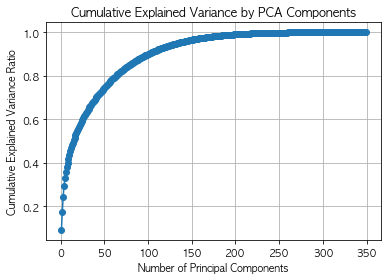

In [74]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(to_concatLINE)

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# 주성분 분산 비율 출력
explained_variance_ratio = pca.explained_variance_ratio_ㅡㅡ
cumulative_variance_ratio = explained_variance_ratio.cumsum()

for i, (evr, cvr) in enumerate(zip(explained_variance_ratio, cumulative_variance_ratio), 1):
    print(f"Principal Component {i}: Explained Variance = {evr:.3f}, Cumulative Variance = {cvr:.2f}")


plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o')
plt.title("Cumulative Explained Variance by PCA Components")
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance Ratio")
plt.grid()
plt.show()


### 현재 결과를 보면 78개의 컬럼으로 약 85퍼센트의 데이터 분산을 설명할 수 있으며, 소수의 주성분으로 데이터의 대부분의 분산을 설명할 수 없으므로 PCA 적용이 오히려 모델의 성능을 더 떨어트릴 것이라 예상합니다. T_31/O_31 데이터의 경우 복잡한 비선형적 관계를 학습시키기 위해 트리 기반 모델을 사용해 학습 및 모델링을 진행해보려 합니다.

# Data Preprocessing

### 1. 상관관계가 높은 컬럼 중 하나만 남기고 나머지 제거한다.
특성 정보를 알지 못하므로 분산이 크고, 결측치가 적은 피처를 대표 컬럼으로 분류하는 방식

In [75]:
# 1. 상관관계 행렬 계산
correlation_matrix = a_df_imputed.corr().abs()

# 상삼각 행렬 추출
triu_mask = np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)
upper_triangle = correlation_matrix.where(triu_mask)

# 상관계수가 0.8 이상인 컬럼 그룹 만들기
high_corr_pairs = []
for col in upper_triangle.columns:
    high_corr = upper_triangle.index[upper_triangle[col] > 0.8].tolist()
    if high_corr:
        high_corr.append(col)
        high_corr_pairs.append(set(high_corr))

# 중복 그룹 제거
from itertools import chain
unique_groups = []
seen = set()
for group in high_corr_pairs:
    if not group.intersection(seen):
        unique_groups.append(group)
        seen.update(group)

# 각 그룹에서 대표 컬럼 하나만 선택
# 대표 컬럼 선택 기준: 일정 비율 이상 결측치가 있는 컬럼 중 분산이 큰 컬럼
columns_a_keep = []
missing_threshold = 0.1  # 결측치 비율 기준 (10%)
for group in unique_groups:
    group_cols = list(group)
    group_na_ratios = a_df_imputed[group_cols].isna().mean()
    valid_cols = group_na_ratios[group_na_ratios > missing_threshold].index  # 결측치 비율 기준 통과한 컬럼
    if valid_cols.empty:
        group_variances = a_df_imputed[group_cols].var()
        representative_col = group_variances.idxmax()
    else:
        group_variances = a_df_imputed[valid_cols].var()
        representative_col = group_variances.idxmax()
    columns_a_keep.append(representative_col)

a_df_coefX = a_df_imputed[columns_a_keep]

print(f"총 {len(a_df_imputed.columns) - len(columns_a_keep)}개의 컬럼이 제거되었습니다.")
print(f"최종 데이터프레임 크기: {a_df_coefX.shape}")


총 1728개의 컬럼이 제거되었습니다.
최종 데이터프레임 크기: (249, 137)


In [76]:
# 1. 상관관계 행렬 계산
correlation_matrix = to_df_imputed.corr().abs()

# 상삼각 행렬 추출
triu_mask = np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)
upper_triangle = correlation_matrix.where(triu_mask)

# 상관계수가 0.8 이상인 컬럼 그룹 만들기
high_corr_pairs = []
for col in upper_triangle.columns:
    high_corr = upper_triangle.index[upper_triangle[col] > 0.8].tolist()
    if high_corr:
        high_corr.append(col)
        high_corr_pairs.append(set(high_corr))

# 중복 그룹 제거
from itertools import chain
unique_groups = []
seen = set()
for group in high_corr_pairs:
    if not group.intersection(seen):
        unique_groups.append(group)
        seen.update(group)

# 각 그룹에서 대표 컬럼 하나만 선택
# 대표 컬럼 선택 기준: 일정 비율 이상 결측치가 있는 컬럼 중 분산이 큰 컬럼
columns_to_keep = []
missing_threshold = 0.1  # 결측치 비율 기준 (10%)
for group in unique_groups:
    group_cols = list(group)
    group_na_ratios = to_df_imputed[group_cols].isna().mean()
    valid_cols = group_na_ratios[group_na_ratios > missing_threshold].index  # 결측치 비율 기준 통과한 컬럼
    if valid_cols.empty:
        group_variances = to_df_imputed[group_cols].var()
        representative_col = group_variances.idxmax()
    else:
        group_variances = to_df_imputed[valid_cols].var()
        representative_col = group_variances.idxmax()
    columns_to_keep.append(representative_col)

to_df_coefX = to_df_imputed[columns_to_keep]

print(f"총 {len(to_df_imputed.columns) - len(columns_to_keep)}개의 컬럼이 제거되었습니다.")
print(f"최종 데이터프레임 크기: {to_df_coefX.shape}")

총 449개의 컬럼이 제거되었습니다.
최종 데이터프레임 크기: (349, 102)


In [77]:
a_df_imputed.shape, a_df_coefX.shape

((249, 1865), (249, 137))

In [78]:
to_df_imputed.shape, to_df_coefX.shape

((349, 551), (349, 102))

In [79]:
a_df_coefX.to_csv('./data/1_coefX/a_df_coefX.csv', index = False)
to_df_coefX.to_csv('./data/1_coefX/to_df_coefX.csv', index = False)

In [81]:
test_a = test[test.PRODUCT_CODE=='A_31']
test_to = test[(test.PRODUCT_CODE=='T_31')|(test.PRODUCT_CODE=='O_31')]

In [82]:
test_a_drop = test_a[a_df_coefX.columns]
test_to_drop = test_to[to_df_coefX.columns]

In [83]:
test_a_drop.to_csv('./data/1_coefX/test_a_drop.csv', index = False)
test_to_drop.to_csv('./data/1_coefX/test_to_drop.csv', index = False)

In [84]:
test_a_drop.shape, test_to_drop.shape

((67, 137), (243, 102))

### 2. 차원 축소 알고리즘을 사용한다.
차원 축소 알고리즘을 적용하기 위해서 test 데이터를 train 데이터와 동일하게 필터링하고, test 데이터의 결측치를 처리해준다.

결측치 처리 방식
1. 모든 값이 null값인 컬럼은 train 데이터의 해당 컬럼의 평균치로 결측값을 채운다.
2. 나머지 결측치는 train 데이터와 마찬가지로 KNN 알고리즘을 사용한다.

결측치 처리가 끝나면 PCA 적용시킨다.

In [85]:
test_a_drop = test_a[a_df_imputed.columns]
test_a_drop

,X_128,X_129,X_130,X_131,X_132,X_133,X_134,X_136,X_137,X_138,...,X_2861,X_2862,X_2863,X_2864,X_2865,X_2866,X_2867,X_2868,X_2869,X_2870
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,191.450000,183.8,467.0,444.192308,423.0,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,193.082143,179.7,465.0,443.211539,423.0,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,192.375862,181.7,466.0,441.830189,422.0,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,194.351724,175.1,464.0,445.075472,423.0,NaN,NaN,NaN,NaN,NaN
7,18031.0,18031.0,NaN,NaN,0.19,0.20,0.19,354.0,354.0,354.0,...,190.800000,168.3,384.0,369.462963,354.0,57.74,52.51,54.45,57.99,63.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284,NaN,NaN,19591.0,24422.0,0.21,0.22,0.21,806.0,805.0,796.0,...,174.146667,165.4,384.0,369.481481,352.0,52.97,58.06,44.11,56.33,62.00
285,NaN,NaN,19621.0,24452.0,0.21,0.22,0.21,806.0,805.0,796.0,...,172.956667,157.8,384.0,369.203704,352.0,54.24,55.55,51.60,48.53,61.95
286,NaN,NaN,19646.0,24476.0,0.21,0.22,0.21,807.0,806.0,796.0,...,176.496552,167.8,384.0,368.924528,352.0,58.06,57.92,49.06,48.26,62.77
292,NaN,NaN,20153.0,24984.0,0.21,0.22,0.21,821.0,820.0,810.0,...,163.200000,154.9,383.0,365.056604,343.0,53.55,52.68,49.97,56.66,63.52


In [86]:
test_to_drop = test_to[to_df_imputed.columns]
test_to_drop

,X_1,X_2,X_5,X_7,X_8,X_9,X_11,X_12,X_13,X_15,...,X_924,X_925,X_926,X_927,X_928,X_929,X_930,X_931,X_932,X_933
0,2.0,94.0,10.0,51.0,10.0,52.0,469.6,474.4,461.0,0.0,...,174.1,160.1,154.370000,150.0,317.0,302.909091,288.0,13.6,13.383871,13.2
1,2.0,93.0,11.0,45.0,10.0,31.0,506.6,511.1,500.1,0.0,...,169.8,155.0,148.177419,141.4,327.0,312.600000,298.0,13.6,13.406452,13.2
2,2.0,95.0,11.0,45.0,10.0,31.0,506.6,511.4,500.6,0.0,...,173.9,162.8,158.951613,157.1,326.0,306.327273,289.0,13.6,13.370968,13.2
15,2.0,102.0,11.0,45.0,10.0,31.0,520.3,526.3,513.6,0.0,...,163.6,170.5,162.477419,152.6,317.0,303.454545,289.0,13.6,13.387097,13.2
16,2.0,93.0,10.0,54.0,10.0,52.0,472.5,476.8,463.4,0.0,...,171.0,172.2,165.690323,159.8,324.0,304.854546,289.0,13.6,13.367742,13.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305,2.0,91.0,10.0,51.0,10.0,52.0,502.5,511.9,488.3,0.0,...,169.2,161.8,152.251613,142.9,326.0,313.072727,294.0,13.6,13.341935,13.2
306,2.0,96.0,11.0,45.0,10.0,31.0,513.7,518.9,505.0,0.0,...,162.3,159.3,154.830000,152.4,326.0,307.796296,290.0,13.6,13.406452,13.2
307,2.0,91.0,10.0,50.0,10.0,52.0,502.8,511.6,489.8,0.0,...,169.3,158.0,150.909677,145.0,323.0,304.418182,289.0,13.6,13.361290,13.2
308,2.0,95.0,10.0,51.0,10.0,52.0,503.2,512.6,489.8,0.0,...,168.4,162.6,153.073333,141.9,326.0,307.018182,290.0,13.6,13.335484,13.2


In [87]:
a_df_imputed.shape, test_a_drop.shape

((249, 1865), (67, 1865))

In [88]:
to_df_imputed.shape, test_to_drop.shape

((349, 551), (243, 551))

### 테스트 데이터의 null컬럼 결측치를 중앙값으로 처리합니다.

In [89]:
#모든 값이 null인 컬럼
all_null_cols = test_a_drop.loc[:, test_a_drop.isnull().sum() == len(test_a_drop)].columns

for col in all_null_cols:
    if col in a_df_imputed.columns: 
        test_a_drop[col].fillna(a_df_imputed[col].median(), inplace = True) # 중앙값
        
print(f'{len(all_null_cols)}개의 null컬럼 처리했습니다.')
print(f'결측치가 있는 남은 컬럼 개수 : {test_a_drop.loc[:, test_a_drop.isnull().sum() > 0].shape[1]}')

/var/folders/rc/3jzqjhp56_v2qxb49fkb1x880000gn/T/ipykernel_50994/10494226.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_a_drop[col].fillna(a_df_imputed[col].median(), inplace = True) # 중앙값


492개의 null컬럼 처리했습니다.
결측치가 있는 남은 컬럼 개수 : 738


In [90]:
#모든 값이 null인 컬럼
all_null_cols = test_to_drop.loc[:, test_to_drop.isnull().sum() == len(test_to_drop)].columns

for col in all_null_cols:
    if col in to_df_imputed.columns:
        test_to_drop[col].fillna(to_df_imputed[col].median(), inplace = True) # 중앙값
print(f'{len(all_null_cols)}개의 null컬럼 처리했습니다.')
print(f'결측치가 있는 남은 컬럼 개수 : {test_to_drop.loc[:, test_to_drop.isnull().sum() > 0].shape[1]}')

10개의 null컬럼 처리했습니다.
결측치가 있는 남은 컬럼 개수 : 12


/var/folders/rc/3jzqjhp56_v2qxb49fkb1x880000gn/T/ipykernel_50994/4036794052.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_to_drop[col].fillna(to_df_imputed[col].median(), inplace = True) # 중앙값


확인

In [91]:
test_a_drop.loc[:, test_a_drop.isnull().sum() == len(test_a_drop)].columns

Index([], dtype='object')

In [92]:
test_to_drop.loc[:, test_to_drop.isnull().sum() == len(test_to_drop)].columns

Index([], dtype='object')

In [93]:
# 결측치 처리하지 않은 T_31/O_31 test 데이터 (미리 저장)
test_to_drop.to_csv('./data/2_pca/test_to_drop.csv', index = False)

KNN알고리즘 써서 남은 결측치 처리하기 위해 k값에 따른 평균 상관계수 분석

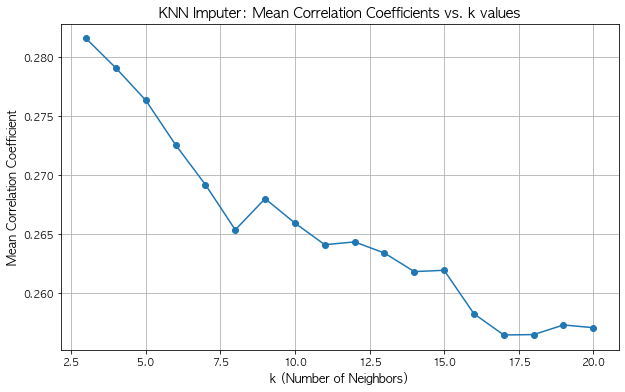

In [94]:
from sklearn.impute import KNNImputer

k_values = [i for i in range(3, 21)]

correlation_results = {}

for k in k_values:
    imputer = KNNImputer(n_neighbors=k)
    test_a_imputed = pd.DataFrame(imputer.fit_transform(test_a_drop), columns=test_a_drop.columns)

    corr_matrix = test_a_imputed.corr(method='pearson')
    mean_corr = corr_matrix.abs().mean().mean()  # 절대값 평균 상관계수 저장
    correlation_results[k] = mean_corr

plt.figure(figsize=(10, 6))
plt.plot(list(correlation_results.keys()), list(correlation_results.values()), marker='o')
plt.title("KNN Imputer: Mean Correlation Coefficients vs. k values", fontsize=14)
plt.xlabel("k (Number of Neighbors)", fontsize=12)
plt.ylabel("Mean Correlation Coefficient", fontsize=12)
plt.grid(True)
plt.show()

### A_31 데이터의 경우, k=3에서 평균 상관계수가 가장 높아 데이터의 변수간 관계를 가장 잘 보존했다고 볼 수 있지만, 노이즈나 이상치의 영향에 있어서 안정성을 확보하기 위해 k=9로 진행합니다.

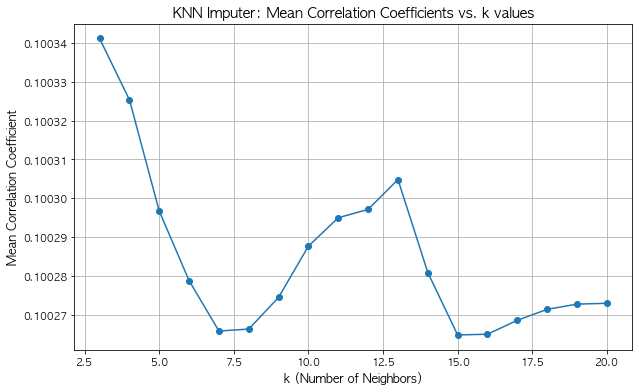

In [95]:
from sklearn.impute import KNNImputer

k_values = [i for i in range(3, 21)]

correlation_results = {}

for k in k_values:
    imputer = KNNImputer(n_neighbors=k)
    test_to_imputed = pd.DataFrame(imputer.fit_transform(test_to_drop), columns=test_to_drop.columns)

    corr_matrix = test_to_imputed.corr(method='pearson')
    mean_corr = corr_matrix.abs().mean().mean()  # 절대값 평균 상관계수 저장
    correlation_results[k] = mean_corr

plt.figure(figsize=(10, 6))
plt.plot(list(correlation_results.keys()), list(correlation_results.values()), marker='o')
plt.title("KNN Imputer: Mean Correlation Coefficients vs. k values", fontsize=14)
plt.xlabel("k (Number of Neighbors)", fontsize=12)
plt.ylabel("Mean Correlation Coefficient", fontsize=12)
plt.grid(True)
plt.show()

### T_31/O_31 데이터의 경우, 마찬가지로 안정성까지 고려하여 k=13으로 진행합니다.

In [96]:
from sklearn.impute import KNNImputer
import pandas as pd

print(test_a_drop.shape)

numeric_cols = test_a_drop.select_dtypes(include=['number']).columns
categorical_cols = test_a_drop.select_dtypes(exclude=['number']).columns
numeric_data = test_a_drop[numeric_cols]
categorical_data = test_a_drop[categorical_cols]

imputer = KNNImputer(n_neighbors=9)
numeric_imputed = imputer.fit_transform(numeric_data)

numeric_imputed_df = pd.DataFrame(numeric_imputed, columns=numeric_cols, index=numeric_data.index)
test_a_imputed = pd.concat([numeric_imputed_df, categorical_data], axis=1)
test_a_imputed = test_a_imputed[test_a_drop.columns] #컬럼 순서 조정

print(test_a_imputed.shape)
test_a_imputed

(67, 1865)
(67, 1865)


,X_128,X_129,X_130,X_131,X_132,X_133,X_134,X_136,X_137,X_138,...,X_2861,X_2862,X_2863,X_2864,X_2865,X_2866,X_2867,X_2868,X_2869,X_2870
3,13178.333333,13178.333333,14127.555556,17884.888889,0.205556,0.216667,0.205556,460.333333,459.888889,455.888889,...,191.450000,183.8,467.0,444.192308,423.0,51.992222,53.868889,48.522222,54.187778,63.988889
4,13178.333333,13178.333333,14127.555556,17884.888889,0.205556,0.216667,0.205556,460.333333,459.888889,455.888889,...,193.082143,179.7,465.0,443.211539,423.0,51.992222,53.868889,48.522222,54.187778,63.988889
5,14489.000000,14489.000000,15120.111111,19950.555556,0.207778,0.218889,0.206667,623.555556,622.666667,614.333333,...,192.375862,181.7,466.0,441.830189,422.0,51.453333,51.791111,50.037778,55.330000,64.724444
6,14489.000000,14489.000000,15120.111111,19950.555556,0.207778,0.218889,0.206667,623.555556,622.666667,614.333333,...,194.351724,175.1,464.0,445.075472,423.0,51.453333,51.791111,50.037778,55.330000,64.724444
7,18031.000000,18031.000000,14683.000000,19513.666667,0.190000,0.200000,0.190000,354.000000,354.000000,354.000000,...,190.800000,168.3,384.0,369.462963,354.0,57.740000,52.510000,54.450000,57.990000,63.160000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284,13178.333333,13178.333333,19591.000000,24422.000000,0.210000,0.220000,0.210000,806.000000,805.000000,796.000000,...,174.146667,165.4,384.0,369.481481,352.0,52.970000,58.060000,44.110000,56.330000,62.000000
285,13178.333333,13178.333333,19621.000000,24452.000000,0.210000,0.220000,0.210000,806.000000,805.000000,796.000000,...,172.956667,157.8,384.0,369.203704,352.0,54.240000,55.550000,51.600000,48.530000,61.950000
286,13178.333333,13178.333333,19646.000000,24476.000000,0.210000,0.220000,0.210000,807.000000,806.000000,796.000000,...,176.496552,167.8,384.0,368.924528,352.0,58.060000,57.920000,49.060000,48.260000,62.770000
292,14489.000000,14489.000000,20153.000000,24984.000000,0.210000,0.220000,0.210000,821.000000,820.000000,810.000000,...,163.200000,154.9,383.0,365.056604,343.0,53.550000,52.680000,49.970000,56.660000,63.520000


In [97]:
from sklearn.impute import KNNImputer
import pandas as pd

print(test_to_drop.shape)

numeric_cols = test_to_drop.select_dtypes(include=['number']).columns
categorical_cols = test_to_drop.select_dtypes(exclude=['number']).columns
numeric_data = test_to_drop[numeric_cols]
categorical_data = test_to_drop[categorical_cols]

imputer = KNNImputer(n_neighbors=13)
numeric_imputed = imputer.fit_transform(numeric_data)

numeric_imputed_df = pd.DataFrame(numeric_imputed, columns=numeric_cols, index=numeric_data.index)
test_to_imputed = pd.concat([numeric_imputed_df, categorical_data], axis=1)
test_to_imputed = test_to_imputed[test_to_drop.columns] #컬럼 순서 조정

print(test_to_imputed.shape)
test_to_imputed

(243, 551)
(243, 551)


,X_1,X_2,X_5,X_7,X_8,X_9,X_11,X_12,X_13,X_15,...,X_924,X_925,X_926,X_927,X_928,X_929,X_930,X_931,X_932,X_933
0,2.0,94.0,10.0,51.0,10.0,52.0,469.6,474.4,461.0,0.0,...,174.1,160.1,154.370000,150.0,317.0,302.909091,288.0,13.6,13.383871,13.2
1,2.0,93.0,11.0,45.0,10.0,31.0,506.6,511.1,500.1,0.0,...,169.8,155.0,148.177419,141.4,327.0,312.600000,298.0,13.6,13.406452,13.2
2,2.0,95.0,11.0,45.0,10.0,31.0,506.6,511.4,500.6,0.0,...,173.9,162.8,158.951613,157.1,326.0,306.327273,289.0,13.6,13.370968,13.2
15,2.0,102.0,11.0,45.0,10.0,31.0,520.3,526.3,513.6,0.0,...,163.6,170.5,162.477419,152.6,317.0,303.454545,289.0,13.6,13.387097,13.2
16,2.0,93.0,10.0,54.0,10.0,52.0,472.5,476.8,463.4,0.0,...,171.0,172.2,165.690323,159.8,324.0,304.854546,289.0,13.6,13.367742,13.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305,2.0,91.0,10.0,51.0,10.0,52.0,502.5,511.9,488.3,0.0,...,169.2,161.8,152.251613,142.9,326.0,313.072727,294.0,13.6,13.341935,13.2
306,2.0,96.0,11.0,45.0,10.0,31.0,513.7,518.9,505.0,0.0,...,162.3,159.3,154.830000,152.4,326.0,307.796296,290.0,13.6,13.406452,13.2
307,2.0,91.0,10.0,50.0,10.0,52.0,502.8,511.6,489.8,0.0,...,169.3,158.0,150.909677,145.0,323.0,304.418182,289.0,13.6,13.361290,13.2
308,2.0,95.0,10.0,51.0,10.0,52.0,503.2,512.6,489.8,0.0,...,168.4,162.6,153.073333,141.9,326.0,307.018182,290.0,13.6,13.335484,13.2


In [98]:
# 결측치 처리한 T_31/O_31 test 데이터
test_to_imputed.to_csv('./data/2_pca/test_to_imputed.csv', index = False)

### PCA를 적용시키기 전에 데이터를 스케일링합니다.

In [99]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
train_a_scaled = scaler.fit_transform(a_df_imputed)  # train 데이터를 기준으로 스케일링 학습 및 변환
test_a_scaled = scaler.transform(test_a_imputed)

In [100]:
from sklearn.decomposition import PCA

pca = PCA(n_components=29)  # 주성분 30개로 축소
train_a_pca = pca.fit_transform(train_a_scaled)  # train 데이터 변환
test_a_pca = pca.transform(test_a_scaled)        # 동일한 PCA로 test 데이터 변환

print("Train 데이터 원래 크기:", a_df_imputed.shape)
print("Test 데이터 원래 크기:", test_a_drop.shape)
print("Train 데이터 PCA 크기:", train_a_pca.shape)
print("Test 데이터 PCA 크기:", test_a_pca.shape)

Train 데이터 원래 크기: (249, 1865)
Test 데이터 원래 크기: (67, 1865)
Train 데이터 PCA 크기: (249, 29)
Test 데이터 PCA 크기: (67, 29)


In [101]:
train_a_pca = pd.DataFrame(train_a_pca)
test_a_pca = pd.DataFrame(test_a_pca)

In [102]:
# PCA 적용시킨 훈련 데이터
train_a_pca.to_csv('./data/2_pca/train_a_pca.csv', index = False)

# PCA 적용시킨 테스트 데이터
test_a_pca.to_csv('./data/2_pca/test_a_pca.csv', index = False)

### 3. 상관성이 높은 특성에 민감하지 않은 트리기반 모델을 사용하기에 특성 모두 유지한다.

훈련 데이터에서 모든 값이 null값인 null컬럼과 고유값이 1개인 컬럼만 제거한 상태

In [104]:
a_df_uniqueX.to_csv('./data/3_keep_all_features/a_df_uniqueX.csv', index = False)
to_df_uniqueX.to_csv('./data/3_keep_all_features/to_df_uniqueX.csv', index = False)

In [105]:
test_a_drop = test_a[a_df_uniqueX.columns]
test_to_drop = test_to[to_df_uniqueX.columns]

In [106]:
test_a_drop.to_csv('./data/3_keep_all_features/test_a_drop.csv', index = False)
test_to_drop.to_csv('./data/3_keep_all_features/test_to_drop.csv', index = False)

### 4. 트리기반 모델로 Feature Importance 기반으로 중요도가 낮은 컬럼을 제거한다.

모든 값이 null값인 null컬럼과 고유값이 1개인 컬럼만 제거한 훈련 데이터를 넣고 특성 중요도를 기반으로 낮은 컬럼은 제거한다.

### train & test 데이터 준비

A

In [107]:
train_a = train_a.reset_index(drop=True)  # 인덱스 재설정해야 제대로 concat됨

In [108]:
train_x = pd.concat([train_a.LINE, a_df_uniqueX], axis = 1)
train_x

,LINE,X_128,X_129,X_130,X_131,X_132,X_133,X_134,X_136,X_137,...,X_2861,X_2862,X_2863,X_2864,X_2865,X_2866,X_2867,X_2868,X_2869,X_2870
0,T050304,7813.0,7813.0,NaN,NaN,0.19,0.20,0.19,228.0,228.0,...,197.286667,189.0,383.0,368.296296,353.0,39.34,40.89,32.56,34.09,77.77
1,T050307,NaN,NaN,19854.0,19854.0,0.20,0.21,0.20,413.0,414.0,...,193.296552,185.6,383.0,367.735849,353.0,38.89,42.82,43.92,35.34,72.55
2,T050304,7815.0,7815.0,NaN,NaN,0.19,0.20,0.19,228.0,228.0,...,179.820690,165.5,383.0,367.320755,353.0,39.19,36.65,42.47,36.53,78.35
3,T050307,NaN,NaN,19856.0,19856.0,0.20,0.21,0.20,414.0,414.0,...,181.920690,165.8,384.0,369.188679,353.0,37.74,39.17,52.17,30.58,71.78
4,T050304,7817.0,7817.0,NaN,NaN,0.19,0.20,0.18,228.0,228.0,...,196.393333,182.6,383.0,367.351852,352.0,38.70,41.89,46.93,33.09,76.97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244,T050304,11920.0,11920.0,NaN,NaN,0.19,0.20,0.19,230.0,230.0,...,191.993103,181.6,394.0,371.943396,353.0,51.71,59.64,54.61,57.05,63.18
245,T010305,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,195.682143,184.9,466.0,448.634615,432.0,NaN,NaN,NaN,NaN,NaN
246,T010306,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,187.396552,176.7,472.0,450.339623,432.0,NaN,NaN,NaN,NaN,NaN
247,T050304,14810.0,14810.0,NaN,NaN,0.19,0.20,0.19,304.0,304.0,...,180.810345,168.7,384.0,369.811321,353.0,49.47,53.07,50.89,55.10,66.49


In [109]:
train_y = train_a.Y_Class

In [110]:
a_index = test_a.index.tolist()

In [111]:
test_x = test_a[train_x.columns]
test_x

,LINE,X_128,X_129,X_130,X_131,X_132,X_133,X_134,X_136,X_137,...,X_2861,X_2862,X_2863,X_2864,X_2865,X_2866,X_2867,X_2868,X_2869,X_2870
3,T010305,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,191.450000,183.8,467.0,444.192308,423.0,NaN,NaN,NaN,NaN,NaN
4,T010306,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,193.082143,179.7,465.0,443.211539,423.0,NaN,NaN,NaN,NaN,NaN
5,T010306,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,192.375862,181.7,466.0,441.830189,422.0,NaN,NaN,NaN,NaN,NaN
6,T010305,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,194.351724,175.1,464.0,445.075472,423.0,NaN,NaN,NaN,NaN,NaN
7,T050304,18031.0,18031.0,NaN,NaN,0.19,0.20,0.19,354.0,354.0,...,190.800000,168.3,384.0,369.462963,354.0,57.74,52.51,54.45,57.99,63.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284,T050307,NaN,NaN,19591.0,24422.0,0.21,0.22,0.21,806.0,805.0,...,174.146667,165.4,384.0,369.481481,352.0,52.97,58.06,44.11,56.33,62.00
285,T050307,NaN,NaN,19621.0,24452.0,0.21,0.22,0.21,806.0,805.0,...,172.956667,157.8,384.0,369.203704,352.0,54.24,55.55,51.60,48.53,61.95
286,T050307,NaN,NaN,19646.0,24476.0,0.21,0.22,0.21,807.0,806.0,...,176.496552,167.8,384.0,368.924528,352.0,58.06,57.92,49.06,48.26,62.77
292,T050307,NaN,NaN,20153.0,24984.0,0.21,0.22,0.21,821.0,820.0,...,163.200000,154.9,383.0,365.056604,343.0,53.55,52.68,49.97,56.66,63.52


In [112]:
qual_col = ['LINE']

for i in qual_col:
    le = LabelEncoder()
    le = le.fit(train_x[i]) #원래 column 값을 기준으로 fit.
    train_x[i] = le.transform(train_x[i]) #수치화, 수치로 변형
    
    for label in np.unique(test_x[i]): 
        if label not in le.classes_: 
            le.classes_ = np.append(le.classes_, label)
    test_x[i] = le.transform(test_x[i])

/var/folders/rc/3jzqjhp56_v2qxb49fkb1x880000gn/T/ipykernel_50994/1253392196.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_x[i] = le.transform(test_x[i])


In [113]:
train_x.LINE.unique(), test_x.LINE.unique()

(array([2, 3, 1, 0]), array([0, 1, 2, 3]))

하이퍼 파라미터는 gridsearchcv를 이용해 튜닝했습니다.(생략)

In [114]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, train_test_split

X_train, X_val, y_train, y_val = train_test_split(
    train_x, train_y, test_size=0.2, stratify=train_y, random_state=37
)

xgb_model_a = XGBClassifier(
    random_state=37,
    objective = 'multi:softmax',
    num_class = 3,
    n_estimators=500,
    eval_metric='mlogloss',
    max_depth = 5,
    learning_rate = 0.1,
    colsample_bytree = 0.9,
    min_child_weight = 1,
    min_split_loss = 0.3,
    reg_lambda = 2,
    reg_alpha = 0,
    subsample = 0.9,
    use_label_encoder=False
)


xgb_model_a.fit(X_train, y_train,
               eval_set = [(X_train, y_train), (X_val, y_val)],
               early_stopping_rounds=10)

preds_a = xgb_model_a.predict(test_x)

/Users/kimminyoung/opt/anaconda3/envs/smartfactory/lib/python3.9/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-mlogloss:1.00381	validation_1-mlogloss:1.06846
[1]	validation_0-mlogloss:0.92592	validation_1-mlogloss:1.02386
[2]	validation_0-mlogloss:0.85580	validation_1-mlogloss:0.98949
[3]	validation_0-mlogloss:0.79732	validation_1-mlogloss:0.95884
[4]	validation_0-mlogloss:0.73736	validation_1-mlogloss:0.93452
[5]	validation_0-mlogloss:0.68662	validation_1-mlogloss:0.91140
[6]	validation_0-mlogloss:0.63696	validation_1-mlogloss:0.90186
[7]	validation_0-mlogloss:0.59196	validation_1-mlogloss:0.88593
[8]	validation_0-mlogloss:0.55379	validation_1-mlogloss:0.86681
[9]	validation_0-mlogloss:0.52131	validation_1-mlogloss:0.84707
[10]	validation_0-mlogloss:0.48820	validation_1-mlogloss:0.83380
[11]	validation_0-mlogloss:0.45748	validation_1-mlogloss:0.82601
[12]	validation_0-mlogloss:0.43198	validation_1-mlogloss:0.82380
[13]	validation_0-mlogloss:0.40670	validation_1-mlogloss:0.81589
[14]	validation_0-mlogloss:0.38498	validation_1-mlogloss:0.81023
[15]	validation_0-mlogloss:0.36376	

In [115]:
importance = xgb_model_a.get_booster().get_score(importance_type='weight')  # 'weight', 'gain', 'cover' 중 선택 가능

# 딕셔너리를 데이터프레임으로 변환
importance_df = pd.DataFrame({
    'Feature': list(importance.keys()),
    'Importance': list(importance.values())
})

# 중요도 기준으로 정렬
importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)
importance_df

,Feature,Importance
0,X_318,37.0
1,X_256,20.0
2,X_248,19.0
3,X_1743,12.0
4,X_2728,12.0
...,...,...
340,X_1424,1.0
341,X_1425,1.0
342,X_945,1.0
343,X_1445,1.0


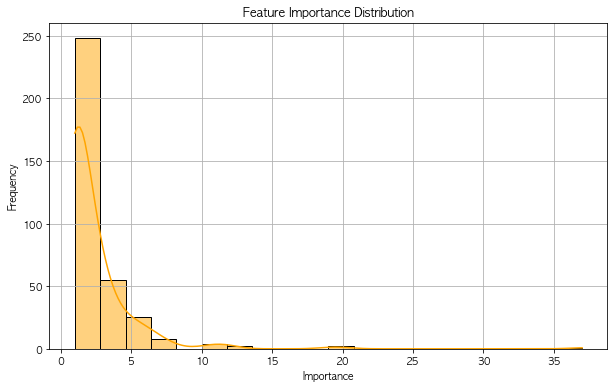

In [116]:
plt.figure(figsize=(10, 6))
sns.histplot(importance_df['Importance'], bins=20, kde=True, color='orange')
plt.title('Feature Importance Distribution')
plt.xlabel('Importance')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

### feature importance가 0인 컬럼은 자연스레 결과에서 삭제되었으므로 importance_df 데이터프레임의 컬럼들만 필터링한다.

In [117]:
a_important_features = importance_df.Feature.values.tolist()
a_df_importantFeature = train_x[a_important_features]
a_df_importantFeature

,X_318,X_256,X_248,X_1743,X_2728,X_1048,X_1569,X_189,X_130,X_1010,...,X_1403,X_955,X_1417,X_1418,X_1421,X_1424,X_1425,X_945,X_1445,X_2869
0,NaN,NaN,NaN,9.91,1.096296,64.760870,486.677419,8.23,NaN,8.24,...,2494.130435,51.0,10.435484,21549.03226,323.064516,33.190323,6.816129,20.306452,64.760870,34.09
1,NaN,NaN,NaN,4.59,1.000000,65.021739,486.593750,8.00,19854.0,8.00,...,2492.456522,62.0,10.450000,21616.87500,323.500000,33.240625,6.765625,20.300000,65.021739,35.34
2,NaN,NaN,NaN,9.95,1.100000,64.804348,486.645161,8.23,NaN,8.24,...,2495.543478,69.0,10.519355,21685.12903,324.516129,33.293548,6.800000,20.461290,64.804348,36.53
3,NaN,NaN,NaN,4.61,1.000000,64.695652,486.531250,8.00,19856.0,8.00,...,2494.130435,68.0,10.581250,21778.00000,323.031250,33.690625,6.840625,20.537500,64.695652,30.58
4,NaN,NaN,NaN,9.92,1.100000,64.847826,486.935484,8.23,NaN,8.24,...,2495.413043,59.0,10.364516,22211.16129,327.806452,33.200000,6.751613,20.406452,64.847826,33.09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
244,NaN,NaN,NaN,5.53,1.096296,64.466667,NaN,8.16,NaN,8.18,...,2497.266667,-2.0,NaN,NaN,NaN,NaN,NaN,NaN,64.466667,57.05
245,9.59,465.0,0.0,NaN,NaN,76.911111,668.593750,NaN,NaN,NaN,...,2607.822222,43.0,10.100000,28892.50000,199.906250,34.331250,6.825000,24.103125,76.911111,NaN
246,9.57,480.5,63.0,NaN,NaN,76.822222,667.774193,NaN,NaN,NaN,...,2605.800000,45.0,10.067742,29651.32258,200.419355,34.212903,6.812903,24.022581,76.822222,NaN
247,NaN,NaN,NaN,5.68,1.100000,64.304348,486.612903,8.06,NaN,8.08,...,2509.217391,11.0,11.670968,38602.54839,318.322581,35.593548,7.512903,23.200000,64.304348,55.10


TO

In [120]:
train_to = train_to.reset_index(drop=True)  # 인덱스 재설정해야 제대로 concat됨
to_df_uniqueX = to_df_uniqueX.reset_index(drop=True)   # 인덱스 재설정

In [121]:
train_x = pd.concat([train_to.LINE, to_df_uniqueX], axis = 1)
train_x

,LINE,X_1,X_2,X_5,X_7,X_8,X_9,X_11,X_12,X_13,...,X_924,X_925,X_926,X_927,X_928,X_929,X_930,X_931,X_932,X_933
0,T100304,2.0,102.0,11.0,45.0,10.0,31.0,514.4,522.1,505.8,...,172.5,162.8,157.235484,150.9,326.0,309.290909,290.0,13.7,13.443333,13.2
1,T100304,2.0,102.0,11.0,45.0,10.0,31.0,514.6,522.6,506.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,T100304,2.0,97.0,11.0,45.0,10.0,31.0,517.4,526.0,508.9,...,177.8,157.1,154.074194,150.9,327.0,310.854546,298.0,13.7,13.454839,13.2
3,T100306,2.0,95.0,10.0,54.0,10.0,52.0,477.4,482.4,470.2,...,166.9,158.5,151.096774,146.5,327.0,313.618182,299.0,13.7,13.461290,13.3
4,T100304,2.0,100.0,11.0,45.0,10.0,31.0,516.5,526.0,507.5,...,177.9,161.3,156.038710,149.1,327.0,312.109091,298.0,13.7,13.422581,13.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
344,T100306,1.0,87.0,10.0,50.0,10.0,52.0,465.9,470.5,456.8,...,177.0,159.6,154.777419,147.7,326.0,313.472727,298.0,13.6,13.400000,13.2
345,T100304,2.0,98.0,10.0,45.0,10.0,31.0,505.5,510.6,498.8,...,171.5,156.6,152.535484,147.6,326.0,312.472727,298.0,13.6,13.361290,13.2
346,T100306,2.0,95.0,10.0,50.0,10.0,52.0,468.9,473.9,459.2,...,172.8,161.2,155.438710,149.0,327.0,313.363636,298.0,13.6,13.351613,13.2
347,T100304,40.0,94.0,11.0,45.0,10.0,31.0,505.8,510.9,497.1,...,189.2,179.5,173.190323,168.6,321.0,303.036364,289.0,13.6,13.406667,13.2


In [122]:
train_y = train_to.Y_Class

In [123]:
to_index = test_to.index.tolist()

In [124]:
test_x = test_to[train_x.columns]
test_x

,LINE,X_1,X_2,X_5,X_7,X_8,X_9,X_11,X_12,X_13,...,X_924,X_925,X_926,X_927,X_928,X_929,X_930,X_931,X_932,X_933
0,T100306,2.0,94.0,10.0,51.0,10.0,52.0,469.6,474.4,461.0,...,174.1,160.1,154.370000,150.0,317.0,302.909091,288.0,13.6,13.383871,13.2
1,T100304,2.0,93.0,11.0,45.0,10.0,31.0,506.6,511.1,500.1,...,169.8,155.0,148.177419,141.4,327.0,312.600000,298.0,13.6,13.406452,13.2
2,T100304,2.0,95.0,11.0,45.0,10.0,31.0,506.6,511.4,500.6,...,173.9,162.8,158.951613,157.1,326.0,306.327273,289.0,13.6,13.370968,13.2
15,T100304,2.0,102.0,11.0,45.0,10.0,31.0,520.3,526.3,513.6,...,163.6,170.5,162.477419,152.6,317.0,303.454545,289.0,13.6,13.387097,13.2
16,T100306,2.0,93.0,10.0,54.0,10.0,52.0,472.5,476.8,463.4,...,171.0,172.2,165.690323,159.8,324.0,304.854546,289.0,13.6,13.367742,13.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305,T100306,2.0,91.0,10.0,51.0,10.0,52.0,502.5,511.9,488.3,...,169.2,161.8,152.251613,142.9,326.0,313.072727,294.0,13.6,13.341935,13.2
306,T100304,2.0,96.0,11.0,45.0,10.0,31.0,513.7,518.9,505.0,...,162.3,159.3,154.830000,152.4,326.0,307.796296,290.0,13.6,13.406452,13.2
307,T100306,2.0,91.0,10.0,50.0,10.0,52.0,502.8,511.6,489.8,...,169.3,158.0,150.909677,145.0,323.0,304.418182,289.0,13.6,13.361290,13.2
308,T100306,2.0,95.0,10.0,51.0,10.0,52.0,503.2,512.6,489.8,...,168.4,162.6,153.073333,141.9,326.0,307.018182,290.0,13.6,13.335484,13.2


In [125]:
qual_col = ['LINE']

for i in qual_col:
    le = LabelEncoder()
    le = le.fit(train_x[i]) #원래 column 값을 기준으로 fit.
    train_x[i] = le.transform(train_x[i]) #수치화, 수치로 변형
    
    for label in np.unique(test_x[i]): 
        if label not in le.classes_: 
            le.classes_ = np.append(le.classes_, label)
    test_x[i] = le.transform(test_x[i])

/var/folders/rc/3jzqjhp56_v2qxb49fkb1x880000gn/T/ipykernel_50994/1253392196.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_x[i] = le.transform(test_x[i])


In [126]:
train_x.LINE.unique(), test_x.LINE.unique()

(array([0, 1]), array([1, 0]))

T_31/O_31 제품 데이터의 하이퍼 파라미터 튜닝도 생략합니다.

In [128]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, train_test_split

X_train, X_val, y_train, y_val = train_test_split(
    train_x, train_y, test_size=0.2, stratify=train_y, random_state=37
)

xgb_model_to = XGBClassifier(
    random_state=37,
    objective = 'multi:softmax',
    num_class = 3,
    n_estimators=500,
    eval_metric='mlogloss',
    max_depth = 6,
    learning_rate = 0.1,
    colsample_bytree = 0.9,
    min_child_weight = 1,
    min_split_loss = 0.3,
    reg_lambda = 2,
    reg_alpha = 0,
    subsample = 0.9,
    use_label_encoder=False
)


xgb_model_to.fit(X_train, y_train,
               eval_set = [(X_train, y_train), (X_val, y_val)],
               early_stopping_rounds=10)

preds_to = xgb_model_to.predict(test_x)

[0]	validation_0-mlogloss:0.99175	validation_1-mlogloss:1.01215
[1]	validation_0-mlogloss:0.89939	validation_1-mlogloss:0.94415
[2]	validation_0-mlogloss:0.82209	validation_1-mlogloss:0.88683
[3]	validation_0-mlogloss:0.75358	validation_1-mlogloss:0.84064
[4]	validation_0-mlogloss:0.69433	validation_1-mlogloss:0.79881


/Users/kimminyoung/opt/anaconda3/envs/smartfactory/lib/python3.9/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-mlogloss:0.63803	validation_1-mlogloss:0.76770
[6]	validation_0-mlogloss:0.58844	validation_1-mlogloss:0.73868
[7]	validation_0-mlogloss:0.54567	validation_1-mlogloss:0.71556
[8]	validation_0-mlogloss:0.50584	validation_1-mlogloss:0.69585
[9]	validation_0-mlogloss:0.46941	validation_1-mlogloss:0.67785
[10]	validation_0-mlogloss:0.43728	validation_1-mlogloss:0.65903
[11]	validation_0-mlogloss:0.40869	validation_1-mlogloss:0.64412
[12]	validation_0-mlogloss:0.38174	validation_1-mlogloss:0.63312
[13]	validation_0-mlogloss:0.35561	validation_1-mlogloss:0.62233
[14]	validation_0-mlogloss:0.33260	validation_1-mlogloss:0.61179
[15]	validation_0-mlogloss:0.30938	validation_1-mlogloss:0.60460
[16]	validation_0-mlogloss:0.28958	validation_1-mlogloss:0.59857
[17]	validation_0-mlogloss:0.27045	validation_1-mlogloss:0.59292
[18]	validation_0-mlogloss:0.25318	validation_1-mlogloss:0.58834
[19]	validation_0-mlogloss:0.23924	validation_1-mlogloss:0.58307
[20]	validation_0-mlogloss:0.2

In [129]:
importance = xgb_model_to.get_booster().get_score(importance_type='weight')  # 'weight', 'gain', 'cover' 중 선택 가능

# 딕셔너리를 데이터프레임으로 변환
importance_df = pd.DataFrame({
    'Feature': list(importance.keys()),
    'Importance': list(importance.values())
})

# 중요도 기준으로 정렬
importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)
importance_df

,Feature,Importance
0,X_73,32.0
1,X_718,23.0
2,X_838,22.0
3,X_124,22.0
4,X_932,21.0
...,...,...
235,X_402,1.0
236,X_412,1.0
237,X_416,1.0
238,X_610,1.0


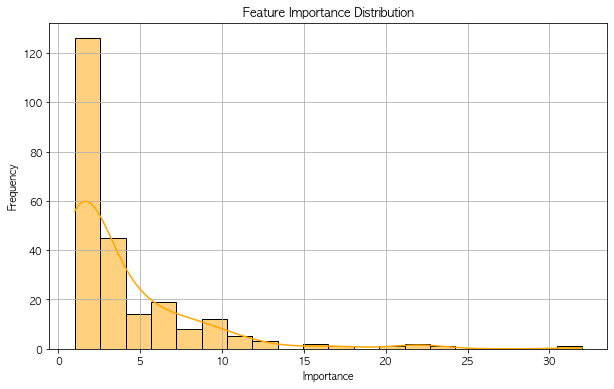

In [130]:
plt.figure(figsize=(10, 6))
sns.histplot(importance_df['Importance'], bins=20, kde=True, color='orange')
plt.title('Feature Importance Distribution')
plt.xlabel('Importance')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [131]:
to_important_features = importance_df.Feature.values.tolist()
to_df_importantFeature = train_x[to_important_features]
to_df_importantFeature

,X_73,X_718,X_838,X_124,X_932,X_516,X_678,X_698,X_783,X_401,...,X_396,X_656,X_654,X_637,X_632,X_402,X_412,X_416,X_610,X_1
0,9.62,16.933333,12.800000,11390.0,13.443333,172.5,2.0,148.500,NaN,294.387755,...,-70.0,3.254545,109.654545,0.5,0.0,287.0,35.2,167.900000,0.1,2.0
1,9.62,NaN,NaN,11402.0,NaN,NaN,NaN,113.810,14.916667,295.346939,...,NaN,NaN,NaN,NaN,NaN,288.0,NaN,NaN,NaN,2.0
2,9.73,18.032258,13.161290,12886.0,13.454839,177.8,2.0,141.425,14.035398,291.428571,...,-80.0,2.709091,110.563636,1.5,0.3,284.0,35.7,163.548387,0.1,2.0
3,10.09,17.935484,13.161290,NaN,13.461290,166.9,2.0,143.350,14.036697,292.285714,...,-70.0,2.818182,112.709091,0.1,0.5,285.0,35.7,165.419355,0.1,2.0
4,9.82,17.290323,12.870968,13107.0,13.422581,177.9,2.0,146.505,14.074074,295.755102,...,-70.0,2.654545,111.963636,1.0,1.1,287.0,36.7,177.129032,0.1,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
344,10.09,17.677419,12.193548,NaN,13.400000,177.0,2.0,158.750,13.383333,306.204082,...,-80.0,2.854545,110.018182,0.5,0.7,299.0,37.2,174.032258,0.1,1.0
345,10.19,17.193548,11.903226,1569.0,13.361290,171.5,2.0,87.705,13.129032,306.632653,...,-70.0,2.745455,112.072727,1.0,1.3,299.0,36.7,176.032258,0.1,2.0
346,10.09,16.967742,11.741935,NaN,13.351613,172.8,2.0,113.145,13.093458,306.653061,...,-80.0,2.436364,112.254546,0.5,1.4,299.0,36.7,171.419355,0.1,2.0
347,10.22,18.633333,12.400000,2263.0,13.406667,189.2,1.0,101.750,13.025641,300.060000,...,-70.0,3.345455,107.927273,0.5,1.0,295.0,35.7,171.900000,0.1,40.0


In [132]:
a_df_importantFeature = pd.concat([train_a.LINE, a_df_importantFeature], axis = 1)
to_df_importantFeature = pd.concat([train_to.LINE, to_df_importantFeature], axis = 1)

In [133]:
a_df_importantFeature.to_csv('./data/4_feature_importance/a_df_importantFeature.csv', index = False)
to_df_importantFeature.to_csv('./data/4_feature_importance/to_df_importantFeature.csv', index = False)

In [134]:
test_a_drop = test_a[a_df_importantFeature.columns]
test_to_drop = test_to[to_df_importantFeature.columns]

In [135]:
test_a_drop.to_csv('./data/4_feature_importance/test_a_drop.csv', index = False)
test_to_drop.to_csv('./data/4_feature_importance/test_to_drop.csv', index = False)

### 5. VIF 값이 높은 컬럼을 제거한다.

### 특정 컬럼들 간 상관관계가 매우 높을 경우, r_squared_i값이 1에 매우 가까워지면서

In [136]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF 계산 함수
def calculate_vif(df):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = df.columns
    vif_data["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif_data

# VIF 값이 threshold를 초과하는 컬럼을 반복적으로 제거하는 함수
def remove_high_vif_columns(df, threshold=10.0):
    while True:
        vif_data = calculate_vif(df)
        max_vif = vif_data["VIF"].max()
        if max_vif > threshold:
            feature_to_remove = vif_data.loc[vif_data["VIF"].idxmax(), "Feature"]
            print(f"Removing feature: {feature_to_remove} (VIF: {max_vif})")
            df = df.drop(columns=[feature_to_remove])
        else:
            break
    return df, vif_data

In [137]:
numeric_features = a_df_coefX.select_dtypes(include=[np.number])  # 수치형 컬럼만 선택
a_reduced_VIF, a_final_vif = remove_high_vif_columns(numeric_features, threshold=10.0)

print("최종 컬럼:")
print(a_reduced_VIF.columns)
print("최종 VIF:")
print(a_final_vif)

Removing feature: X_2756 (VIF: 7594142054.395511)
Removing feature: X_2768 (VIF: 2333574083.5065255)
Removing feature: X_2753 (VIF: 2097744108.5346024)
Removing feature: X_2446 (VIF: 1821471299.4164004)
Removing feature: X_2771 (VIF: 1401049364.5861368)
Removing feature: X_2762 (VIF: 385971105.0751053)
Removing feature: X_2456 (VIF: 98754207.7027827)
Removing feature: X_2444 (VIF: 23428717.91239169)
Removing feature: X_2463 (VIF: 8933348.123406213)
Removing feature: X_1009 (VIF: 3651668.1368461936)
Removing feature: X_1163 (VIF: 1601297.1489930167)
Removing feature: X_2156 (VIF: 1250199.635023484)
Removing feature: X_2427 (VIF: 883759.7480037748)
Removing feature: X_1351 (VIF: 806943.028657289)
Removing feature: X_281 (VIF: 749407.0600270481)
Removing feature: X_2544 (VIF: 737822.110895524)
Removing feature: X_2128 (VIF: 619844.4421435699)
Removing feature: X_196 (VIF: 565380.201524357)
Removing feature: X_277 (VIF: 385902.5785881672)
Removing feature: X_2721 (VIF: 382796.9395218868)
R

In [138]:
numeric_features = to_df_coefX.select_dtypes(include=[np.number])  # 수치형 컬럼만 선택
to_reduced_VIF, to_final_vif = remove_high_vif_columns(numeric_features, threshold=10.0)

print("최종 컬럼:")
print(to_reduced_VIF.columns)
print("최종 VIF:")
print(to_final_vif)

Removing feature: X_696 (VIF: 3415560.079003525)
Removing feature: X_441 (VIF: 2731431.7280300977)
Removing feature: X_461 (VIF: 1359489.7988950373)
Removing feature: X_397 (VIF: 1083911.303091373)
Removing feature: X_453 (VIF: 777325.0711000926)
Removing feature: X_739 (VIF: 621598.2577824062)
Removing feature: X_442 (VIF: 555074.3945461584)
Removing feature: X_720 (VIF: 483896.335014149)
Removing feature: X_733 (VIF: 364045.2616769635)
Removing feature: X_908 (VIF: 320724.0675930244)
Removing feature: X_454 (VIF: 304781.8544483053)
Removing feature: X_468 (VIF: 272955.5921713129)
Removing feature: X_521 (VIF: 244833.78100573126)
Removing feature: X_511 (VIF: 228107.7692510141)
Removing feature: X_463 (VIF: 170302.2855345757)
Removing feature: X_864 (VIF: 169024.778279853)
Removing feature: X_721 (VIF: 152965.6099022858)
Removing feature: X_737 (VIF: 132593.20981154632)
Removing feature: X_735 (VIF: 100575.99892347852)
Removing feature: X_50 (VIF: 72348.42917321155)
Removing feature: 

In [139]:
a_vif_lst = a_final_vif.Feature.tolist()
to_vif_lst = to_final_vif.Feature.tolist()

In [140]:
a_df_vif = a_df_coefX[a_vif_lst]
to_df_vif = to_df_coefX[to_vif_lst]

In [141]:
a_df_vif.to_csv('./data/5_VIF/a_df_vif.csv', index = False)
to_df_vif.to_csv('./data/5_VIF/to_df_vif.csv', index = False)

In [142]:
test_a_drop = test_a[a_df_vif.columns]
test_to_drop = test_to[to_df_vif.columns]

In [143]:
test_a_drop.to_csv('./data/5_VIF/test_a_drop.csv', index = False)
test_to_drop.to_csv('./data/5_VIF/test_to_drop.csv', index = False)